# Análise Exploratória dos dados

In [31]:
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from scipy import signal
import scipy.stats as stats
from findpeaks import findpeaks


In [3]:
# Reading positive data
positives_df = pd.read_csv("C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\pos.csv")

In [4]:
# Reading negative data
negative_df = pd.read_csv("C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\neg.csv")

In [5]:
comertial_electrode = pd.read_csv('C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\comercial.csv', sep=';')
comertial_rodamine = pd.read_csv('C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\comercial_rodamina.csv', sep=';')
polimid = pd.read_csv('C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\Polimida.csv', sep=';')
polimid_rodamine = pd.read_csv('C:\\Users\\pveso\\Documents\\heart_attack_analysis\\data\\polimida_rodamina.csv', sep=';')

## Observando os datasets para verificar se não há valores faltando

* 1 - Eu observei que a taxa de amostragem é diferente entre o eletrodo comercial e o eletrodo de polimida; Por que?

In [6]:
comertial_electrode.head()

,V,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12,A13,A14,A15,A16,A17,A18
0,"0,649998","59,9268","56,3561","56,2829","56,97870255","57,7660799","58,08651447","57,42733479","57,69283772","57,6287508","57,68368244","57,43649006","56,97870255","57,53719807","57,23507404","57,86678791","57,66537189","58,13229084","57,60128498"
1,"0,648002","59,5514","55,9991","55,935","56,60333633","57,42733479","57,72030354","57,07027912","57,33578205","57,26253986","57,30831623","57,07027912","56,60333633","57,1801424","56,86883926","57,50973225","57,30831623","57,75692463","57,24422932"
2,"0,646005","59,1852","55,6695","55,6054","56,24628067","57,08858967","57,38155842","56,74066544","56,99701309","56,9237709","56,95123672","56,72235489","56,24628067","56,83221817","56,53009415","57,16183186","56,96954727","57,39986897","56,89630508"
3,"0,644009","58,8464","55,3491","55,285","55,89838028","56,75897598","57,0428133","56,42023087","56,66742325","56,58502579","56,61249161","56,39276505","55,89838028","56,50262833","56,19134903","56,83221817","56,63995743","57,05196857","56,56671524"
4,"0,642012","58,4985","55,0378","54,9737","55,56879044","56,42938614","56,71319962","56,09064102","56,3378334","56,25543594","56,27374649","56,0631752","55,55963516","56,17303848","55,86175919","56,50262833","56,31036758","56,72235489","56,2371254"


In [7]:
comertial_rodamine.head()

,V,Ac1 ac+R6G VC_1,Ac1 ac+R6G VC_2,Ac1 ac+R6G VC_3,Ac1 ac+R6G VC_4,Ac1 ac+R6G VC_5,Ac1 ac+R6G VC_6,Ac1 ac+R6G VC_7,Ac1 ac+R6G VC_8,Ac1 ac+R6G VC_9,Ac1 ac+R6G VC_10,Ac1 ac+R6G VC_11,Ac1 ac+R6G VC_12,Ac1 ac+R6G VC_13,Ac1 ac+R6G VC_14,Ac1 ac+R6G VC_15,Ac1 ac+R6G VC_16,Ac1 ac+R6G VC_17,Ac1 ac+R6G VC_18,Ac1 ac+R6G VC_19
0,"0,649998","59,1577","60,1831","59,6979","61,236","60,53102016","61,30006313","61,14442348","61,13526821","60,9338522","60,51270962","61,01624966","61,08949184","61,3458395","59,99999046","60,70497036","60,38453579","60,81483364","60,66834927","60,84229946"
1,"0,648002","57,8759","58,9563","58,352","59,9268","58,93797874","59,89012718","59,41405296","59,81688499","59,53307152","58,96544456","59,48729515","59,48729515","59,53307152","58,54427814","58,73656273","58,95628929","59,04784203","59,40489769","59,52391624"
2,"0,646005","57,2625","58,3429","57,7111","59,2859","58,20553303","59,23094749","58,63585472","59,1943264","58,85558128","58,26046467","58,76402855","58,75487328","58,69078636","57,86678791","57,84847736","58,29708576","58,27877522","58,7823391","58,8830471"
3,"0,644009","56,7773","57,8485","57,2168","58,7823","57,65621662","58,71825218","58,06820393","58,68163109","58,34286213","57,72030354","58,22384357","58,20553303","58,09566975","57,34493732","57,23507404","57,79354572","57,71114826","58,28793049","58,37032795"
4,"0,642012","56,3287","57,3999","56,759","58,3062","57,15267658","58,22384357","57,54635334","58,19637775","57,85763264","57,2167635","57,72030354","57,70199299","57,56466389","56,85968399","56,69488907","57,30831623","57,19845295","57,82101154","57,903409"


In [8]:
polimid.head()

,V,B5 13071,C2 13071,D6 13071,E3 13071
0,"0,550022","49,0867","48,986","51,9066","48,51"
1,"0,548026","45,6168","45,388","48,4001","44,7837"
2,"0,546029","44,2252","43,9048","46,862","43,2639"
3,"0,544033","43,3555","43,035","45,9464","42,3667"
4,"0,542036","42,6871","42,3575","45,2689","41,6983"


In [9]:
polimid_rodamine.head()

,V,A4 ac+rod becker 30s,C3 ac+rod becker 30s,D2 ac+rod becker 30s,E5 ac+rod becker 30s
0,"0,550022","42,6413","44,4907","43,3371","43,6301"
1,"0,548026","41,7258","43,447","42,1836","42,7695"
2,"0,546029","41,2589","42,9252","41,6983","42,211"
3,"0,544033","40,8194","42,5132","41,2039","41,7624"
4,"0,542036","40,5447","42,1286","40,7828","41,4328"


In [10]:
comertial_electrode.tail()

,V,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12,A13,A14,A15,A16,A17,A18
1048,"0,642012","53,1518","49,0227","49,041","52,1263361","50,24032593","51,21080875","50,35934448","50,68893433","51,37560368","52,52919197","51,27489567","52,16295719","51,41222477","50,89037418","51,0917902","49,98397827","52,13549137","51,16503239"
1049,"0,644009","52,9961","48,8853","48,8945","51,96154118","50,09384155","51,05516911","50,20370483","50,53329468","51,21996403","52,37355232","51,11925602","51,99816227","51,26574039","50,74386597","50,93615055","49,8374939","51,97985172","51,01854801"
1050,"0,646005","52,8405","48,748","48,7572","51,80590153","49,94735718","50,89952946","50,05722046","50,37765503","51,05516911","52,20873356","50,96361637","51,83336735","51,11010075","50,59738159","50,78966618","49,70016479","51,82421207","50,86290836"
1051,"0,648002","52,694","48,6015","48,6198","51,64110661","49,81002808","50,75302124","49,91073608","50,23117065","50,89952946","52,04393864","50,80797672","51,65941715","50,96361637","50,45089722","50,64315796","49,56283569","51,66857243","50,71640015"
1052,"0,649998","52,5383","48,4733","48,4916","51,49462223","49,6635437","50,59738159","49,76425171","50,08468628","50,74386597","51,87914371","50,66146851","51,49462223","50,817132","50,30441284","50,48751831","49,41635132","51,52208805","50,5607605"


In [11]:
comertial_rodamine.tail()

,V,Ac1 ac+R6G VC_1,Ac1 ac+R6G VC_2,Ac1 ac+R6G VC_3,Ac1 ac+R6G VC_4,Ac1 ac+R6G VC_5,Ac1 ac+R6G VC_6,Ac1 ac+R6G VC_7,Ac1 ac+R6G VC_8,Ac1 ac+R6G VC_9,Ac1 ac+R6G VC_10,Ac1 ac+R6G VC_11,Ac1 ac+R6G VC_12,Ac1 ac+R6G VC_13,Ac1 ac+R6G VC_14,Ac1 ac+R6G VC_15,Ac1 ac+R6G VC_16,Ac1 ac+R6G VC_17,Ac1 ac+R6G VC_18,Ac1 ac+R6G VC_19
1048,"0,642012","56,466","57,9217","57,6562","57,7203","58,25130939","58,12313557","58,65416527","58,17806721","58,02242756","57,89425373","58,80064964","58,82811546","59,75279808","57,32662678","58,69078636","57,84847736","58,04989338","57,43649006","57,38155842"
1049,"0,644009","56,3745","57,821","57,583","57,6196","58,15975666","58,04073811","58,56258869","58,0773592","57,92171955","57,79354572","58,70909691","58,745718","59,67955589","57,23507404","58,61754417","57,74776936","57,95834064","57,33578205","57,28085041"
1050,"0,646005","56,2554","57,702","57,4731","57,5006","58,04989338","57,92171955","58,45272541","57,94918537","57,79354572","57,66537189","58,59005451","58,62669945","59,56969261","57,11605549","58,49850178","57,6287508","57,83932209","57,20760822","57,15267658"
1051,"0,648002","56,1547","57,6013","57,3907","57,3907","57,96749592","57,82101154","58,34286213","57,83932209","57,68368244","57,57381916","58,50765705","58,53512287","59,48729515","57,00616837","58,41610432","57,52804279","57,74776936","57,10690022","57,05196857"
1052,"0,649998","56,054","57,4914","57,2992","57,29","57,86678791","57,72945881","58,25130939","57,72945881","57,58297443","57,47311115","58,40694904","58,43441486","59,41405296","56,89630508","58,33370686","57,41817951","57,65621662","57,00616837","56,93292618"


In [12]:
polimid.tail()

,V,B5 13071,C2 13071,D6 13071,E3 13071
698,"0,542036","50,4234","51,5404","50,8904","50,6706"
699,"0,544033","50,4509","51,5862","50,9361","50,7073"
700,"0,546029","50,4875","51,6594","50,9911","50,7713"
701,"0,548026","50,5425","51,751","51,0643","50,8446"
702,"0,550022","50,5333","51,7418","51,0735","50,8629"


In [13]:
polimid_rodamine.tail()

,V,A4 ac+rod becker 30s,C3 ac+rod becker 30s,D2 ac+rod becker 30s,E5 ac+rod becker 30s
698,"0,542036","48,51","50,8263","48,0888","49,5079"
699,"0,544033","48,3909","50,7347","47,9973","49,398"
700,"0,546029","48,2902","50,6432","47,8965","49,2882"
701,"0,548026","48,1987","50,5608","47,8416","49,2058"
702,"0,550022","48,0888","50,4509","47,7226","49,0593"


In [14]:
print(comertial_electrode.isna().any().sum())
print(comertial_rodamine.isna().any().sum())
print(polimid.isna().any().sum())
print(polimid_rodamine.isna().any().sum())

0
0
0
0


In [15]:
positives_df.head()

,Potencial (V),Paciente A (1),Paciente A (2),Paciente A (3),Paciente B (1),Paciente B (2),Paciente B (3),Paciente C (1),Paciente C (2),Paciente C (3),...,Paciente F (3),Paciente G (1),Paciente G (2),Paciente G (3),Paciente H (1),Paciente H (2),Paciente H (3),Paciente I (1),Paciente I (2),Paciente I (3)
0,"-0,499957144","-66,34469032","-72,02105522","-68,54200363","-72,4697","-64,0833","-63,2685","-63,25931549","-62,14237213","-62,61844635",...,"-62,90721893","-80,40750027","-73,1574297","-63,90726566","-74,09489155","-84,59508419","-79,03242111","-72,7824","-65,8448","-70,7823"
1,"-0,497960716","-62,41703033","-68,02930832","-64,1657114","-67,5532","-59,4507","-58,8464","-58,70909691","-57,79354572","-58,01327229",...,"-59,65721607","-76,84493065","-69,65732574","-60,71972847","-70,34480572","-79,97000217","-74,90742207","-69,5323","-61,6572","-67,5948"
2,"-0,495964319","-59,61546898","-65,1819706","-61,06202602","-64,2847","-56,347","-55,8618","-55,70611954","-54,75394726","-54,98282909",...,"-56,71966076","-74,09489155","-67,71981716","-57,65712261","-68,03226471","-77,40747929","-72,03233242","-66,9073","-58,9072","-64,8447"
3,"-0,493967891","-57,54635334","-63,02127838","-58,77318382","-61,9867","-54,1955","-53,7835","-53,60951424","-52,57496834","-52,84962654",...,"-54,53205109","-72,40736485","-65,65725803","-55,7820797","-65,84477425","-74,78237152","-69,90730762","-64,2823","-57,3447","-62,4073"
4,"-0,491971463","-55,82513809","-61,22682095","-56,90546036","-60,1831","-52,4834","-52,1355","-51,9523859","-50,82628727","-51,11925602",...,"-52,90710926","-70,53232193","-64,032197","-53,90703678","-64,15724754","-72,53241539","-68,09484959","-62,6572","-55,2821","-60,7822"


In [16]:
print("Positive Patients: {shape}".format(shape = positives_df.shape[1] / 3))
print("Negative Patients: {shape}".format(shape = negative_df.shape[1] / 3))
print("Numero de potenciais Negativos: {n}".format(n = negative_df.shape[0]))
print("Numero de potenciais Positivos: {n}".format(n = positives_df.shape[0]))

Positive Patients: 9.0
Negative Patients: 10.0
Numero de potenciais Negativos: 1500
Numero de potenciais Positivos: 1503


# Convertendo todo o dataset para float

In [17]:
positives_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1503 entries, 0 to 1502
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Potencial (V)   1503 non-null   object
 1   Paciente A (1)  1503 non-null   object
 2   Paciente A (2)  1503 non-null   object
 3   Paciente A (3)  1503 non-null   object
 4   Paciente B (1)  1503 non-null   object
 5   Paciente B (2)  1503 non-null   object
 6   Paciente B (3)  1503 non-null   object
 7   Paciente C (1)  1503 non-null   object
 8   Paciente C (2)  1503 non-null   object
 9   Paciente C (3)  1503 non-null   object
 10  Paciente D (1)  1503 non-null   object
 11  Paciente D (2)  1503 non-null   object
 12  Paciente E (1)  1503 non-null   object
 13  Paciente E(2)   1503 non-null   object
 14  Paciente E (3)  1503 non-null   object
 15  Paciente F (1)  1500 non-null   object
 16  Paciente F (2)  1500 non-null   object
 17  Paciente F (3)  1500 non-null   object
 18  Paciente

In [18]:
negative_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Potencial (V)   1500 non-null   object
 1   Paciente J (1)  1500 non-null   object
 2   Paciente J (2)  1500 non-null   object
 3   Paciente J (3)  1500 non-null   object
 4   Paciente K (1)  1500 non-null   object
 5   Paciente K (2)  1500 non-null   object
 6   Paciente K (3)  1500 non-null   object
 7   Paciente L (1)  1500 non-null   object
 8   Paciente L (2)  1500 non-null   object
 9   Paciente L (3)  1500 non-null   object
 10  Paciente M (1)  1500 non-null   object
 11  Paciente M (2)  1500 non-null   object
 12  Paciente M (3)  1500 non-null   object
 13  Paciente N (1)  1500 non-null   object
 14  Paciente N (2)  1500 non-null   object
 15  Paciente N (3)  1500 non-null   object
 16  Paciente O (1)  1500 non-null   object
 17  Paciente O (2)  1500 non-null   object
 18  Paciente

In [19]:
def convert_df_to_float_df(df):
    out_df = pd.DataFrame()
    for col in df.columns:
        vals = np.zeros(shape=df[col].shape)
        for i, value in enumerate(df[col]):
            if type(value) == float:
                vals[i] = value
            else:
                vals[i] = float(value.replace(',', '.'))
        out_df[col] = vals
    return out_df
                

In [20]:
def getOxidationAndReductionCurves(potential, curve):
    # Dividindo a curva principal de voltametria em duas curvas, oxidação e redução
    e_step = abs(potential[0] - potential[1])
    print("E_Step: {s}".format(s = e_step))
    oxidation = []
    reduction = []
    reverse_potencial_index = 0
    revert = True
    max_potential = np.max(potential)

    print("Number of potentials: {n} and i max = {i}".format(n = len(potential), i = np.argmax(potential)))

    for i, pot in enumerate(potential):
        # Testa quando o potencial está próximo ao potencial máximo
        if (pot == max_potential and revert == True):
            revert = False
            reverse_potencial_index = i
            print("Passou aqui")
        
        if revert == True:
            oxidation.append(curve[i])          # Salva a curva de oxidação     
        else:
            reduction.append(curve[i])          # Salva a curva de redução

    # Testa se as curvas tem o mesmo número de elementos
    if (len(oxidation) - len(reduction) < 3):
        print("Deu certo a separação")
        print("Potential Index: {i}".format(i = reverse_potencial_index))
        print("Number of oxidation samples: {n}".format(n = len(oxidation)))
        print("Number of reduction samples: {n}".format(n = len(reduction)))
    
    return (oxidation, reduction)

In [21]:
# Função que retorma o vetor do tempo dado o potencial
def getTime(scan_rate, potential):
    time = np.zeros(shape=potential.shape)
    delta_t = (potential[1] - potential[0]) / scan_rate
    
    for i in range(1, len(potential)):
        time[i] = delta_t + time[i - 1]
    
    return time      

In [22]:
# Função de Filtragem do sinal
def filter_low_pass_butterworth(fs, fc, order, y):
    # Frequência de corte normalizada
    w = fc / (fs / 2)
    
    b, a = signal.butter(order, w, 'low')
    out = signal.lfilter(b, a, y)
    #print(f'Shape Saida: {len(out)}')
    return out    

In [23]:
# Função que retorna o tempo total da série de voltametria
def get_total_time(scan_rate, potential):
    time = getTime(scan_rate, potential)
    return time[len(time)-1] 

In [24]:
# Função que calcula o sample rate do processo
def get_sampleRate(totalTime, lenght):
    return lenght / totalTime

In [25]:
# Função que calcula a primeira derivada
def derivate(x_axis, y_axis, time = False):
    
    #print(f'X Shape {len(x_axis)}')
    #print(f'Y Shape {len(y_axis)}')
    sample_rate = 0
    h = abs(x_axis[1] - x_axis[0])          # Calculating h difference
    # Padding to not losing data between derivate
    y = np.zeros(shape = (len(y_axis) + 2))
    # Coping the y array into y
    y[1:-1] = y_axis
    # Duplicating the last and the first elements
    y[0] = y_axis[0]
    y[len(y) - 1] = y_axis[len(y_axis) - 1]
    
    for k in range(len(y) - 1):
        y[k] = (y[k + 1] - y[k])/h
    
    # Filtragem do sinal da derivada
    if (not(time)):
        total_time = get_total_time(0.1, x_axis)
        sample_rate = get_sampleRate(total_time, len(x_axis))
    else:
        sample_rate = 1 / h
        
    out = filter_low_pass_butterworth(sample_rate, 5, 10, y[1:-1])
    #print(len(out))
    return (y[1:-1], out)

In [26]:
# Retorna a FFT e as frequências 
def getFFTAndFrequencies(current, sample_period):
    fft = np.fft.fft(current)
    freqs = np.fft.fftfreq(len(current), sample_period)
    abs_fft = abs(fft)
    return (abs_fft, freqs)

In [27]:
# Calcula a carga total
def getTotalCharge(current, time):
    charge = np.trapz(current, time, axis=0)
    return charge

In [28]:
# Mostra estatísticas de um vetor de medidas
def showStatistics(array):
    print(f"Mean: {np.mean(array)}")
    print(f"Median: {np.median(array)}")
    print(f"Std: {np.std(array)}")
    print(f"Maximum: {np.max(array)}")
    print(f"Minumum: {np.min(array)}")

In [29]:
# Pega os argumentos das correntes anódicas e catódicas, retorna -1 se não achar o pico
def getAnodicAndCathodicArguments(current, fp, ox_inf = 250, ox_sup = 500, red_inf = 900, red_sup = 1300):
    result_an_arg = 0
    result_cat_arg = 0
    # Encontrando os picos das duas funções
    results = fp.fit(current)
    #fp.plot(figsize=(12,7))
    results_df = results['df']
    # Separando os picos relacionados à oxidação
    results_oxidation = results_df.iloc[ox_inf:ox_sup,:]
    results_reduction = results_df.iloc[red_inf:red_sup, :]
    arg_anodic = results_oxidation[results_oxidation['peak'] == True]['x'].values
    arg_cathodic = results_reduction[results_reduction['valley'] == True]['x'].values
    
    if (len(arg_anodic) == 0):
        print("Erro na corrente anódica")
        result_an_arg = -1
    else:
        result_an_arg = arg_anodic[0]
        
    if (len(arg_cathodic) == 0):
        print("Erro na corrente catódica")
        result_cat_arg = -1
    else:
        result_cat_arg = arg_cathodic[0]
        
    return (result_an_arg, result_cat_arg)

In [30]:
# Retorna as features no domínio da frequência de um conjunto de DFT
def getFreqDomainFeatures(fft_magnitude, frequencies, label):
        i = 0
        Xmin = np.min(fft_magnitude)                                    # Minimo
        i += 1
        Xmax = np.max(fft_magnitude)                                    # Máximo
        i += 1
        Xmean = np.mean(fft_magnitude)                                  # Média
        i += 1
        Xrange = Xmax - Xmean                                           # Range
        i += 1
        N = len(fft_magnitude)                      
        Xmed = np.median(fft_magnitude)                                 # Mediana
        i += 1
        fq = 1/(4 * (N + 1))            
        sq = 4 * fq     
        XfQ = np.quantile(fft_magnitude, fq)                            # Primeiro Quartil
        i += 1
        XsQ = np.quantile(fft_magnitude, sq)                            # Segundo Quartil
        i += 1
        Xsd = np.std(fft_magnitude)                                     # Desvio Padrão
        i += 1
        Xdc = fft_magnitude[0]                                          # Valor DC do sinal
        i += 1
        Xrms = np.sum(fft_magnitude)
        i += 1
        # Frequencies
        Fmin = np.min(frequencies)                                      # Minimo
        i += 1
        Fmax = np.max(frequencies)                                      # Máximo
        i += 1
        Fmean = np.mean(frequencies)                                    # Média
        i += 1
        Frange = Fmax - Fmean                                           # Range
        i += 1
        N = len(frequencies)                      
        Fmed = np.median(frequencies)                                   # Mediana
        i += 1
        fq = 1/(4 * (N + 1))            
        sq = 4 * fq     
        FfQ = np.quantile(frequencies, fq)                         # Primeiro Quartil
        i += 1
        FsQ = np.quantile(frequencies, sq)                         # Segundo Quartil
        i += 1
        Fsd = np.std(frequencies)                                  # Desvio Padrão
        i += 2
        
        return [Xmin, Xmax, Xmean, Xrange, Xmed, XfQ, XsQ, Xsd, Xdc, Xrms, Fmin, Fmax, Fmean, Frange, Fmed, FfQ, FsQ, Fsd, label]

In [32]:
# Plota as classes de features em azul = positivo e vermelho = negativo
def plot_classes(positive, negative):
    fig, ax = plt.subplots(figsize=(7,5))
    ax.scatter(np.linspace(0, len(positive), len(positive)), positive, color='b', label='Positive')
    ax.scatter(np.linspace(0, len(negative), len(negative)), negative, color='r', label='Negative')
    plt.legend()
    plt.show()

In [33]:
frequency_domain_columns = ['min', 'max', 'mean', 'range', 'med', 'fQ', 'sQ', 'sd', 'dc', 'rms', 'freq_min', 'freq_max', 'freq_mean', 'freq_range', 'freq_med', 'freq_fQ', 'freq_sQ', 'freq_sd', 'label']

In [34]:
final_neg_df = convert_df_to_float_df(negative_df)
final_pos_df = convert_df_to_float_df(positives_df)

In [35]:
comertial_electrode = convert_df_to_float_df(comertial_electrode)
comertial_rodamine = convert_df_to_float_df(comertial_rodamine)
polimid = convert_df_to_float_df(polimid)
polimid_rodamine = convert_df_to_float_df(polimid_rodamine)

In [36]:
final_neg_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Potencial (V)   1500 non-null   float64
 1   Paciente J (1)  1500 non-null   float64
 2   Paciente J (2)  1500 non-null   float64
 3   Paciente J (3)  1500 non-null   float64
 4   Paciente K (1)  1500 non-null   float64
 5   Paciente K (2)  1500 non-null   float64
 6   Paciente K (3)  1500 non-null   float64
 7   Paciente L (1)  1500 non-null   float64
 8   Paciente L (2)  1500 non-null   float64
 9   Paciente L (3)  1500 non-null   float64
 10  Paciente M (1)  1500 non-null   float64
 11  Paciente M (2)  1500 non-null   float64
 12  Paciente M (3)  1500 non-null   float64
 13  Paciente N (1)  1500 non-null   float64
 14  Paciente N (2)  1500 non-null   float64
 15  Paciente N (3)  1500 non-null   float64
 16  Paciente O (1)  1500 non-null   float64
 17  Paciente O (2)  1500 non-null   f

In [37]:
final_pos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1503 entries, 0 to 1502
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Potencial (V)   1503 non-null   float64
 1   Paciente A (1)  1503 non-null   float64
 2   Paciente A (2)  1503 non-null   float64
 3   Paciente A (3)  1503 non-null   float64
 4   Paciente B (1)  1503 non-null   float64
 5   Paciente B (2)  1503 non-null   float64
 6   Paciente B (3)  1503 non-null   float64
 7   Paciente C (1)  1503 non-null   float64
 8   Paciente C (2)  1503 non-null   float64
 9   Paciente C (3)  1503 non-null   float64
 10  Paciente D (1)  1503 non-null   float64
 11  Paciente D (2)  1503 non-null   float64
 12  Paciente E (1)  1503 non-null   float64
 13  Paciente E(2)   1503 non-null   float64
 14  Paciente E (3)  1503 non-null   float64
 15  Paciente F (1)  1500 non-null   float64
 16  Paciente F (2)  1500 non-null   float64
 17  Paciente F (3)  1500 non-null   f

In [38]:
final_neg_df.describe()

,Potencial (V),Paciente J (1),Paciente J (2),Paciente J (3),Paciente K (1),Paciente K (2),Paciente K (3),Paciente L (1),Paciente L (2),Paciente L (3),...,Paciente P (2),Paciente P (3),Paciente Q (1),Paciente Q (2),Paciente Q (3),Paciente R (1),Paciente R (2),Paciente S (1),Paciente S (2),Paciente S (3)
count,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,...,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,0.250066,16.690135,17.736621,17.839803,17.477637,17.527417,18.502000,18.902918,21.399597,18.468975,...,8.314530,21.674491,20.583524,21.447607,21.633158,23.393205,20.912508,18.162708,22.838639,22.142915
std,0.433165,84.457086,81.475695,82.326827,84.561490,84.807960,85.960290,82.265992,90.183895,83.911433,...,77.272401,83.246847,91.183042,90.265102,90.390277,107.956850,100.147911,88.199772,84.329699,85.357050
min,-0.499945,-127.223825,-113.873625,-117.229915,-113.492370,-113.973618,-109.779811,-107.336020,-111.367333,-113.154864,...,-118.804944,-106.492257,-105.567241,-95.917094,-97.842121,-142.099047,-129.023850,-130.686378,-104.910982,-109.342301
25%,-0.124439,-34.950536,-31.506735,-33.739582,-36.255243,-35.658363,-35.739610,-31.733298,-33.648953,-32.577065,...,-42.845967,-26.564467,-37.806827,-35.391167,-35.438043,-43.016285,-43.013158,-34.048963,-25.041011,-26.401970
50%,0.250066,-1.471882,-1.589931,-0.283989,-1.758418,-1.420772,-1.327442,-1.439257,-2.097532,-1.941186,...,-2.221909,0.531055,-1.975468,-2.604728,-2.736917,-0.315629,0.452194,-1.500164,1.635744,0.797544
75%,0.624572,88.748229,79.982471,84.249735,84.165353,85.707557,87.326342,80.748099,81.119984,83.366907,...,85.990375,81.788027,89.513862,79.309022,78.569955,94.437385,88.437295,96.078026,81.084043,82.466882
max,1.000078,215.222120,218.784571,216.722012,222.722054,224.034548,223.784685,222.597122,248.972654,219.597101,...,189.159155,228.222132,249.660015,250.035048,253.410101,300.348282,275.410414,215.659618,238.222361,231.972218


In [39]:
final_pos_df.describe()

,Potencial (V),Paciente A (1),Paciente A (2),Paciente A (3),Paciente B (1),Paciente B (2),Paciente B (3),Paciente C (1),Paciente C (2),Paciente C (3),...,Paciente F (3),Paciente G (1),Paciente G (2),Paciente G (3),Paciente H (1),Paciente H (2),Paciente H (3),Paciente I (1),Paciente I (2),Paciente I (3)
count,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,1503.000000,...,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000
mean,0.249211,19.343839,18.428229,21.170984,16.510972,20.254262,21.240483,19.325196,18.374438,20.607517,...,20.344883,18.048108,17.598803,19.284719,18.423244,16.748137,17.986832,18.211421,20.412499,20.682714
std,0.433253,87.286948,87.960024,93.318408,93.000142,89.680496,88.972812,86.638726,84.758918,85.351172,...,84.463671,84.289720,80.909417,81.810939,90.167210,96.289537,91.046655,84.533930,87.472162,85.854092
min,-0.499957,-128.070497,-132.831311,-133.417261,-148.762000,-122.019000,-120.462000,-125.113297,-113.614094,-108.862436,...,-103.154707,-134.898949,-122.492504,-113.961124,-137.355232,-151.755452,-140.842783,-126.424000,-120.049000,-119.211000
25%,-0.125623,-35.559630,-38.347447,-36.841393,-40.260900,-34.470150,-33.147200,-32.373548,-31.567860,-32.405591,...,-31.425485,-39.441228,-37.358385,-30.083272,-39.217791,-47.797620,-42.027208,-36.622450,-33.295825,-34.720875
50%,0.248711,1.176929,0.347447,-1.190662,-0.015110,-0.755780,-0.110320,0.172579,0.849164,-0.189974,...,-0.043751,2.590665,3.460052,2.186909,2.775354,0.979077,1.876279,1.056265,0.687199,0.796888
75%,0.624044,97.303724,99.674988,99.926758,109.311050,96.424820,94.016935,96.598768,94.969106,90.533304,...,86.182559,97.502303,96.248353,90.342003,103.020316,112.428278,104.637533,92.382625,90.011500,92.820175
max,0.999377,215.284967,213.289070,241.524363,210.853700,226.298900,231.618200,216.795588,205.342197,227.058840,...,225.847244,207.721949,193.034172,205.534458,213.471890,221.847057,215.722084,211.159000,228.472000,223.660000


In [40]:
# Verificando se tem Not a Number no dataset positivo
final_pos_df.isna().any(axis=0).sum()

12

In [41]:
# Verificando se tem NaN no dataset negativo
final_neg_df.isna().any().sum()

0

In [42]:
# Puxando as linhas com NaN do dataset positivo
final_pos_df[final_pos_df.isna().any(axis=1)]

,Potencial (V),Paciente A (1),Paciente A (2),Paciente A (3),Paciente B (1),Paciente B (2),Paciente B (3),Paciente C (1),Paciente C (2),Paciente C (3),...,Paciente F (3),Paciente G (1),Paciente G (2),Paciente G (3),Paciente H (1),Paciente H (2),Paciente H (3),Paciente I (1),Paciente I (2),Paciente I (3)
1500,-0.495964,-92.318606,-95.046926,-95.046926,-99.7803,-92.8954,-90.3410,-92.025638,-95.834279,-92.785525,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1501,-0.497961,-92.639041,-95.367360,-95.294118,-100.0730,-93.2067,-90.6249,-92.291141,-96.108961,-93.060207,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1502,-0.499957,-92.867923,-95.614553,-95.458913,-100.2660,-93.4447,-90.8080,-92.483401,-96.282911,-93.243313,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
# Salvando as colunas que possuem NaN
cols_with_na = []
for col in final_pos_df.columns:
    df_aux = final_pos_df[col]
    if (df_aux.isna().any()):
        cols_with_na.append(col)

In [44]:
# Substituindo os índices com NaN
for col in cols_with_na:
    for i in range(1500, 1503):
        final_pos_df.loc[i,col] = final_pos_df.loc[1499, col]

In [45]:
potential_neg = final_neg_df.iloc[:,0].values
potential_pos = final_pos_df.iloc[:,0].values
tempo_total_neg = get_total_time(0.1, potential_neg)
tempo_total_pos = get_total_time(0.1, potential_pos)
#fs_neg = get_sampleRate(tempo_total_neg, len(potential_neg))
#fs_pos = get_sampleRate(tempo_total_pos, len(potential_pos))

In [46]:
print(f'Tempo total Negativo = {tempo_total_neg}')
print(f'Tempo total Positivo = {tempo_total_pos}')

Tempo total Negativo = 29.981400966644014
Tempo total Positivo = 29.986348559999918


In [47]:
min_potential = np.amin(potential_neg)
max_potential = np.amax(potential_neg)

min_potential_p = np.amin(potential_pos)
max_potential_p = np.amax(potential_pos)

print("Potencial Mínimo negativos %f" % min_potential)
print("Potencial Máximo negativos %f" % max_potential)

print("Potencial Mínimo positivos %f" % min_potential_p)
print("Potencial Máximo positivos %f" % max_potential_p)

print("Quantidade de Amostras negativos %d" % potential_neg.shape[0])
print("Quantidade de Amostras positivos %d" % potential_pos.shape[0])


Potencial Mínimo negativos -0.499945
Potencial Máximo negativos 1.000078
Potencial Mínimo positivos -0.499957
Potencial Máximo positivos 0.999377
Quantidade de Amostras negativos 1500
Quantidade de Amostras positivos 1503


# Plotagem dos dados - Negativos em função do potencial

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [p

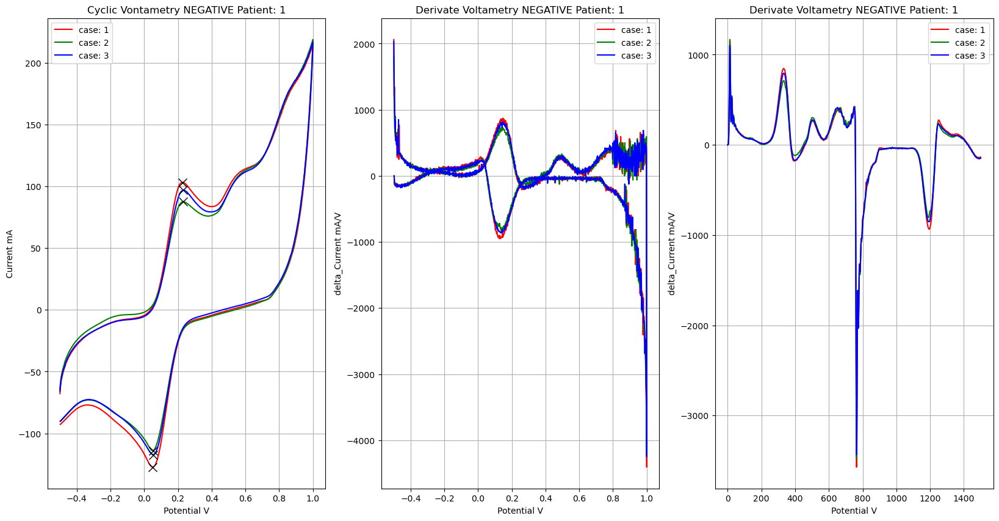

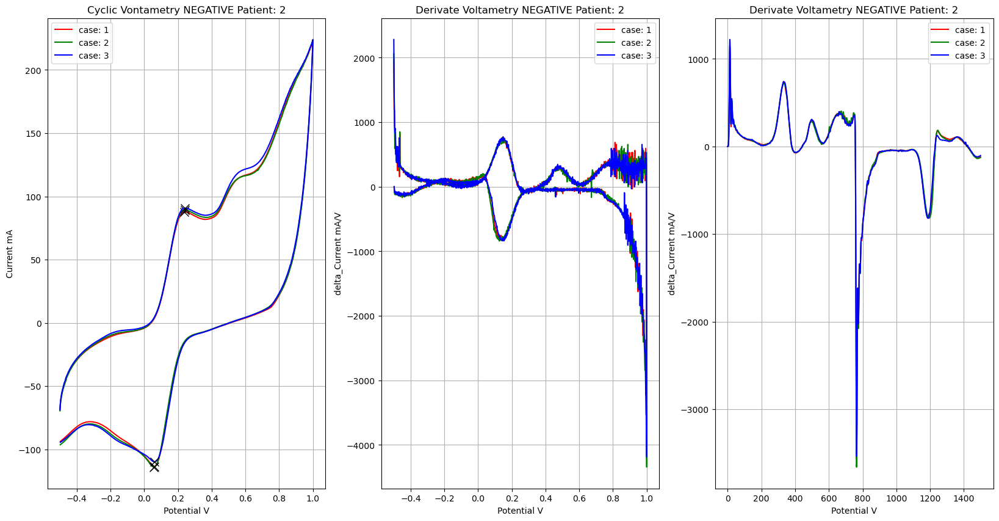

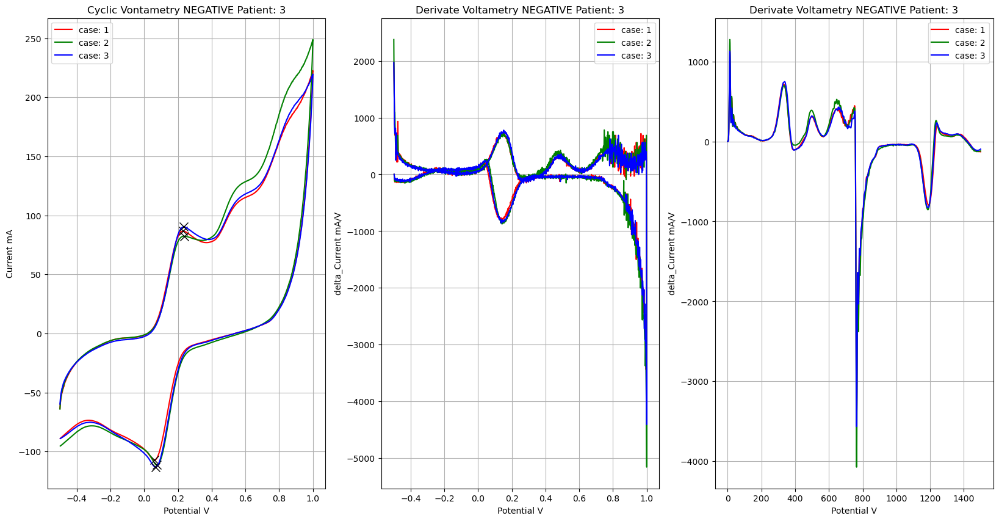

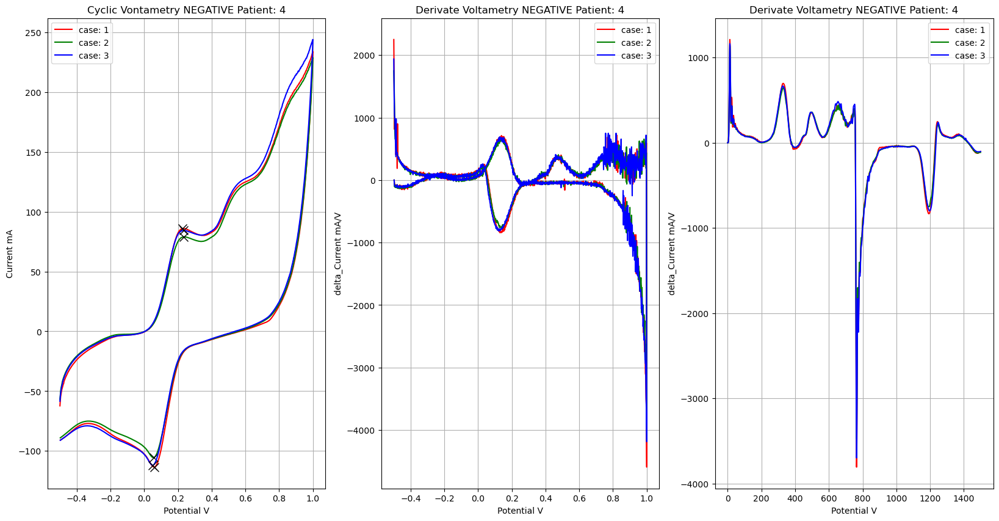

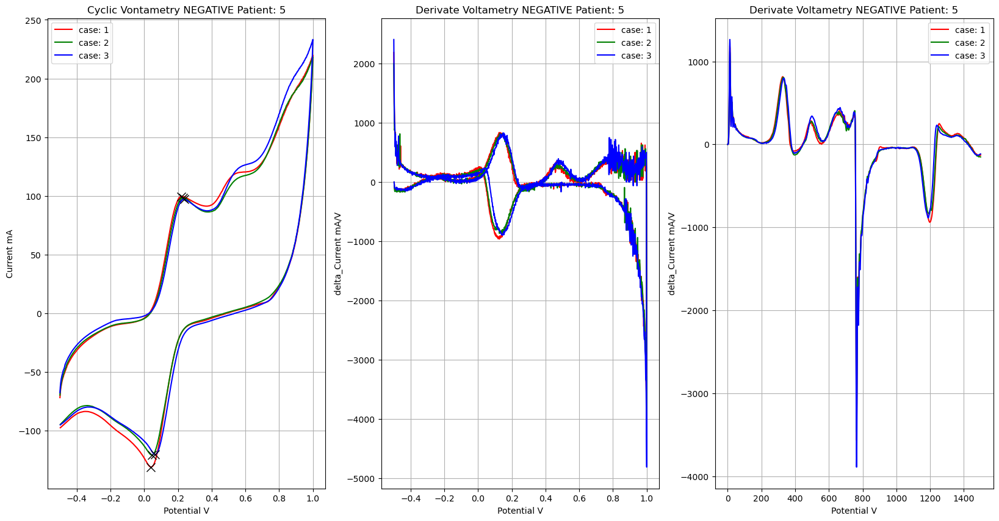

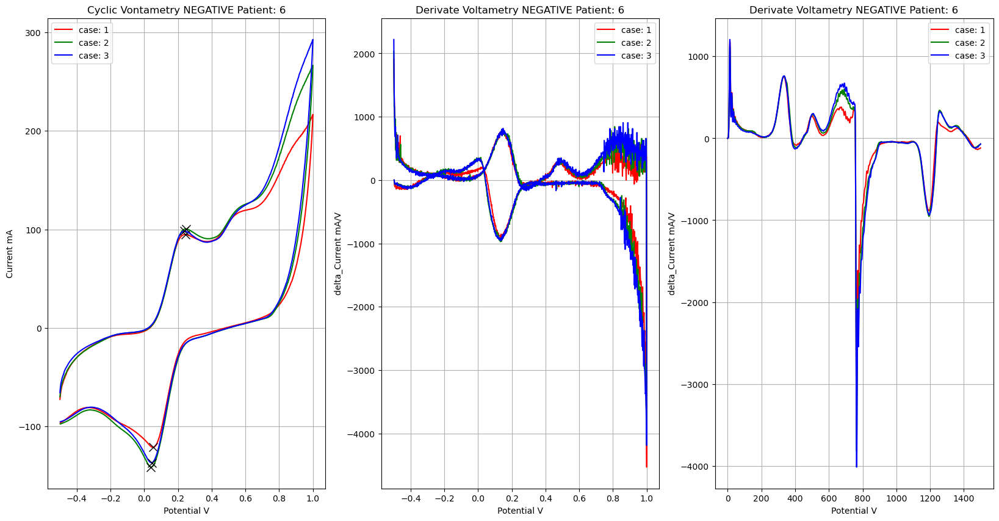

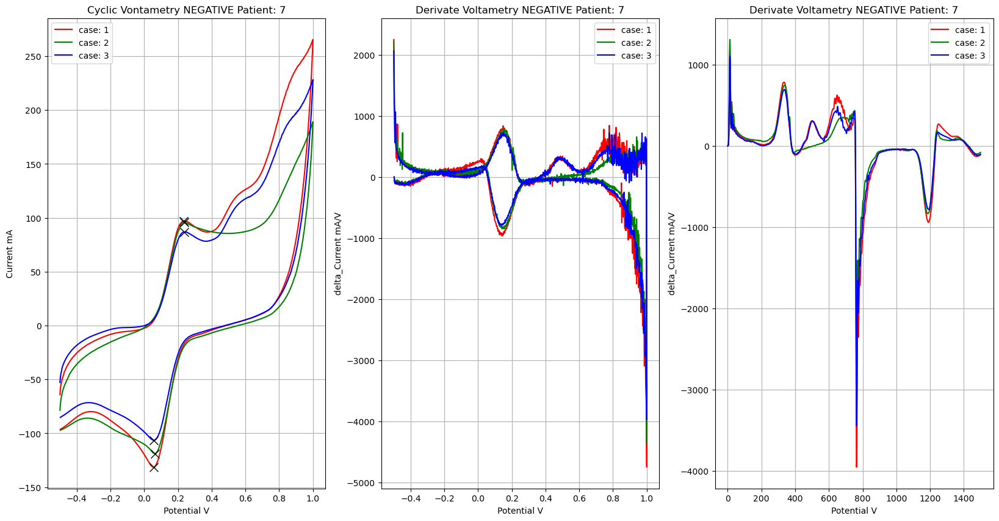

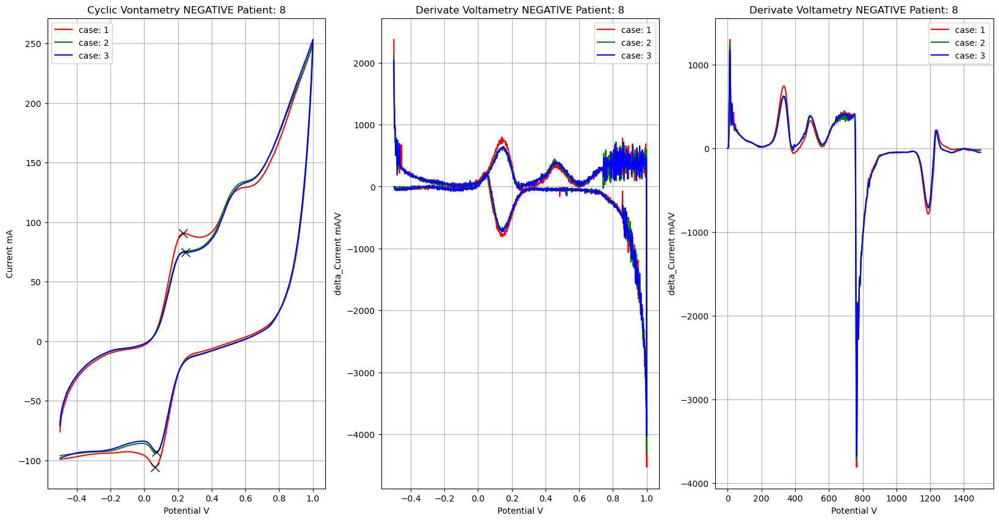

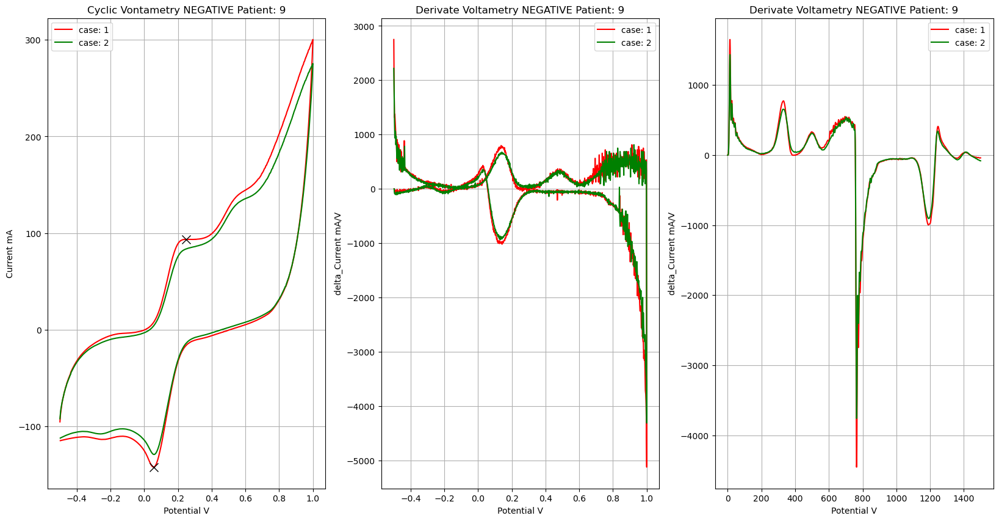

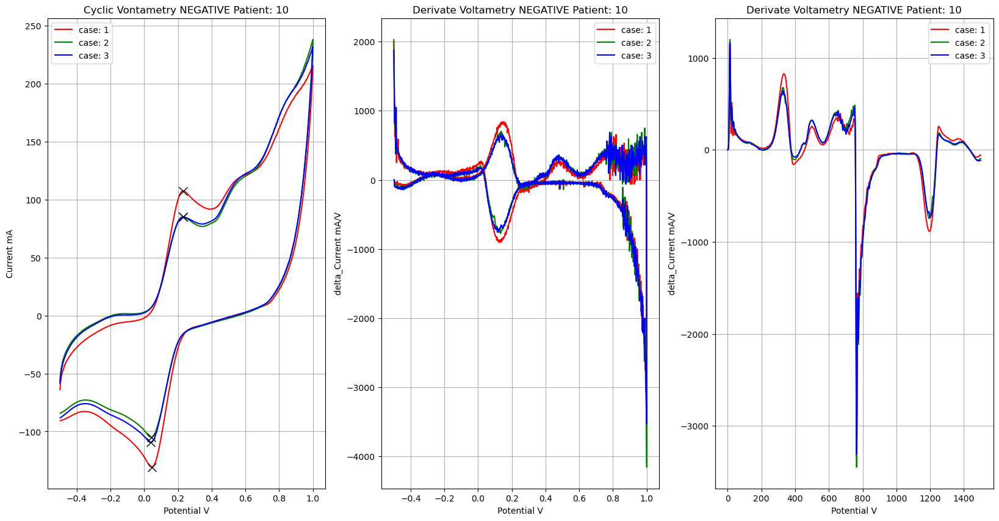

In [48]:
colors = ['r', 'g', 'b']
patient_count = 1
patients = final_neg_df.columns
patient_anterior = ''
plots = 0
neg_derivate_df = pd.DataFrame(columns=patients)
neg_derivate_df[patients[0]] = potential_neg
negative_anodic_current = []
negative_cathodic_current = []
negative_diff_ano_cat_potential = []
negative_diff_ano_cat_current = []
fp = findpeaks(method='peakdetect', lookahead=10)
plot_peak = False

for i in range (1, final_neg_df.shape[1]):
    
    current = final_neg_df.iloc[:, i].values
    current_derivate, derived_current_filtered = derivate(potential_neg, current)
    neg_derivate_df[patients[i]] = derived_current_filtered
    (anodic, cathodic) = getAnodicAndCathodicArguments(current, fp)
    
    
    if (anodic != -1 and cathodic != -1):
        negative_anodic_current.append(current[anodic])
        negative_cathodic_current.append(current[cathodic])
        negative_diff_ano_cat_current.append(abs(current[anodic] - current[cathodic]))
        negative_diff_ano_cat_potential.append(abs(potential_neg[anodic] - potential_neg[cathodic]))
        plot_peak = True
        
    elif (anodic == -1):
         negative_anodic_current.append(np.nan)
         negative_diff_ano_cat_current.append(np.nan)
         negative_diff_ano_cat_potential.append(np.nan)
         negative_cathodic_current.append(current[cathodic])
         
    elif (cathodic == -1):
        negative_anodic_current.append(current[anodic])
        negative_diff_ano_cat_current.append(np.nan)
        negative_diff_ano_cat_potential.append(np.nan)
        negative_cathodic_current.append(np.nan)

    
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))
        patient_anterior = patients[i][9]
        ax1.set_title("Cyclic Vontametry NEGATIVE Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Potential V")
        ax1.grid(True)
        
        ax2.set_title("Derivate Voltametry NEGATIVE Patient: " + str(patient_count))
        ax2.set_ylabel("delta_Current mA/V")
        ax2.set_xlabel("Potential V")
        
        ax2.grid(True)
        
        ax3.set_title("Derivate Voltametry NEGATIVE Patient: " + str(patient_count))
        ax3.set_ylabel("delta_Current mA/V")
        ax3.set_xlabel("Potential V")
        
        ax3.grid(True)
        patient_count += 1
        
          
    ax1.plot(potential_neg, current, color=colors[plots], label="case: " + str(plots + 1))
    if (plot_peak):
        ax1.plot(potential_neg[anodic], current[anodic], marker="x", markersize=10, markeredgecolor="black")
        ax1.plot(potential_neg[cathodic], current[cathodic], marker="x", markersize=10, markeredgecolor="black")
        
    ax1.legend() 
    ax2.plot(potential_neg, current_derivate, color=colors[plots], label="case: " + str(plots + 1))
    ax2.legend()
    #ax3.plot(potential_neg, derived_current_filtered, color=colors[plots], label="case: " + str(plots + 1))
    ax3.plot(derived_current_filtered, color=colors[plots], label="case: " + str(plots + 1))
    ax3.legend() 
    plots += 1
    plot_peak = False
    
plt.show()

In [49]:
neg_derivate_df.head()

,Potencial (V),Paciente J (1),Paciente J (2),Paciente J (3),Paciente K (1),Paciente K (2),Paciente K (3),Paciente L (1),Paciente L (2),Paciente L (3),...,Paciente P (2),Paciente P (3),Paciente Q (1),Paciente Q (2),Paciente Q (3),Paciente R (1),Paciente R (2),Paciente S (1),Paciente S (2),Paciente S (3)
0,-0.499945,0.003454,0.003035,0.003402,0.003297,0.003454,0.003820,0.003297,0.003977,0.003297,...,0.003716,0.003454,0.003977,0.003559,0.003402,0.004605,0.003716,0.003349,0.003402,0.003140
1,-0.497945,0.057269,0.050941,0.056434,0.054707,0.057530,0.063599,0.055335,0.066003,0.055386,...,0.062291,0.057216,0.065743,0.059309,0.056694,0.076673,0.062395,0.056172,0.056956,0.052458
2,-0.495945,0.463500,0.417251,0.456392,0.442928,0.467317,0.515873,0.452447,0.533882,0.453219,...,0.509103,0.462191,0.530023,0.482141,0.460512,0.622225,0.510882,0.459461,0.464488,0.427367
3,-0.493945,2.448853,2.229863,2.405918,2.340175,2.474990,2.726152,2.409691,2.814979,2.415021,...,2.712358,2.434295,2.787375,2.556597,2.437968,3.291652,2.726867,2.450321,2.467256,2.270258
4,-0.491945,9.531302,8.771527,9.329345,9.105910,9.642093,10.590960,9.432445,10.919381,9.454327,...,10.628730,9.431897,10.791963,9.978841,9.493736,12.811462,10.705410,9.611432,9.633487,8.874206


# Plotagem dos dados - Positivos em função do potencial

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
[findpeaks] >Finding peaks in 1d-vector using [p

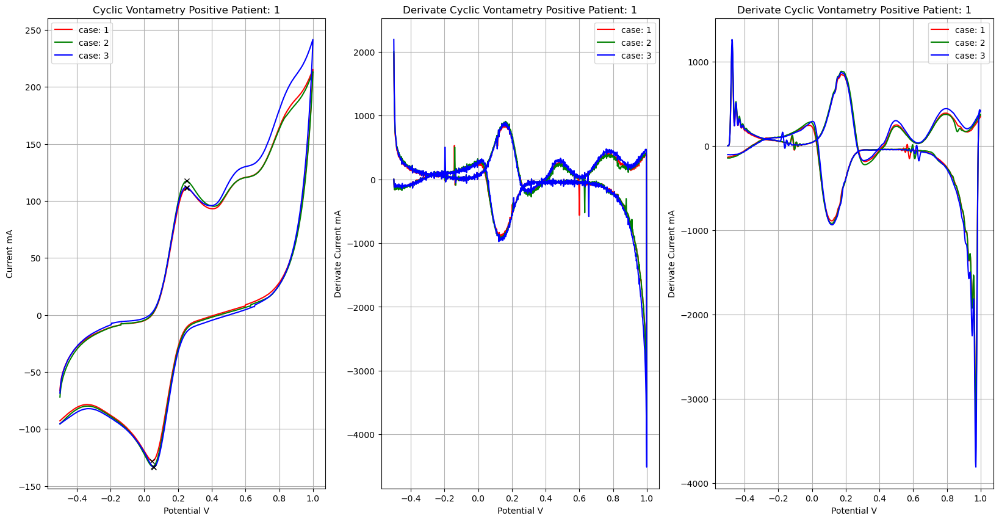

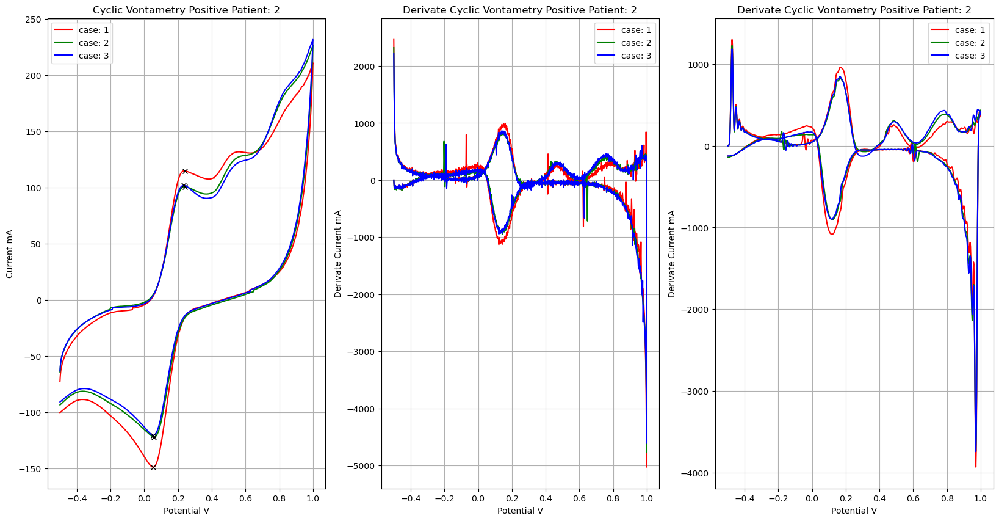

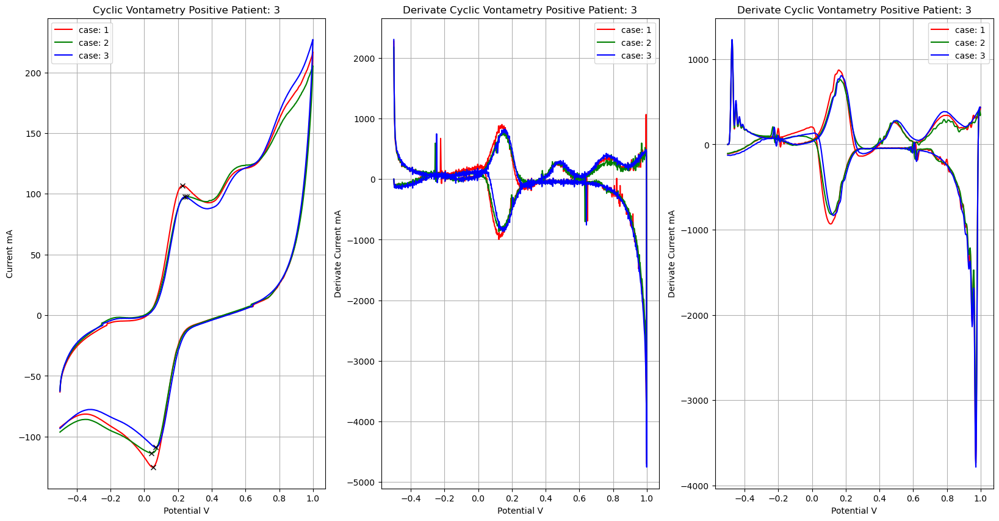

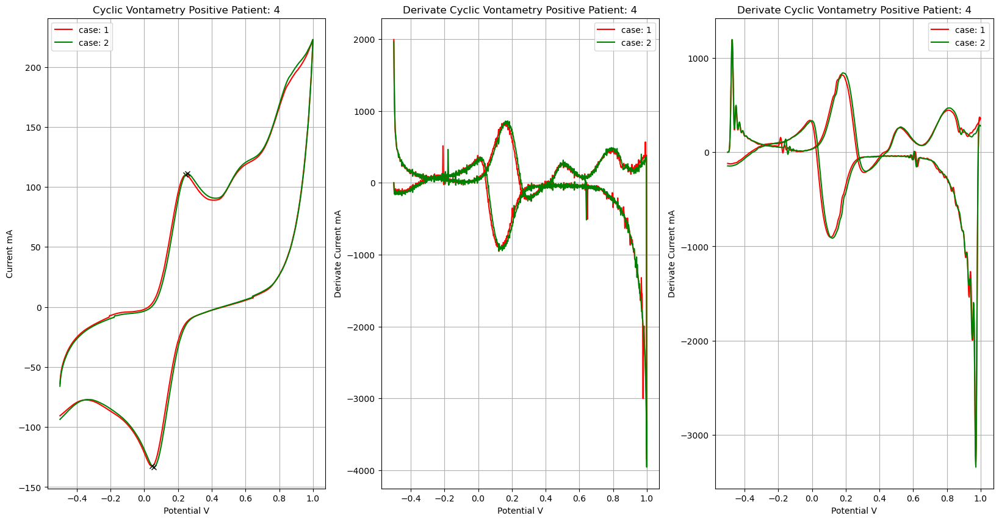

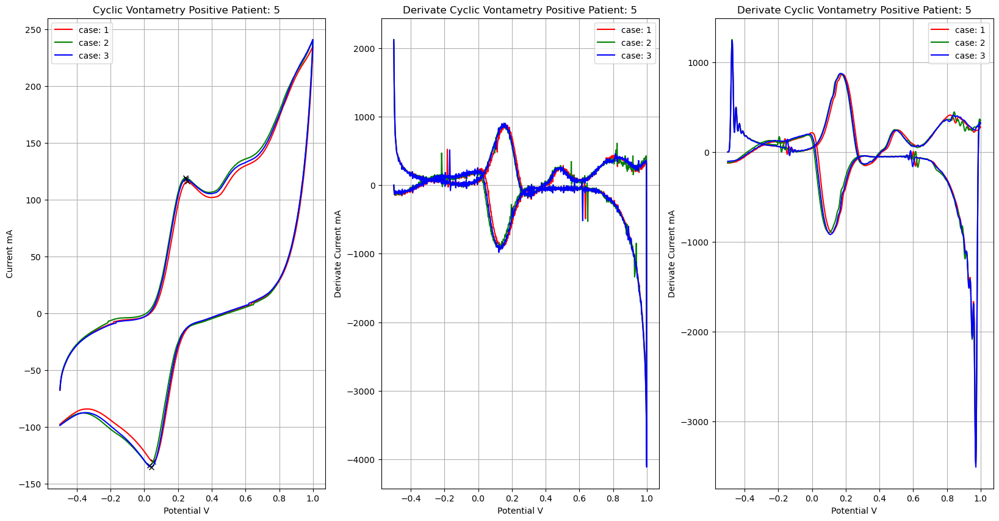

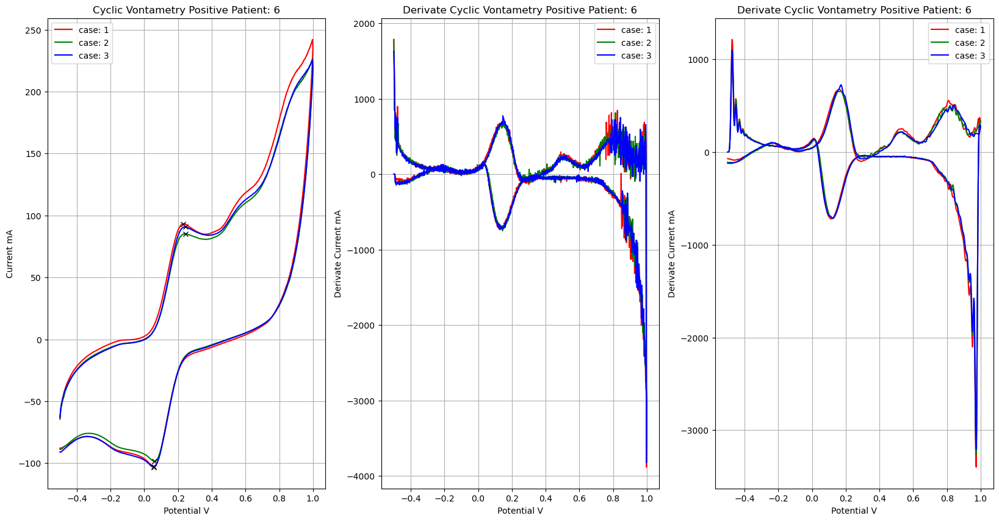

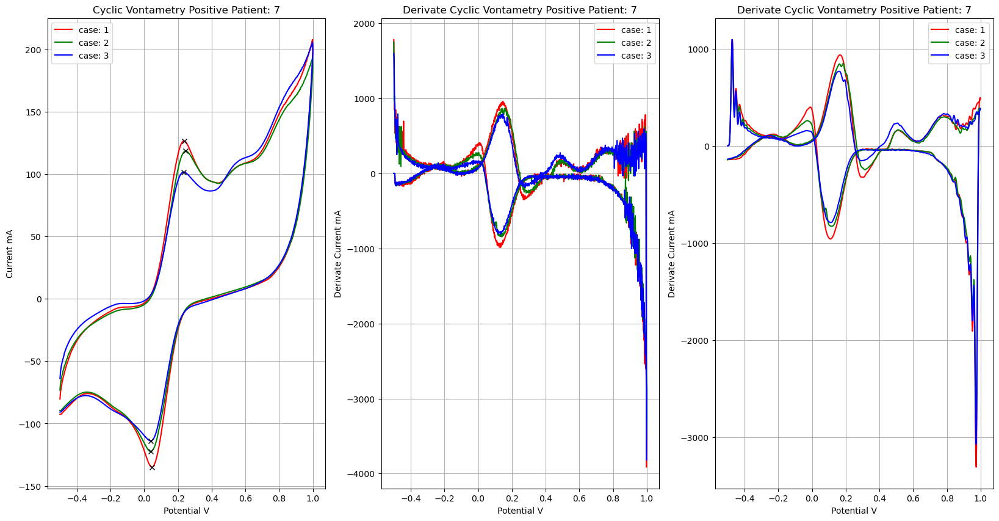

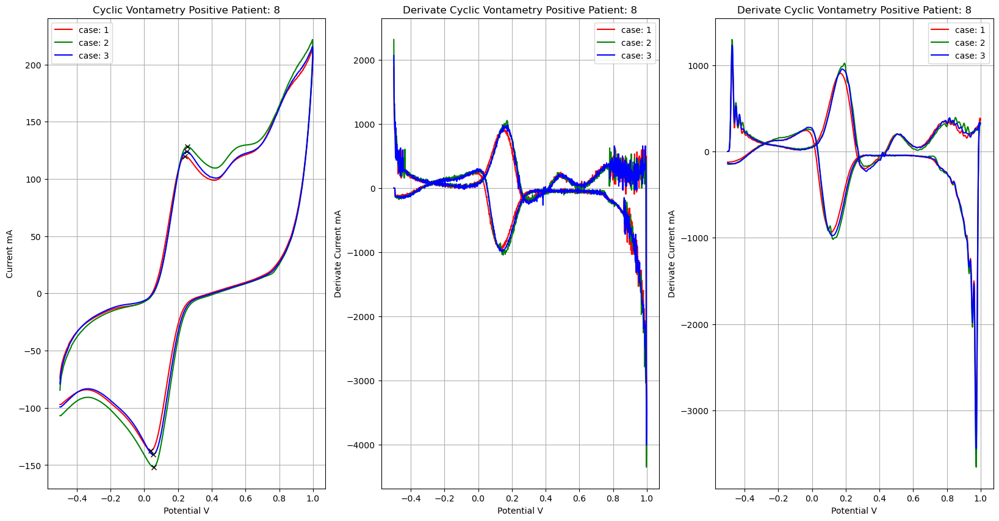

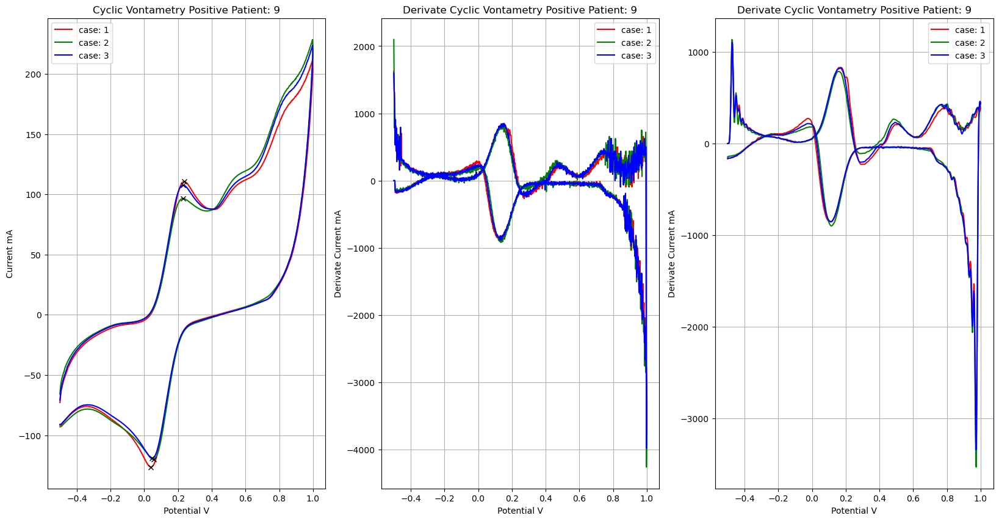

In [50]:
patient_count = 1
patients = final_pos_df.columns
patient_anterior = ''
plots = 0
pos_derivate_df = pd.DataFrame(columns=patients)
pos_derivate_df[patients[0]] = potential_pos
positive_anodic_current = []
positive_cathodic_current = []
positive_diff_ano_cat_potential = []
positive_diff_ano_cat_current = []

for i in range (1, final_pos_df.shape[1]):
    
    current = final_pos_df.iloc[:, i].values
    current_derivate, derived_current_filtered = derivate(potential_pos, current)             # Derivada em função do potencial
    pos_derivate_df[patients[i]] = derived_current_filtered
    (anodic, cathodic) = getAnodicAndCathodicArguments(current, fp)
    
    
    if (anodic != -1 and cathodic != -1):
        positive_anodic_current.append(current[anodic])
        positive_cathodic_current.append(current[cathodic])
        positive_diff_ano_cat_current.append(abs(current[anodic] - current[cathodic]))
        positive_diff_ano_cat_potential.append(abs(potential_pos[anodic] - potential_pos[cathodic]))
        plot_peak = True
        
    elif (anodic == -1):
         positive_anodic_current.append(np.nan)
         positive_diff_ano_cat_current.append(np.nan)
         positive_diff_ano_cat_potential.append(np.nan)
         positive_cathodic_current.append(current[cathodic])
         
    elif (cathodic == -1):
        positive_anodic_current.append(current[anodic])
        positive_diff_ano_cat_current.append(np.nan)
        positive_diff_ano_cat_potential.append(np.nan)
        positive_cathodic_current.append(np.nan)
    
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20,10))
        patient_anterior = patients[i][9]
        
        ax1.set_title("Cyclic Vontametry Positive Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Potential V")
        ax1.grid(True)
        
        ax2.set_title("Derivate Cyclic Vontametry Positive Patient: " + str(patient_count))
        ax2.set_ylabel("Derivate Current mA")
        ax2.set_xlabel("Potential V") 
        ax2.grid(True)
        
        ax3.set_title("Derivate Cyclic Vontametry Positive Patient: " + str(patient_count))
        ax3.set_ylabel("Derivate Current mA")
        ax3.set_xlabel("Potential V") 
        ax3.grid(True)
        
        patient_count += 1
        
          
    ax1.plot(potential_pos, current, color=colors[plots], label="case: " + str(plots + 1))
    if plot_peak:
        ax1.plot(potential_pos[anodic], current[anodic], color='black', marker='x')
        ax1.plot(potential_pos[cathodic], current[cathodic], color='black', marker='x')
        
    ax2.plot(potential_pos, current_derivate, color=colors[plots], label="case: " + str(plots + 1))
    ax3.plot(potential_pos, derived_current_filtered, color=colors[plots], label="case: " + str(plots + 1))
    ax1.legend()
    ax2.legend()
    ax3.legend()
    plots += 1
    plot_peak = False
    
plt.show()

In [51]:
pos_derivate_df.shape

(1503, 27)

In [38]:
# Salvando os datasets
pos_derivate_df.to_csv("../data/derivate_positive.csv")
neg_derivate_df.to_csv("../data/derivate_negative.csv")

# Plotagem dos dados positivos e negativos em função to tempo

### Dados Negativos

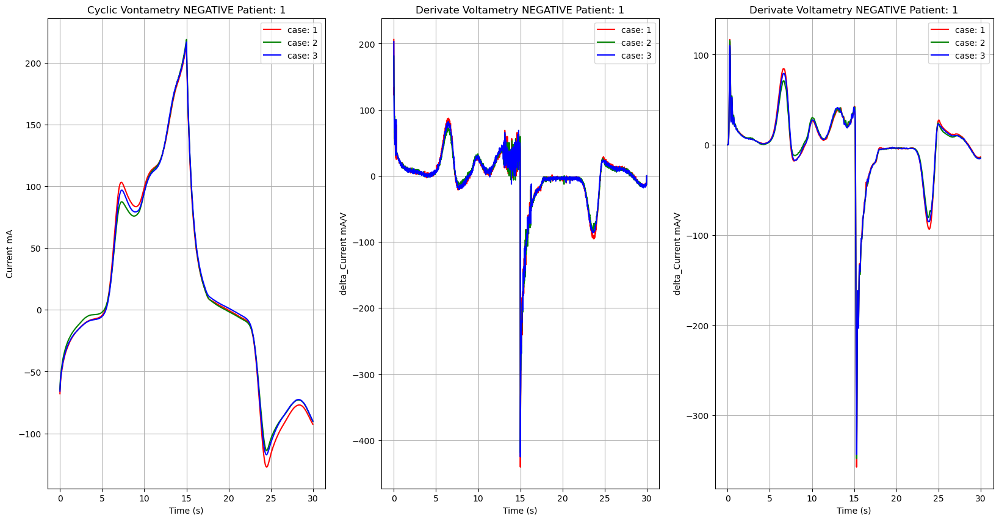

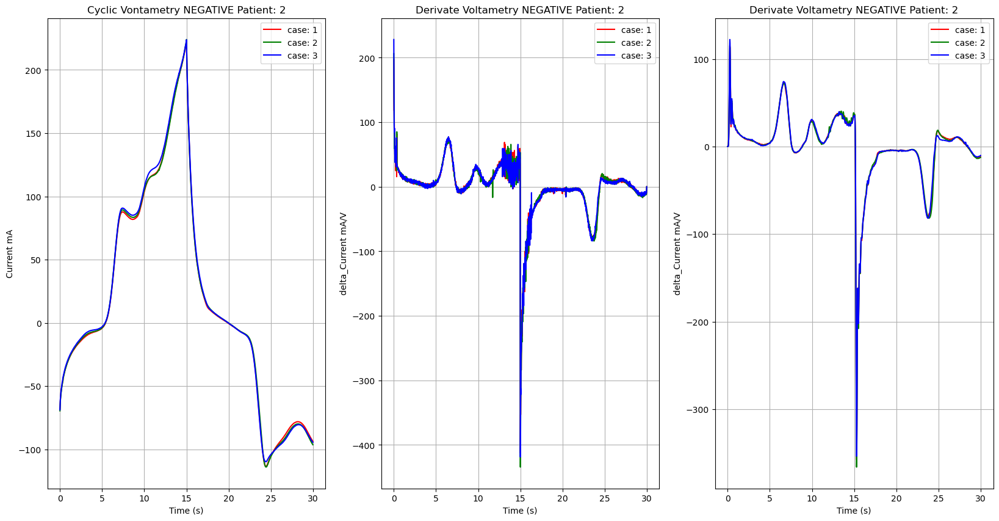

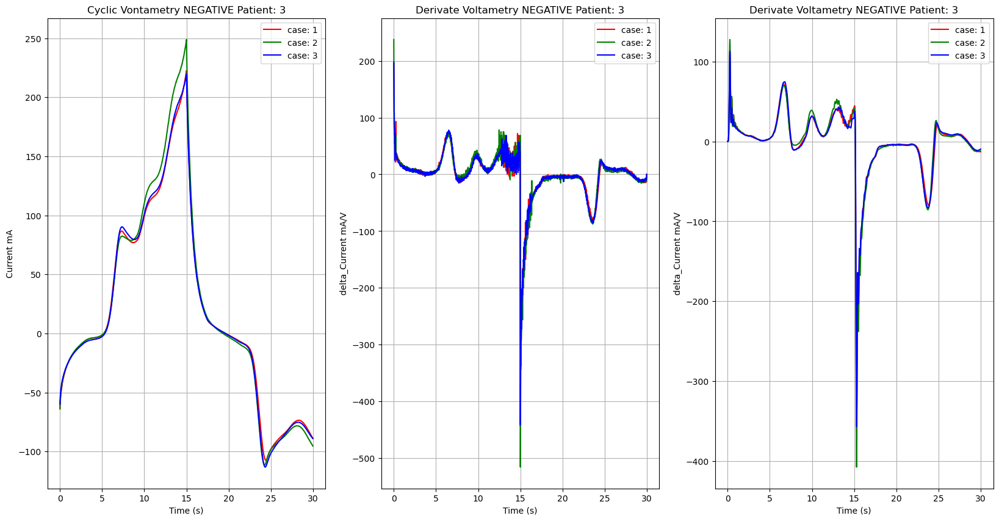

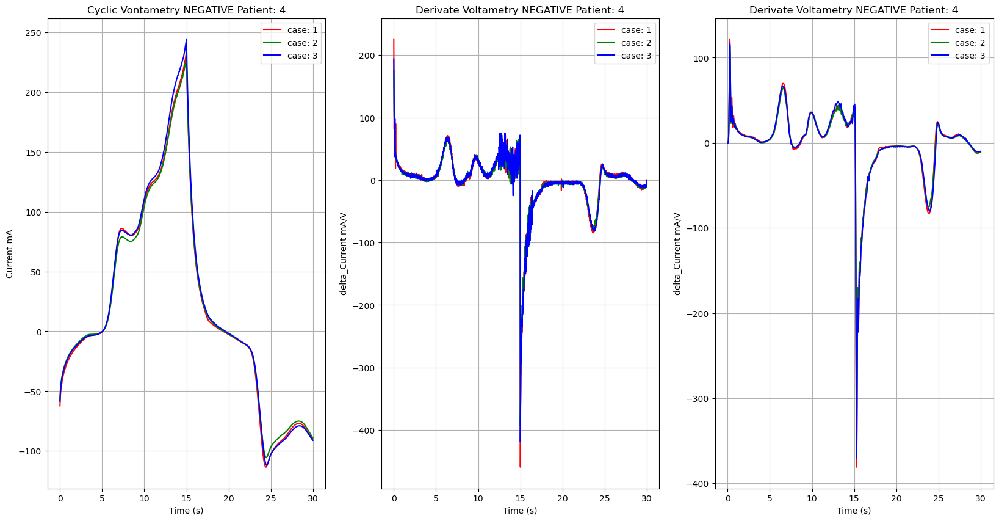

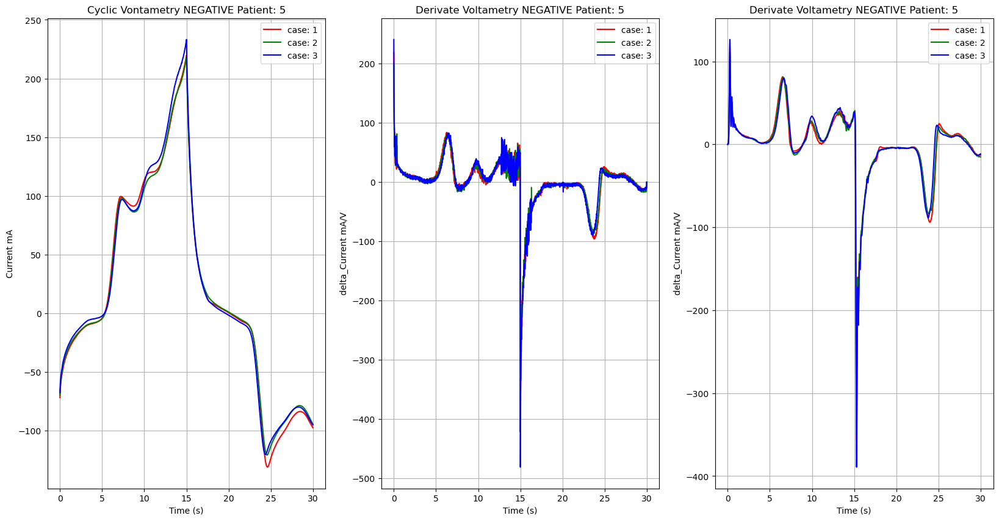

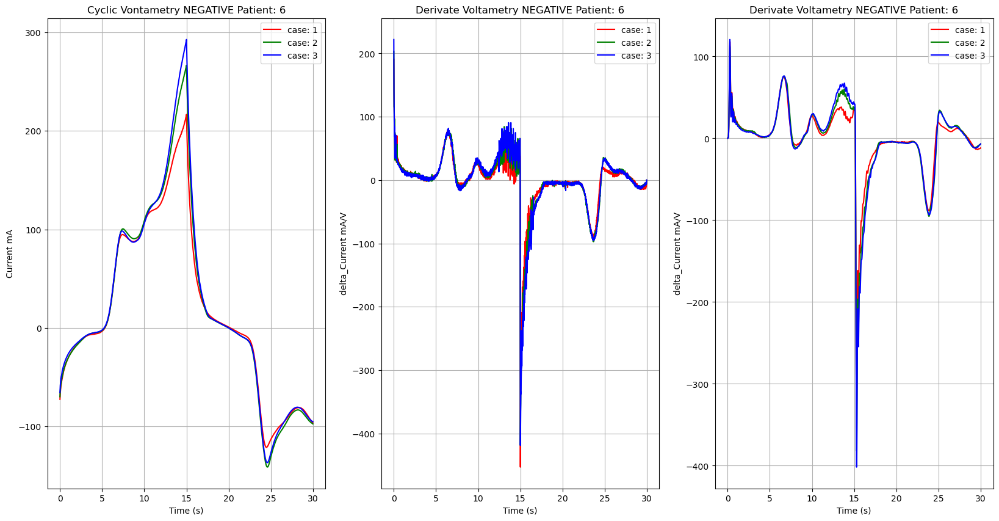

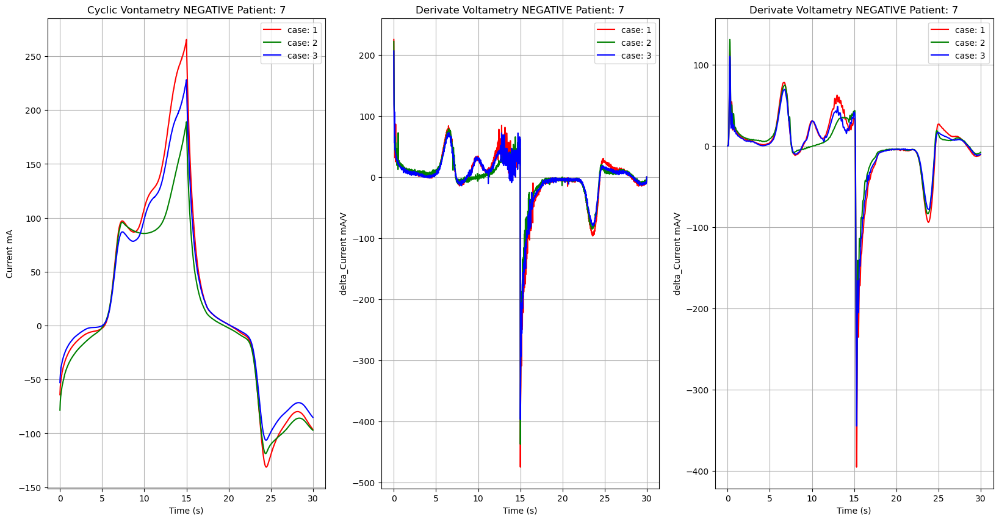

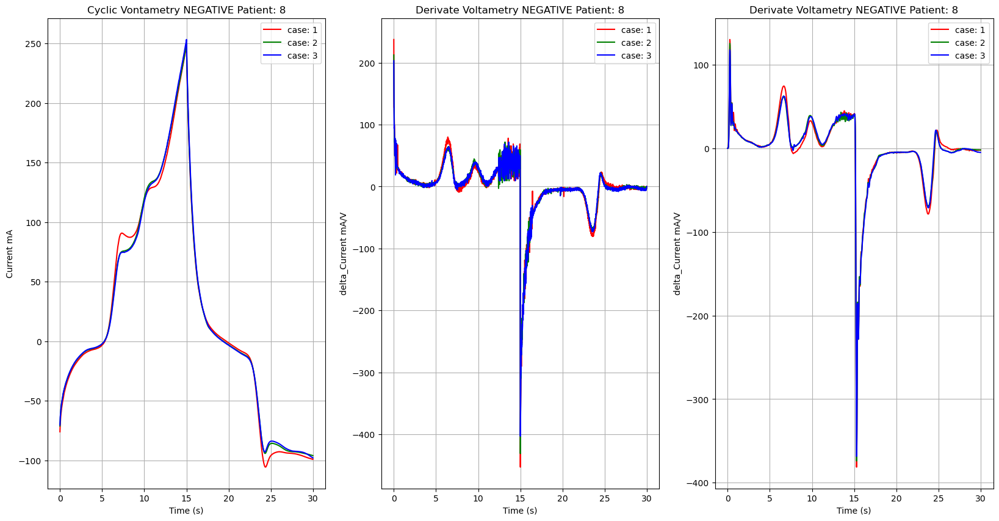

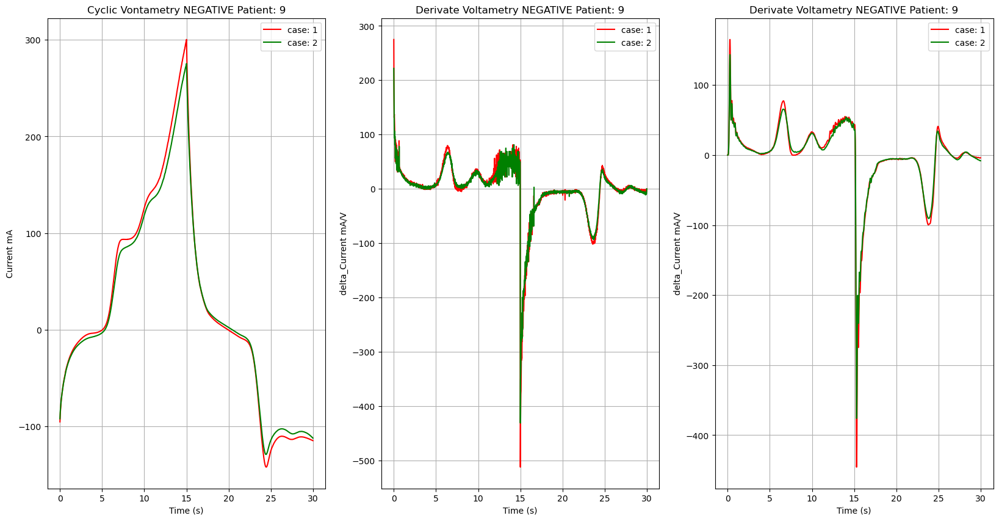

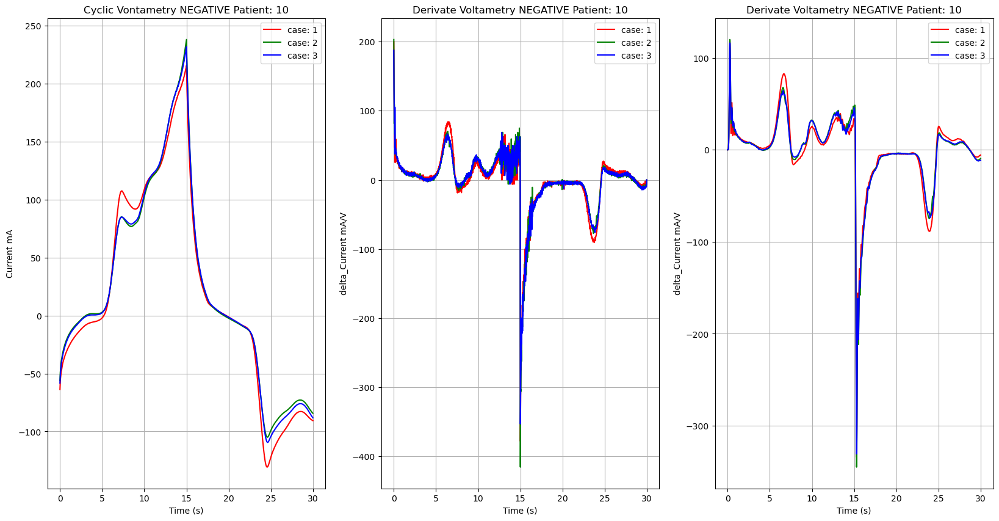

In [52]:
patient_count = 1
patients = final_neg_df.columns
patient_anterior = ''
plots = 0
time = getTime(0.1, potential_neg)
charge_neg = []
negative_derivate_list = []

for i in range (1, final_neg_df.shape[1]):
    
    current = final_neg_df.iloc[:, i].values
    current_derivate, derived_current_filtered = derivate(time, current, True)
    charge_neg.append(getTotalCharge(current, time))
    negative_derivate_list.append(derived_current_filtered)
    
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))
        patient_anterior = patients[i][9]
        ax1.set_title("Cyclic Vontametry NEGATIVE Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Time (s)")
        ax1.grid(True)
        
        ax2.set_title("Derivate Voltametry NEGATIVE Patient: " + str(patient_count))
        ax2.set_ylabel("delta_Current mA/V")
        ax2.set_xlabel("Time (s)")
        
        ax2.grid(True)
        
        ax3.set_title("Derivate Voltametry NEGATIVE Patient: " + str(patient_count))
        ax3.set_ylabel("delta_Current mA/V")
        ax3.set_xlabel("Time (s)")
        
        ax3.grid(True)
        patient_count += 1
        
          
    ax1.plot(time, current, color=colors[plots], label="case: " + str(plots + 1))
    ax1.legend() 
    ax2.plot(time, current_derivate, color=colors[plots], label="case: " + str(plots + 1))
    ax2.legend()
    ax3.plot(time, derived_current_filtered, color=colors[plots], label="case: " + str(plots + 1))
    ax3.legend() 
    plots += 1
    
plt.show()

### Dados Positivos

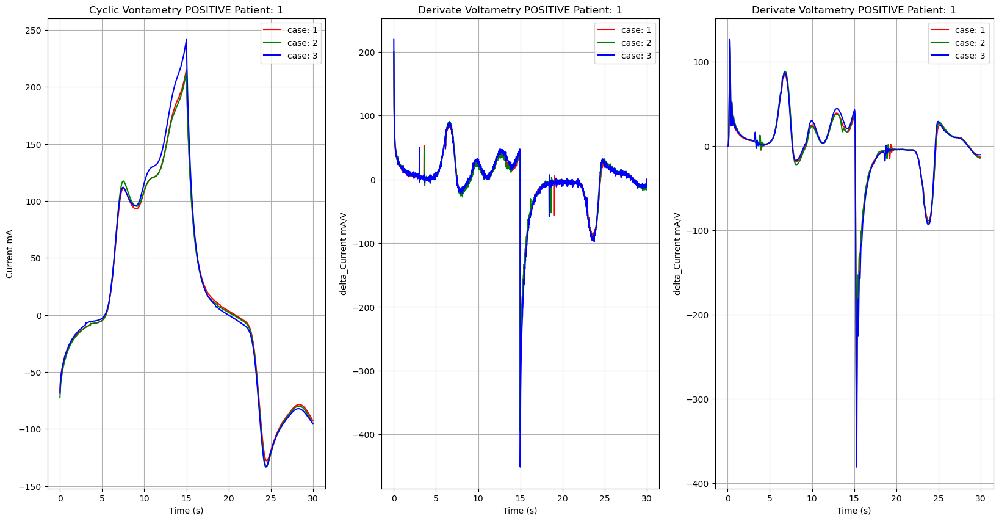

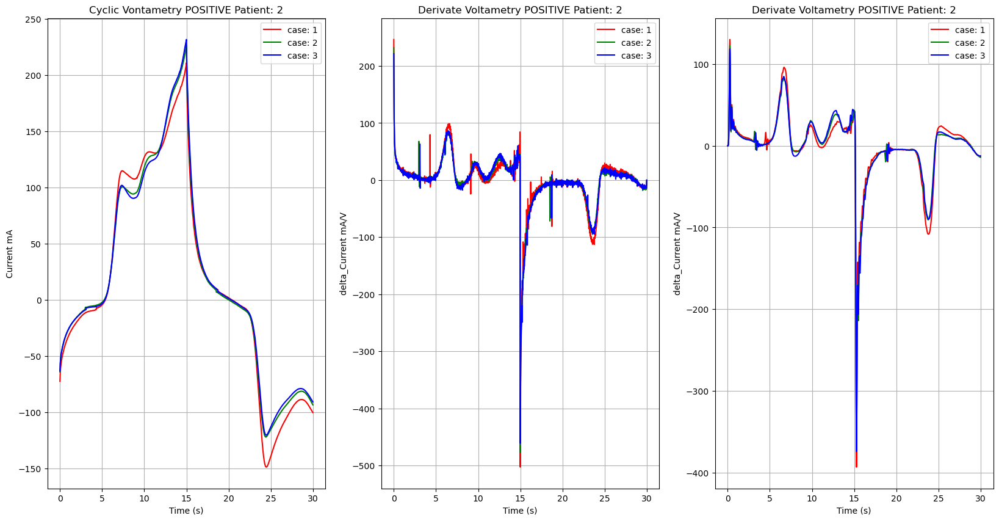

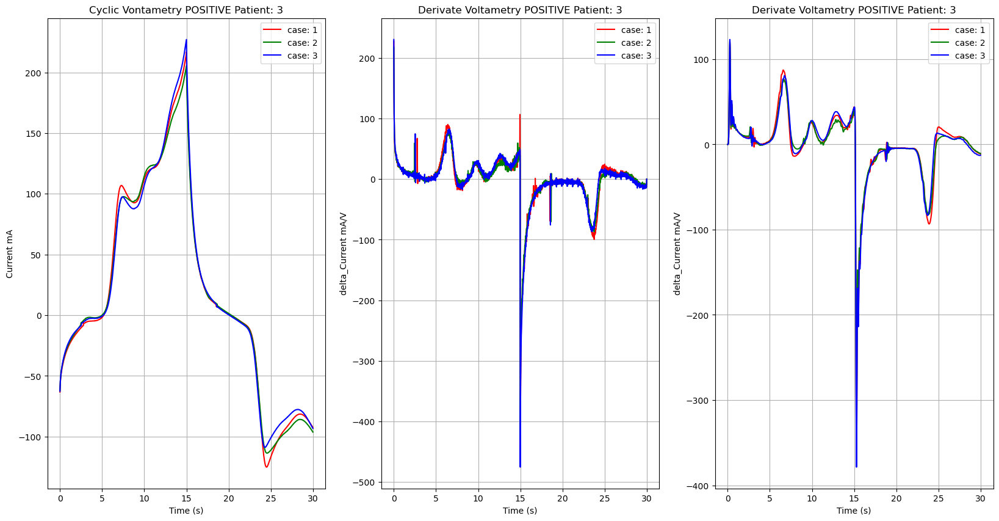

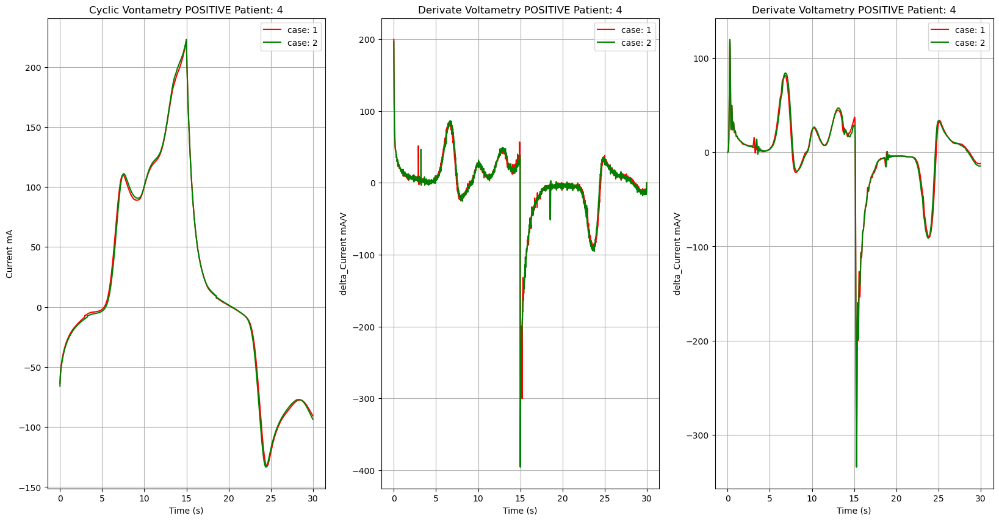

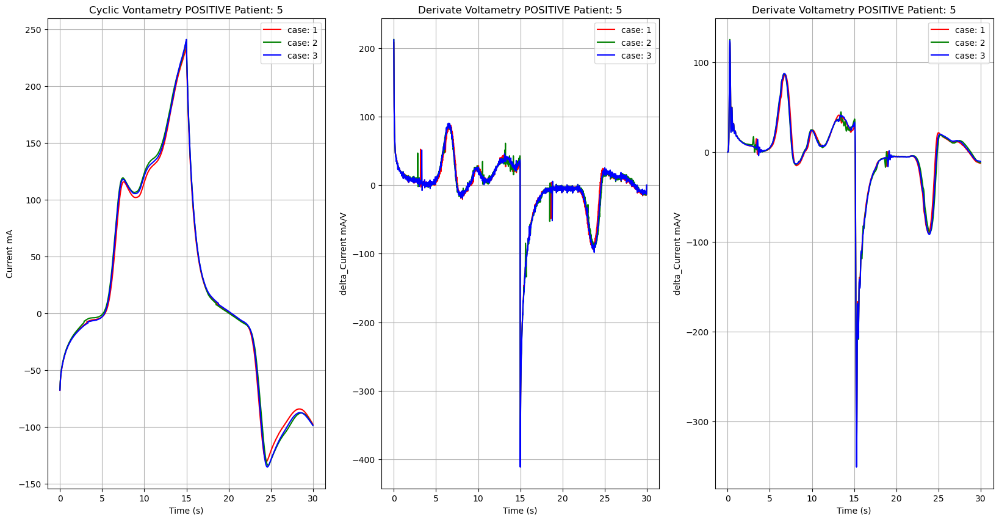

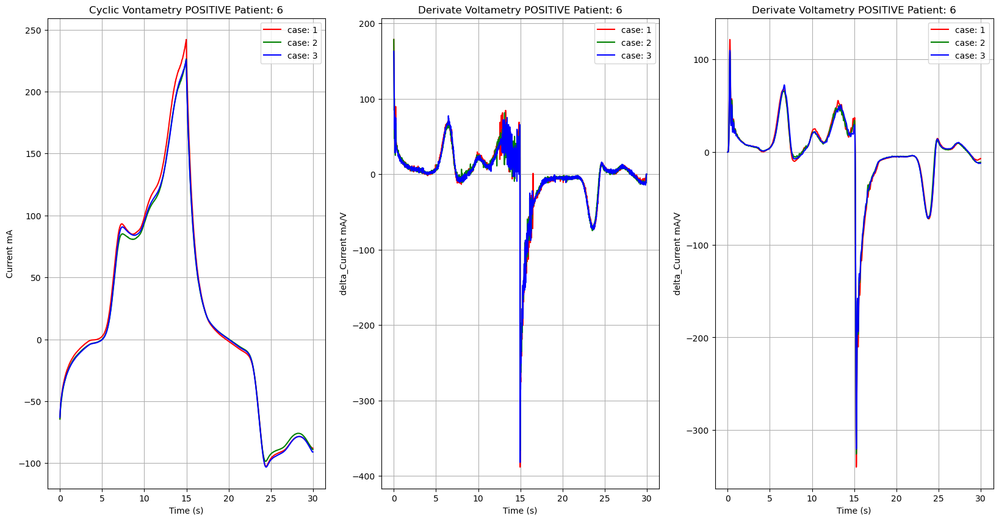

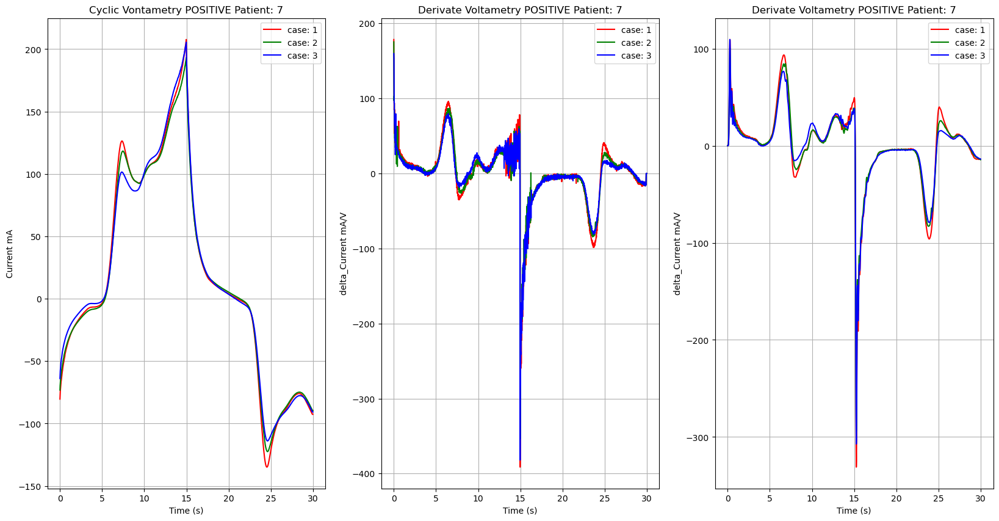

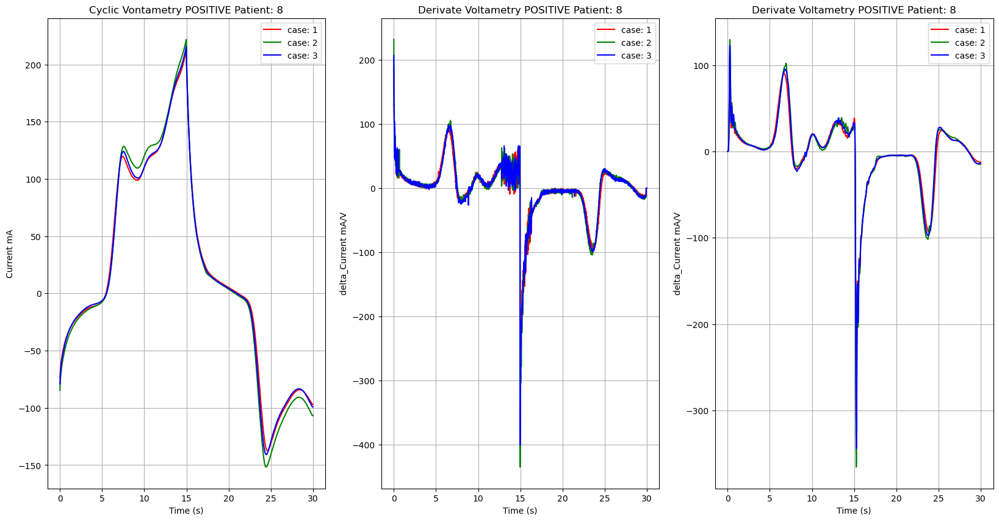

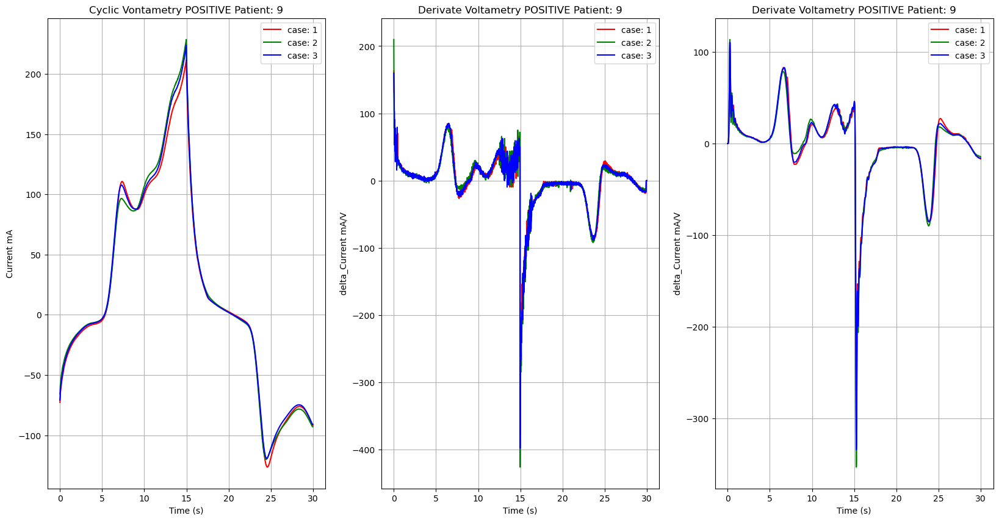

In [53]:
patient_count = 1
patients = final_pos_df.columns
patient_anterior = ''
plots = 0
time = getTime(0.1, potential_pos)
charge_pos = []
positive_derived_list = []

for i in range (1, final_pos_df.shape[1]):
    
    current = final_pos_df.iloc[:, i].values
    current_derivate, derived_current_filtered = derivate(time, current, True)
    charge_pos.append(getTotalCharge(current, time))
    positive_derived_list.append(derived_current_filtered)
    
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))
        patient_anterior = patients[i][9]
        ax1.set_title("Cyclic Vontametry POSITIVE Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Time (s)")
        ax1.grid(True)
        
        ax2.set_title("Derivate Voltametry POSITIVE Patient: " + str(patient_count))
        ax2.set_ylabel("delta_Current mA/V")
        ax2.set_xlabel("Time (s)")
        
        ax2.grid(True)
        
        ax3.set_title("Derivate Voltametry POSITIVE Patient: " + str(patient_count))
        ax3.set_ylabel("delta_Current mA/V")
        ax3.set_xlabel("Time (s)")
        
        ax3.grid(True)
        patient_count += 1
        
          
    ax1.plot(time, current, color=colors[plots], label="case: " + str(plots + 1))
    ax1.legend() 
    ax2.plot(time, current_derivate, color=colors[plots], label="case: " + str(plots + 1))
    ax2.legend()
    ax3.plot(time, derived_current_filtered, color=colors[plots], label="case: " + str(plots + 1))
    ax3.legend() 
    plots += 1
    
plt.show()

# Analizando os dados da carga em função do tempo

Positive Statistics

Mean: 589.3919489744895
Median: 587.3011103895236
Std: 52.206898233283226
Maximum: 693.5257355715016
Minumum: 497.0626830639278


Negative Statistcs

Mean: 590.5091721989313
Median: 610.7782619870707
Std: 89.38681362945856
Maximum: 710.5441421137336
Minumum: 251.204813039932


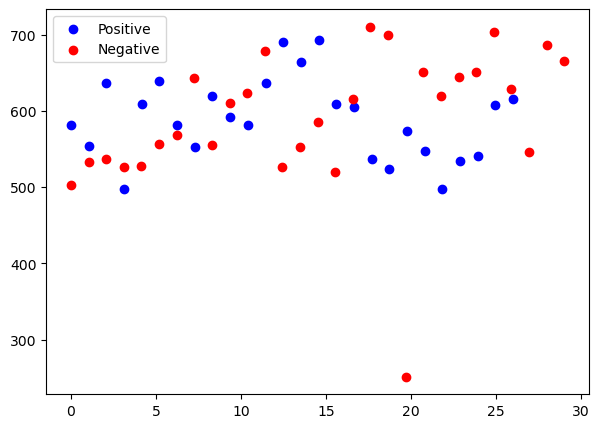

MannwhitneyuResult(statistic=412.0, pvalue=0.5608310597859644)

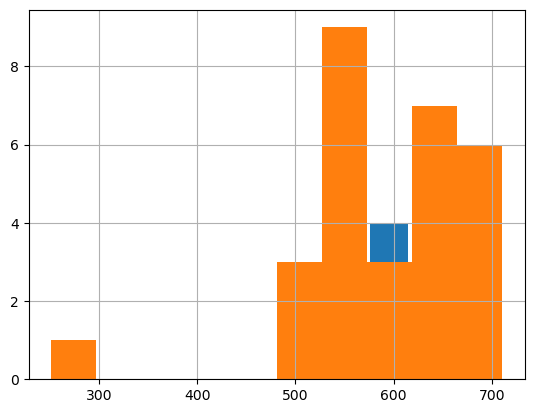

In [54]:
charge_pos = np.array(charge_pos)
charge_neg = np.array(charge_neg)
print("Positive Statistics\n")
showStatistics(charge_pos)
print("\n\nNegative Statistcs\n")
showStatistics(charge_neg)
plot_classes(charge_pos, charge_neg)
# Observando se a distribuição dos dados é normal - Dados positivos
myPositiveCharges = pd.Series(charge_pos)
myPositiveCharges.hist()
# Observando se a distribuição dos dados é normal - Dados Negativos
myNegativeCharges = pd.Series(charge_neg).hist()
stats.mannwhitneyu(charge_neg, charge_pos, alternative='two-sided')

Claramente é possível avistar que as duas distribuições não são normais a partir da visualização do histograma dos dados,
portanto o teste para verificar a diferença entre os conjuntos é o teste de Mann Whitney

O teste de Mann Whitney não mostrou evidência que os grupos são diferentes

# Analisando os dados de corrente e diferença de potencial para as classes negativas e positivas

### Corrente catódica

Positive Statistics

Mean: -125.7777687526923
Median: -127.24724875
Std: 13.220117572961378
Maximum: -98.50463867
Minumum: -151.7554522


Negative Statistcs

Mean: -117.12302298381408
Median: -113.873624801636
Std: 12.418796577531692
Maximum: -92.8857922554016
Minumum: -142.099046707153


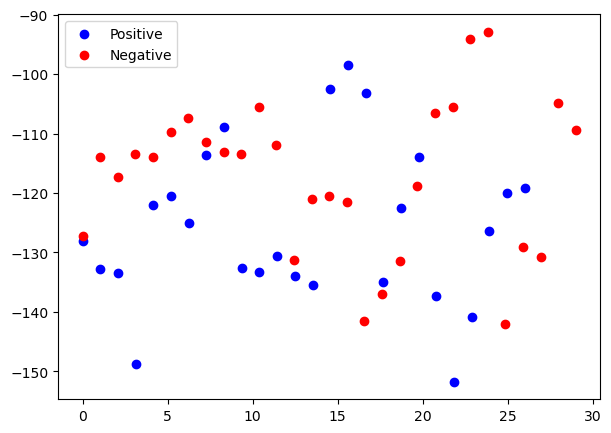

MannwhitneyuResult(statistic=235.0, pvalue=0.017056994887870842)

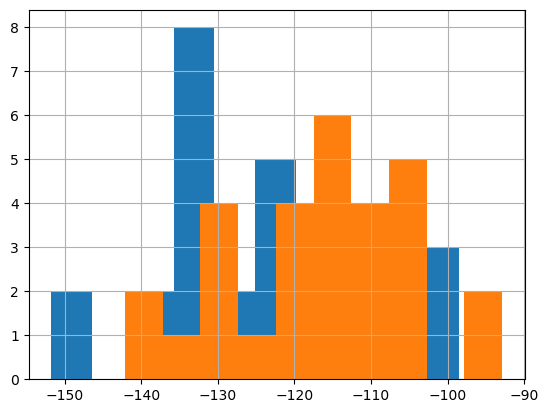

In [55]:
# Corrente Catódica
print("Positive Statistics\n")
showStatistics(np.array(positive_cathodic_current))
print("\n\nNegative Statistcs\n")
showStatistics(np.array(negative_cathodic_current))
plot_classes(positive_cathodic_current, negative_cathodic_current)
pd.Series(positive_cathodic_current).hist()
pd.Series(negative_cathodic_current).hist()
stats.mannwhitneyu(positive_cathodic_current, negative_cathodic_current, alternative='two-sided')

### Corrente Anódica

Positive Statistics

Mean: 109.11238357923078
Median: 110.8683
Std: 11.135847917786412
Maximum: 128.5050869
Minumum: 85.11066437


Negative Statistcs

Mean: nan
Median: nan
Std: nan
Maximum: nan
Minumum: nan


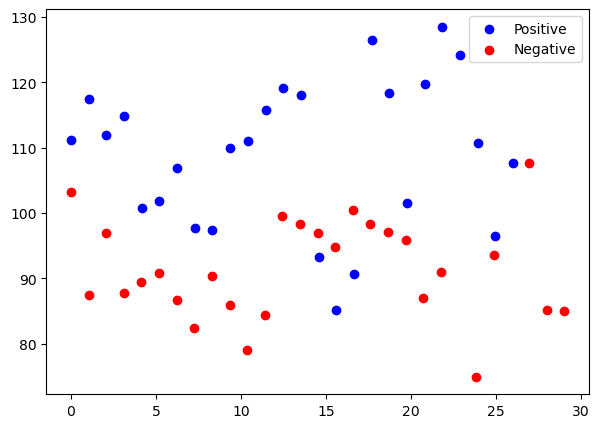

<AxesSubplot:>

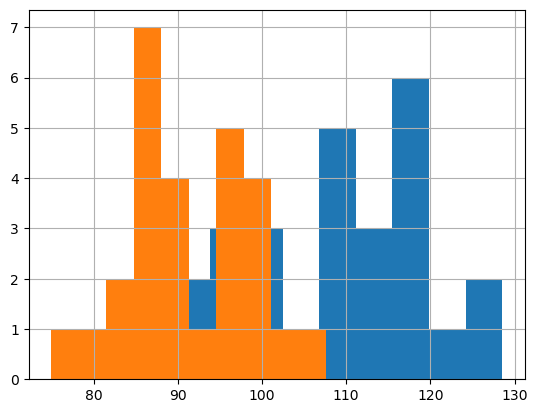

In [56]:
# Corrente anódica
print("Positive Statistics\n")
showStatistics(np.array(positive_anodic_current))
print("\n\nNegative Statistcs\n")
showStatistics(np.array(negative_anodic_current))
plot_classes(positive_anodic_current, negative_anodic_current)
pd.Series(positive_anodic_current).hist()
pd.Series(negative_anodic_current).hist()
#stats.mannwhitneyu(np.array(positive_anodic_current), negative_anodic_current, alternative='two-sided')

### Diferença entre a corrente anódica e catódica

Positive Statistics

Mean: 234.8901523319231
Median: 240.04958865
Std: 23.730420888629784
Maximum: 280.2605391
Minumum: 183.61530304000001


Negative Statistcs

Mean: nan
Median: nan
Std: nan
Maximum: nan
Minumum: nan


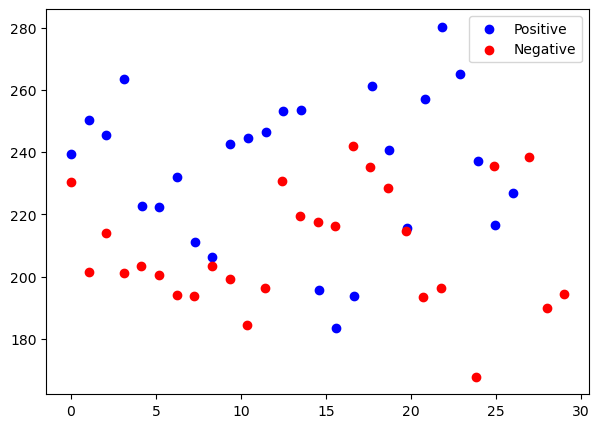

<AxesSubplot:>

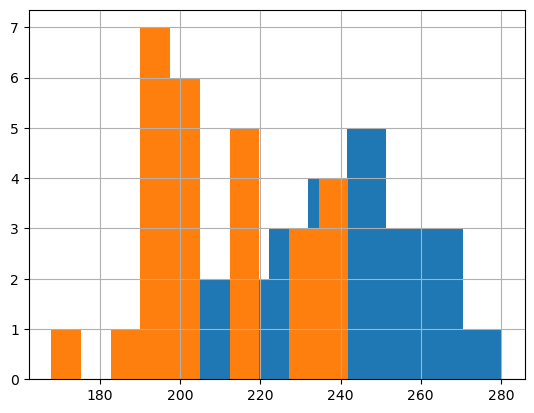

In [57]:
# Diferença entre corrente anódica e catódica
print("Positive Statistics\n")
showStatistics(np.array(positive_diff_ano_cat_current))
print("\n\nNegative Statistcs\n")
showStatistics(np.array(negative_diff_ano_cat_current))
plot_classes(positive_diff_ano_cat_current, negative_diff_ano_cat_current)
pd.Series(positive_diff_ano_cat_current).hist()
pd.Series(negative_diff_ano_cat_current).hist()
#stats.mannwhitneyu(positive_diff_ano_cat_current, negative_diff_ano_cat_current, alternative='two-sided')

### Diferença de potencial anódico e catódico

Positive Statistics

Mean: 0.19334854788461536
Median: 0.19665053449999997
Std: 0.011637150072892791
Maximum: 0.213620105
Minumum: 0.173690915


Negative Statistcs

Mean: nan
Median: nan
Std: nan
Maximum: nan
Minumum: nan


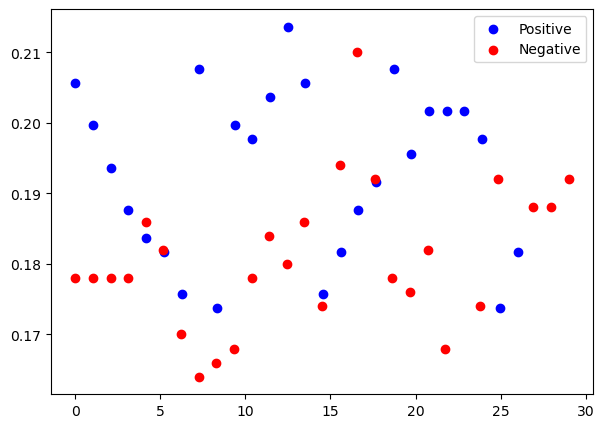

<AxesSubplot:>

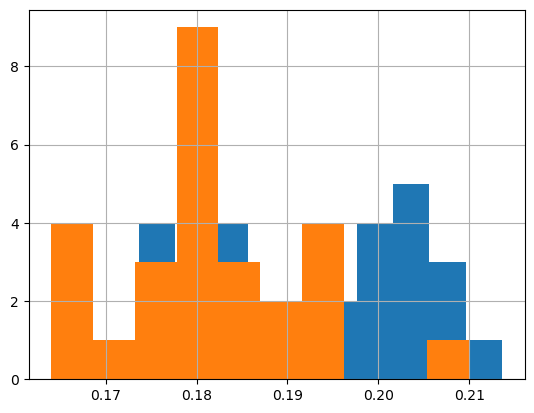

In [58]:
# Diferença entre potencial corrente anódica e catódica
print("Positive Statistics\n")
showStatistics(np.array(positive_diff_ano_cat_potential))
print("\n\nNegative Statistcs\n")
showStatistics(np.array(negative_diff_ano_cat_potential))
plot_classes(positive_diff_ano_cat_potential, negative_diff_ano_cat_potential)
pd.Series(positive_diff_ano_cat_potential).hist()
pd.Series(negative_diff_ano_cat_potential).hist()
#stats.mannwhitneyu(positive_diff_ano_cat_potential, negative_diff_ano_cat_potential, alternative='two-sided')

# Analisando os dados positivos e negativos com base na primeira derivada

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


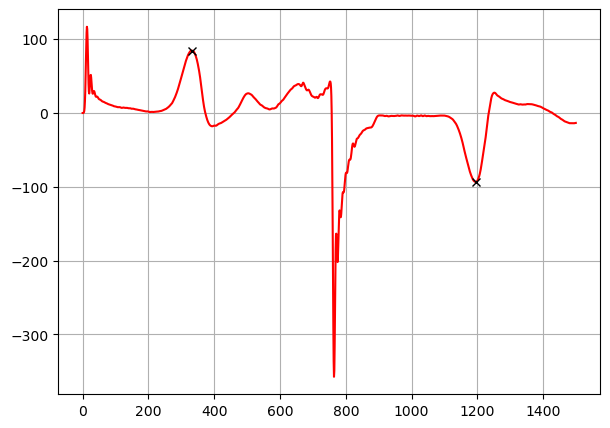

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


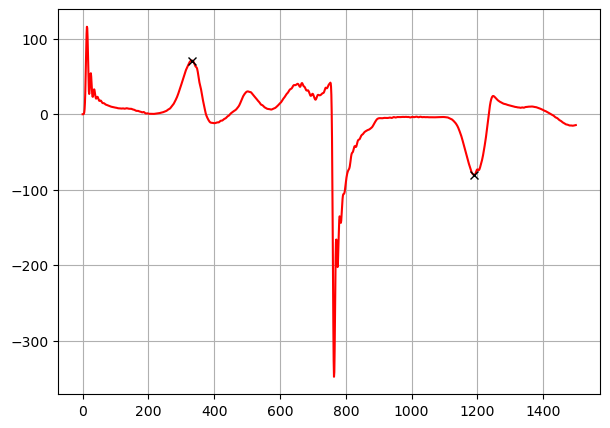

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


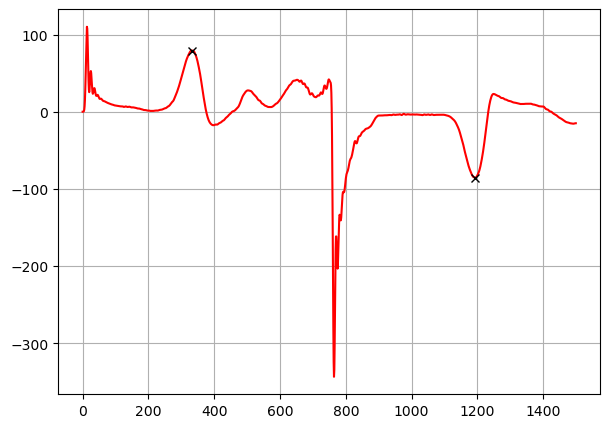

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


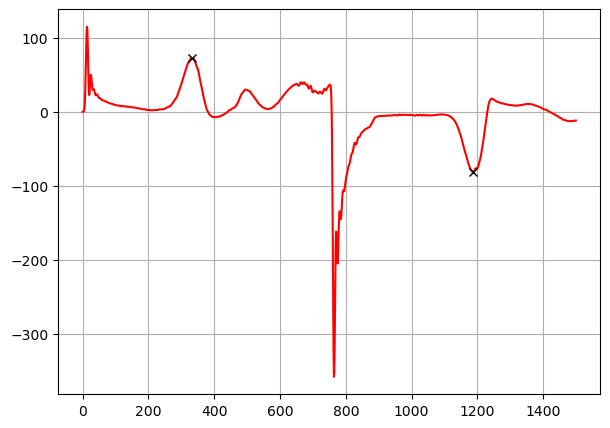

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


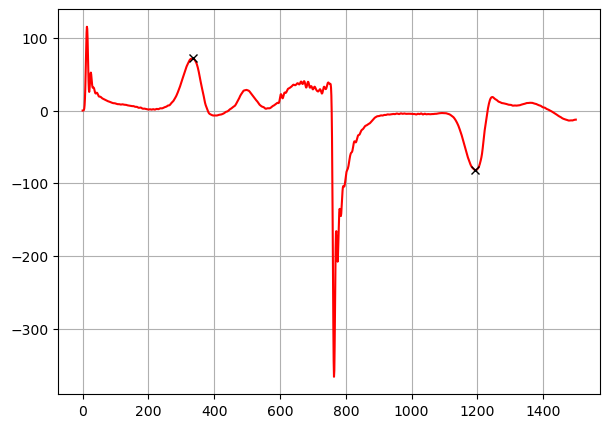

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


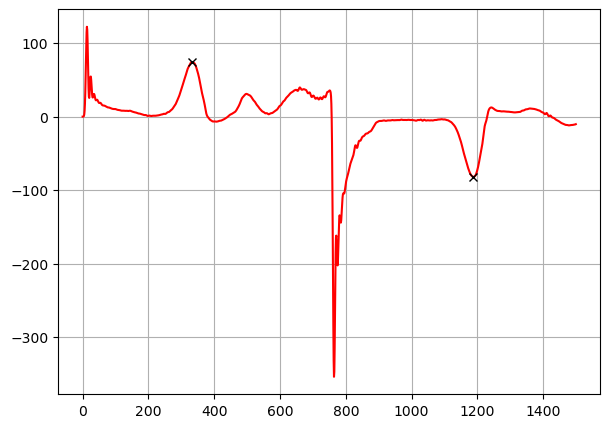

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


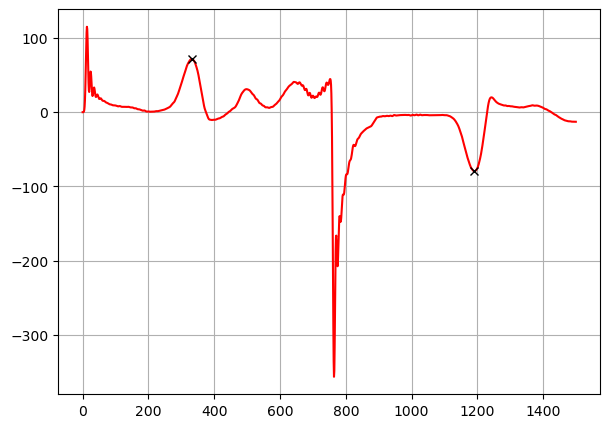

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


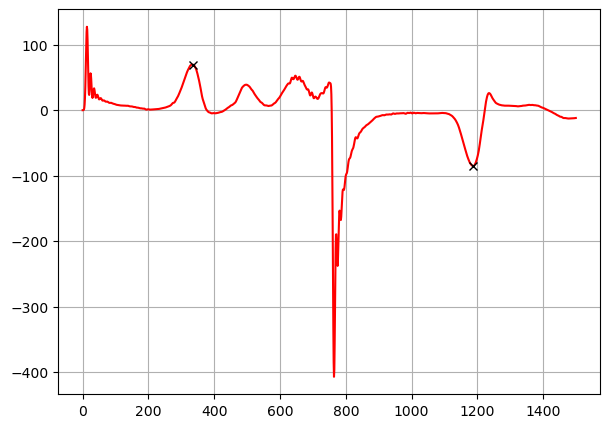

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


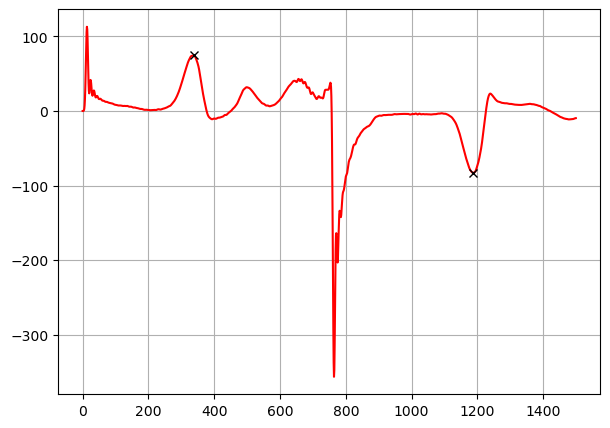

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


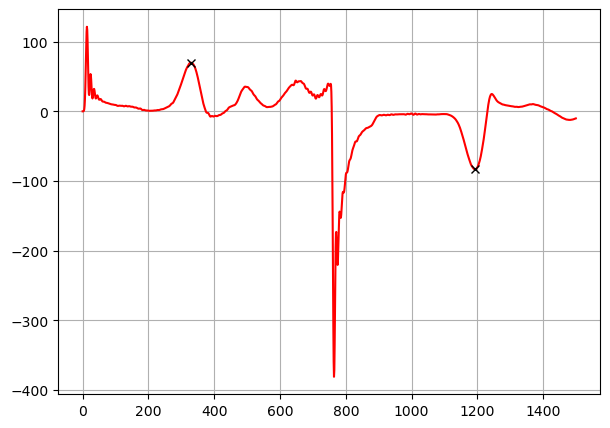

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


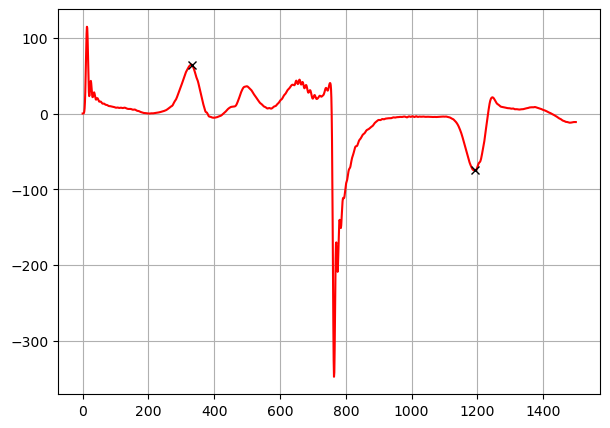

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


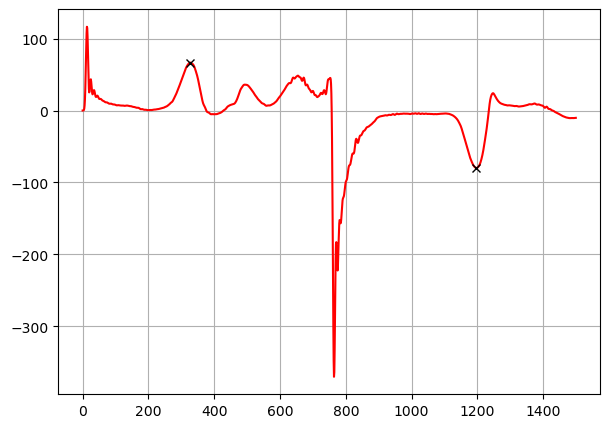

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


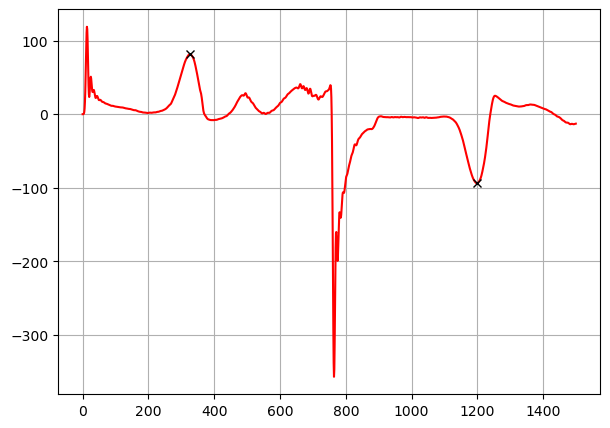

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


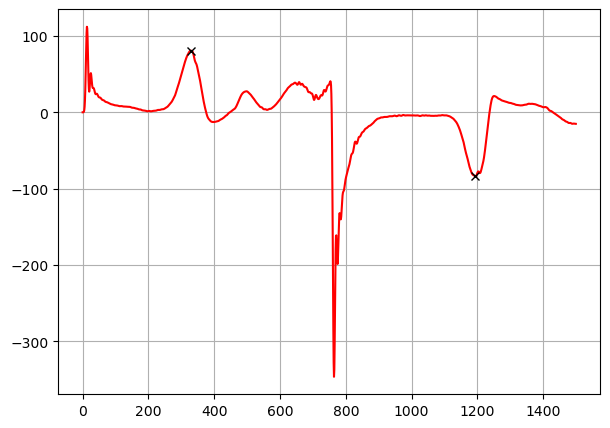

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


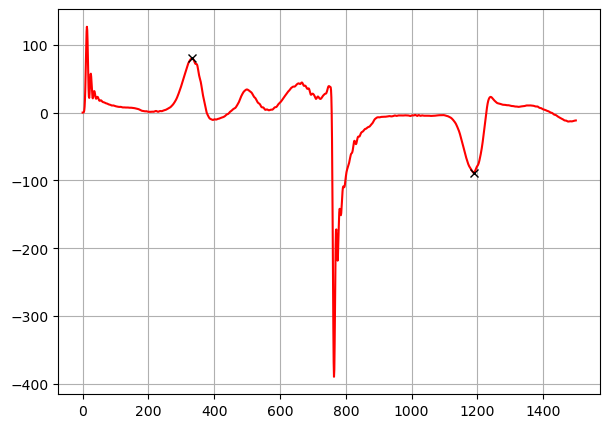

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


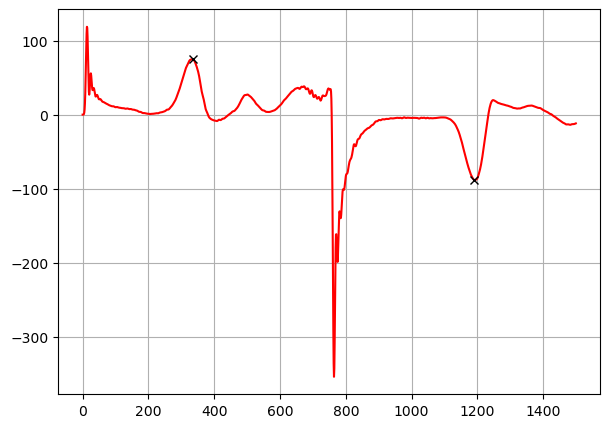

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


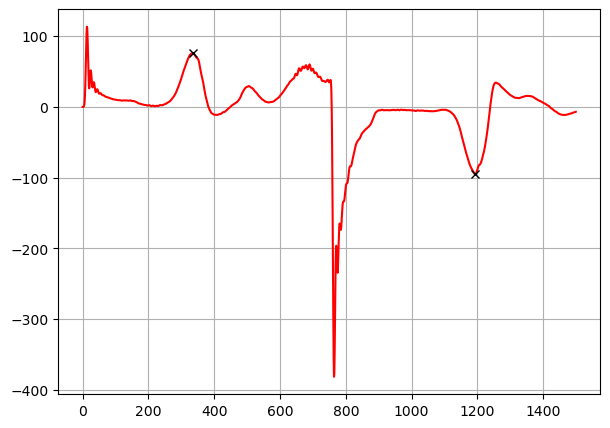

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


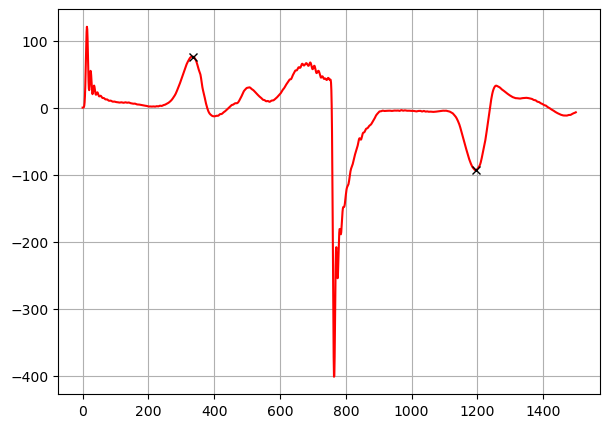

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


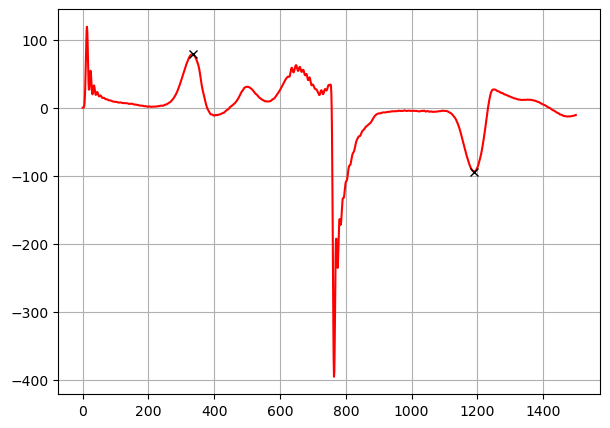

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


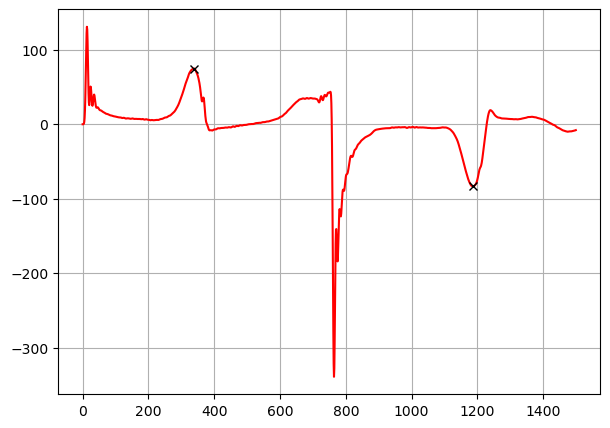

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


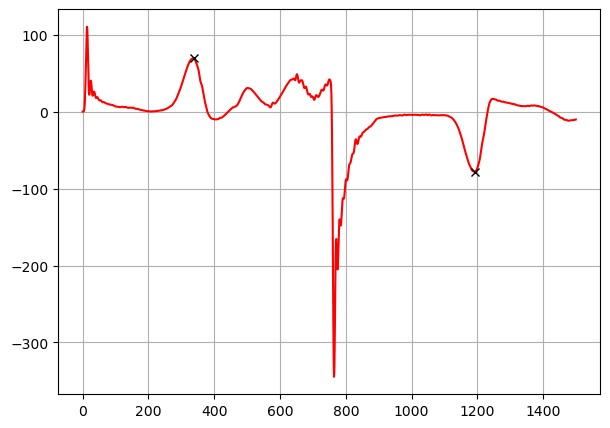

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


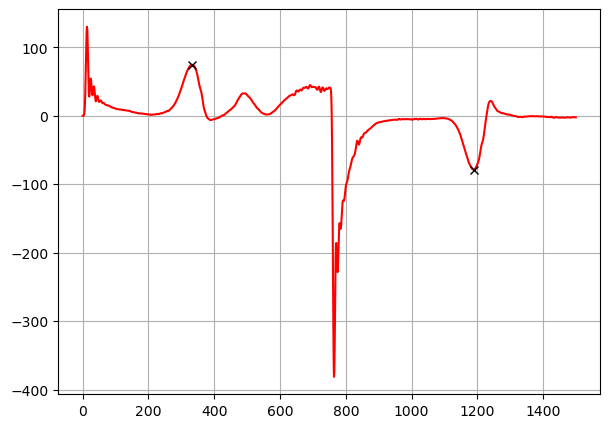

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


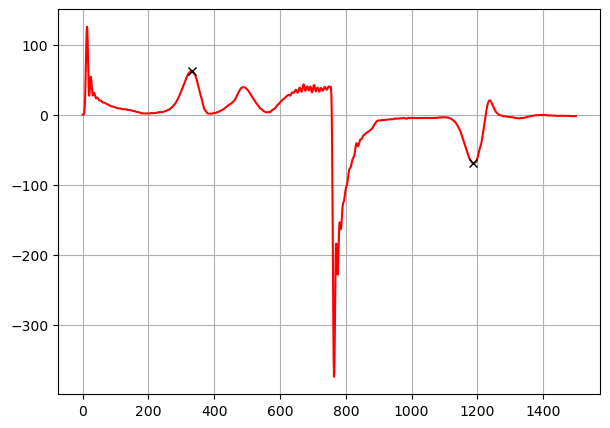

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


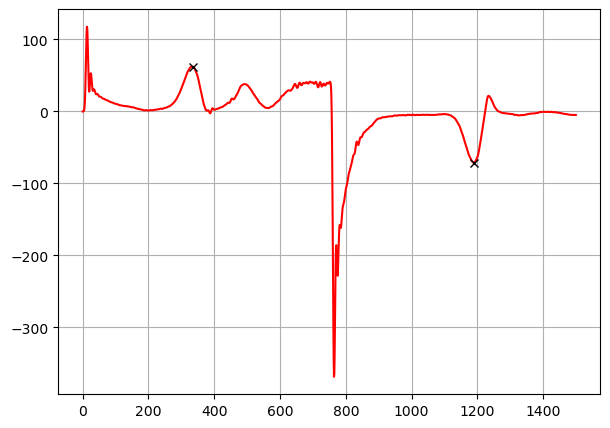

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


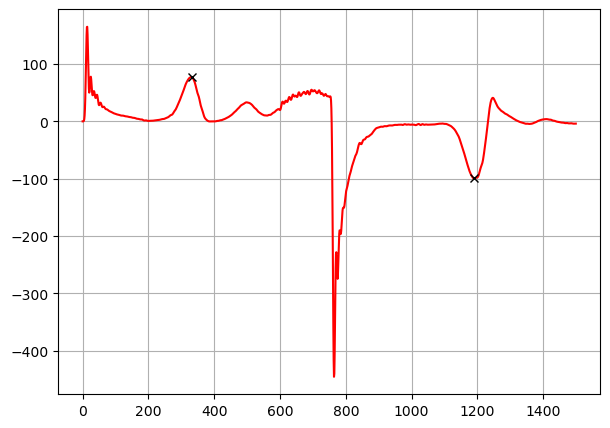

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


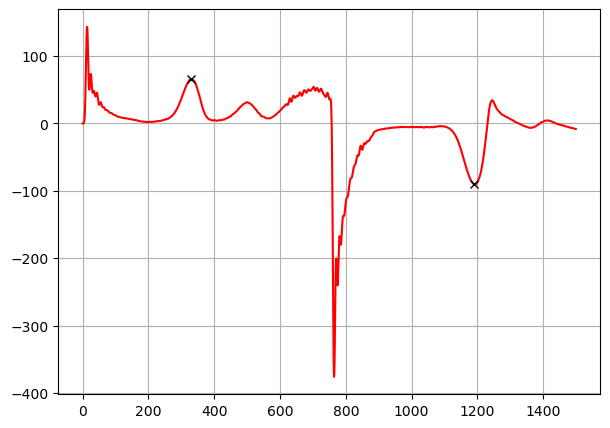

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


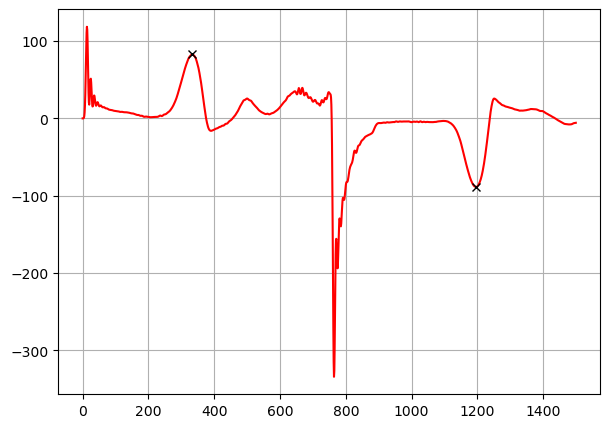

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


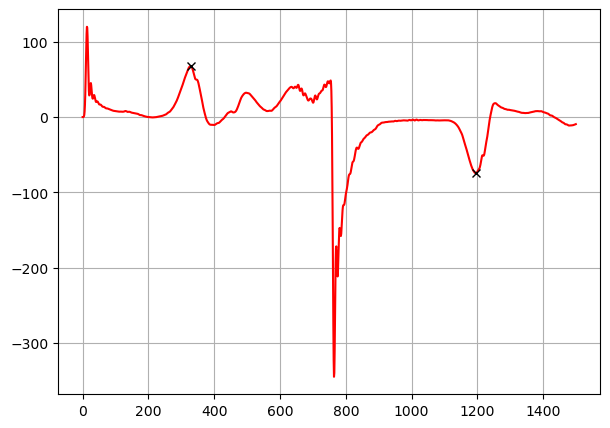

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


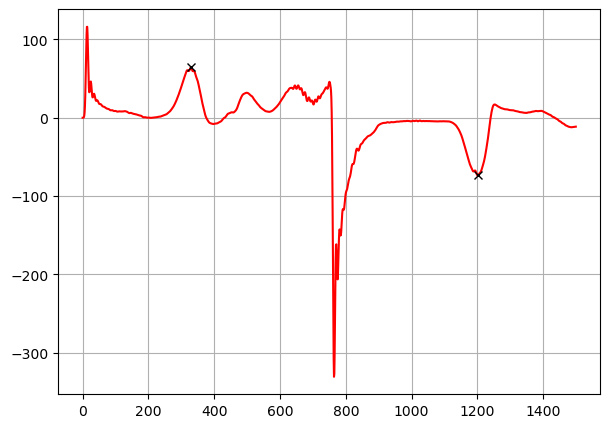

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


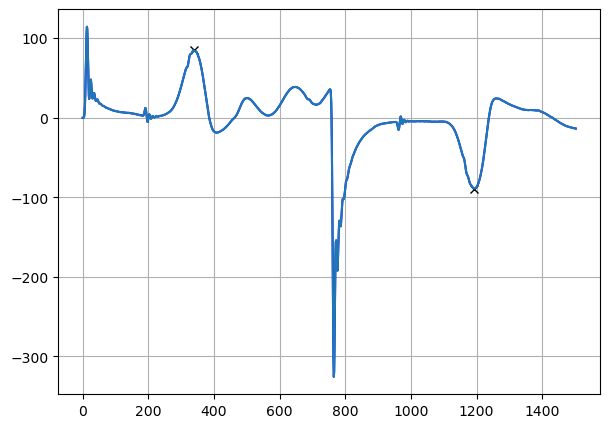

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


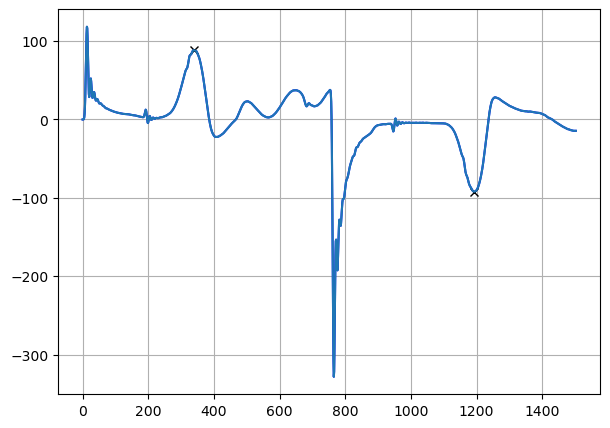

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


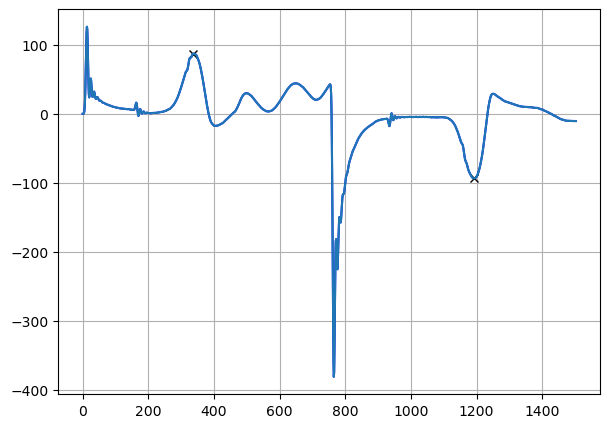

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


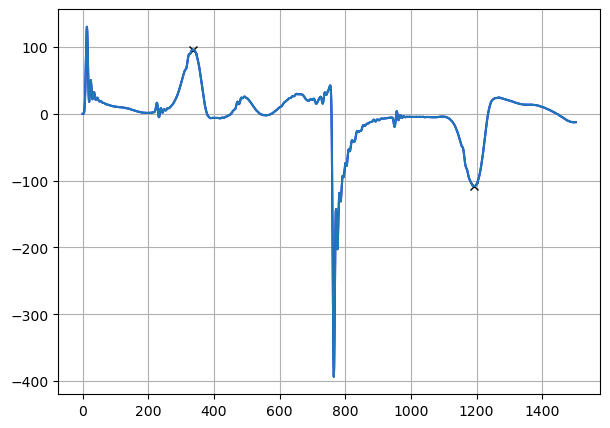

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


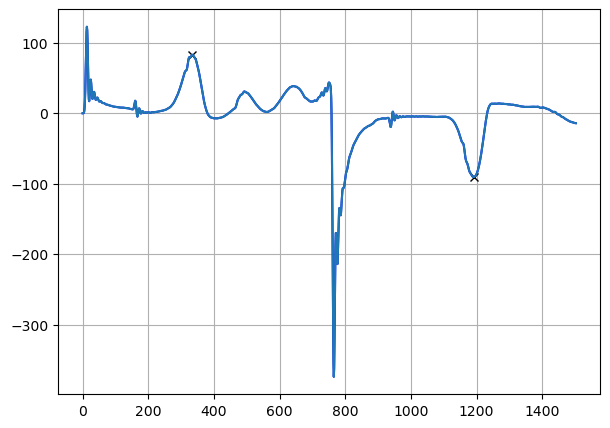

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


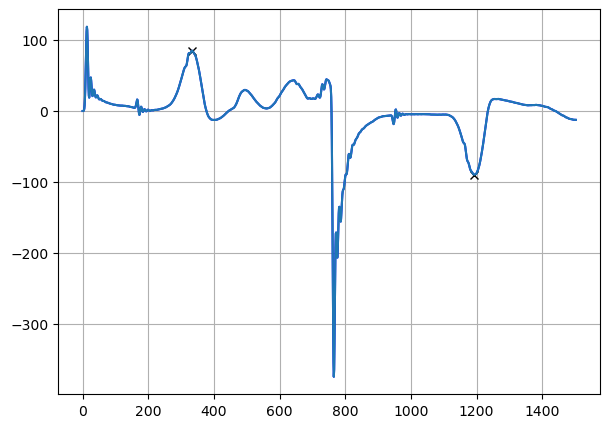

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


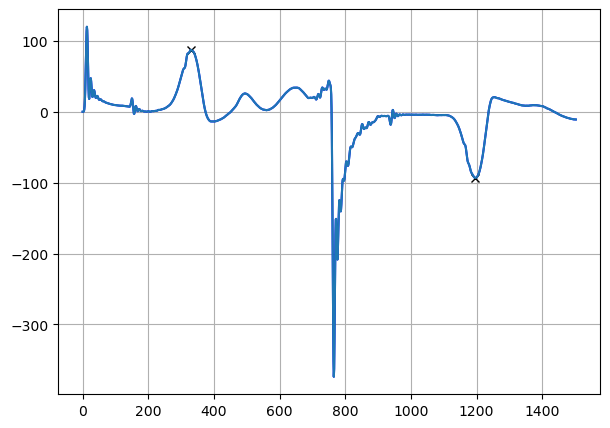

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


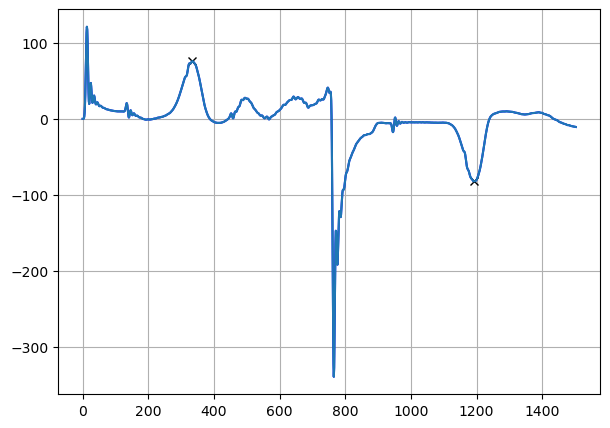

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


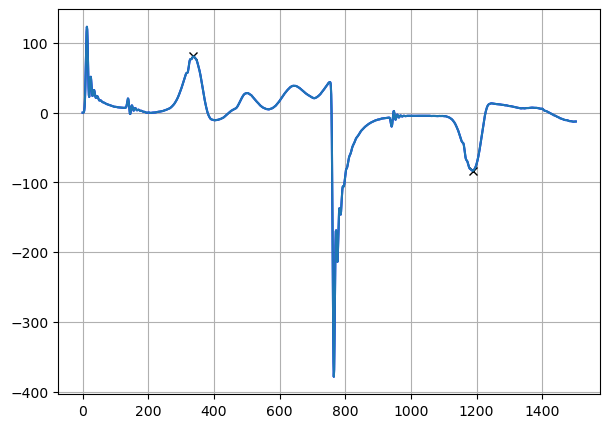

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


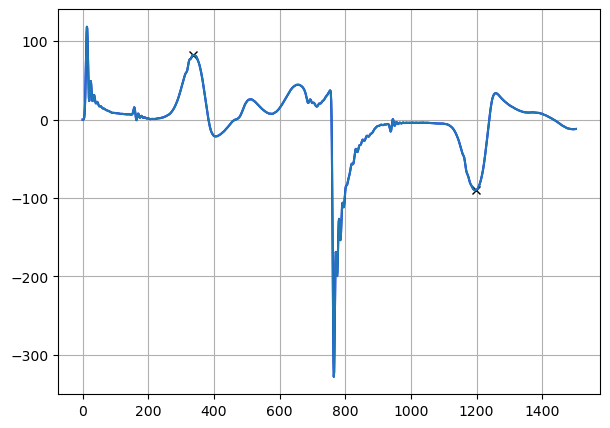

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


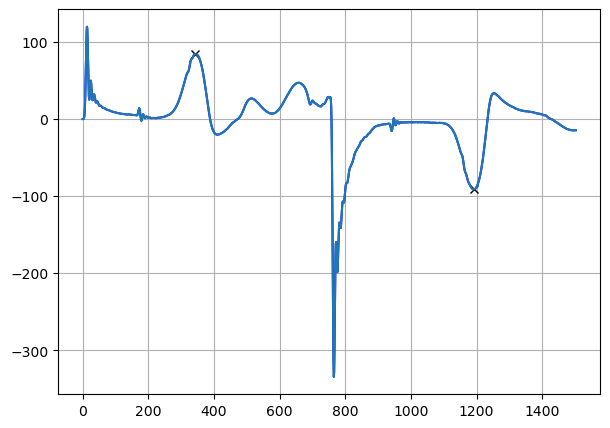

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


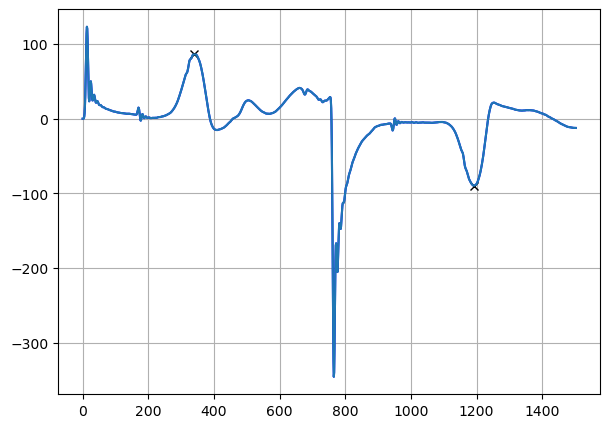

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


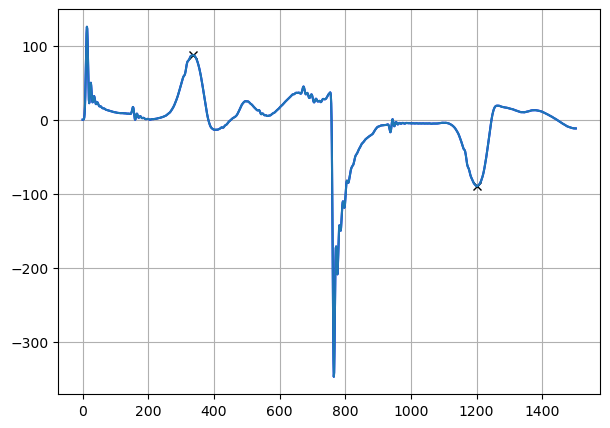

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


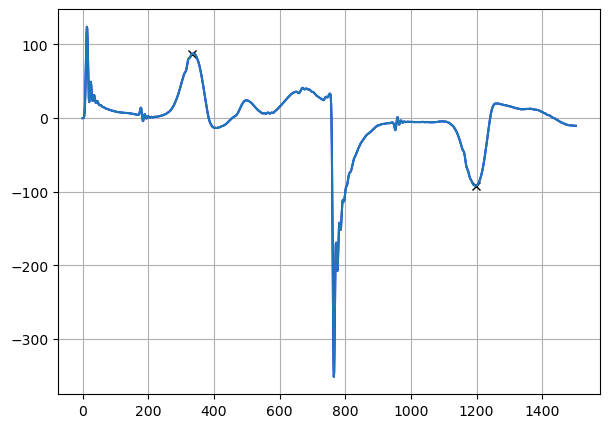

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


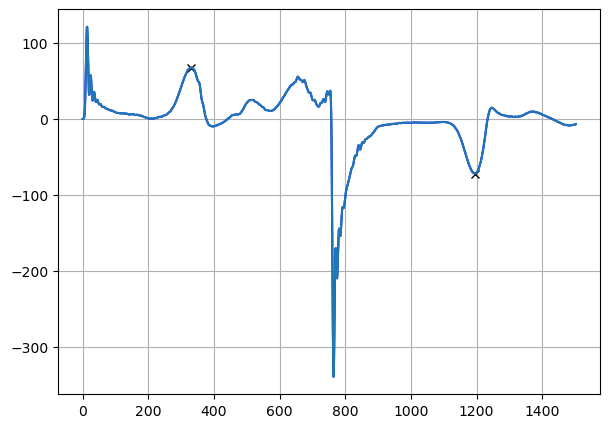

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


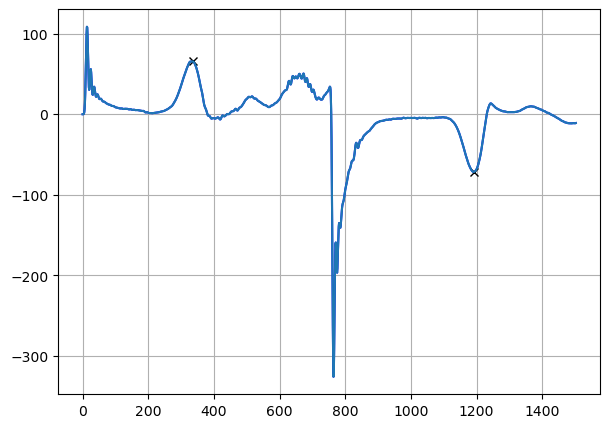

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


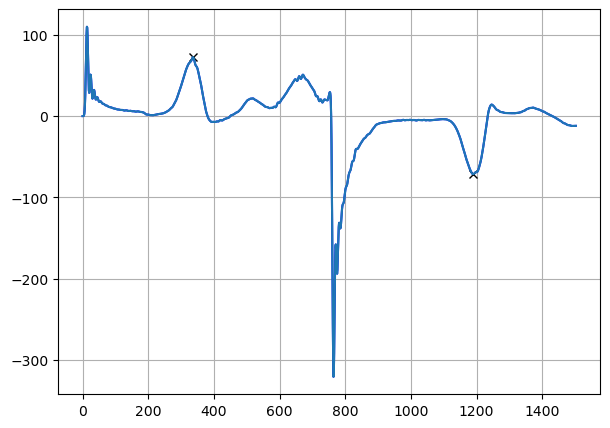

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


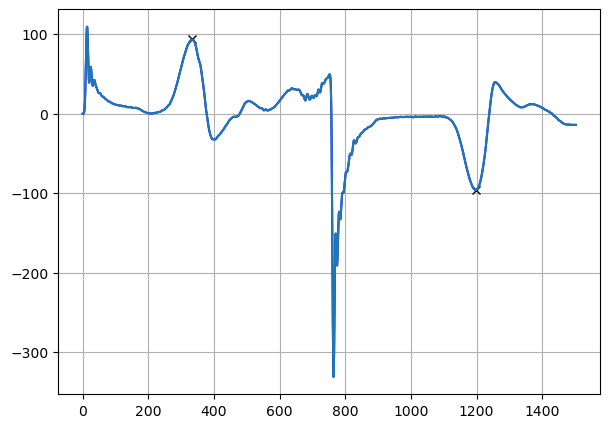

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


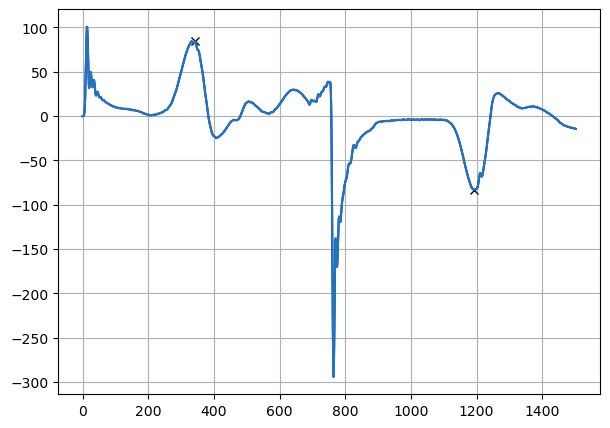

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


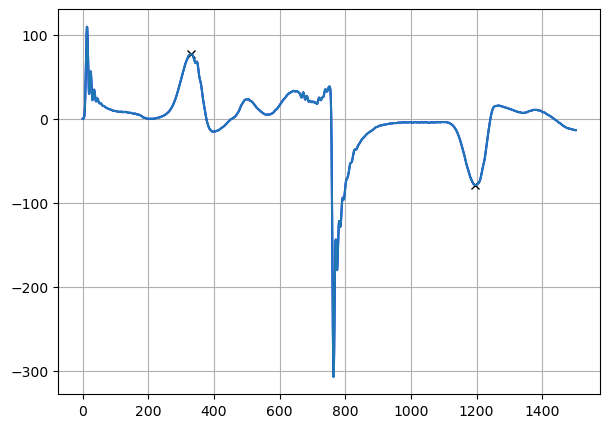

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


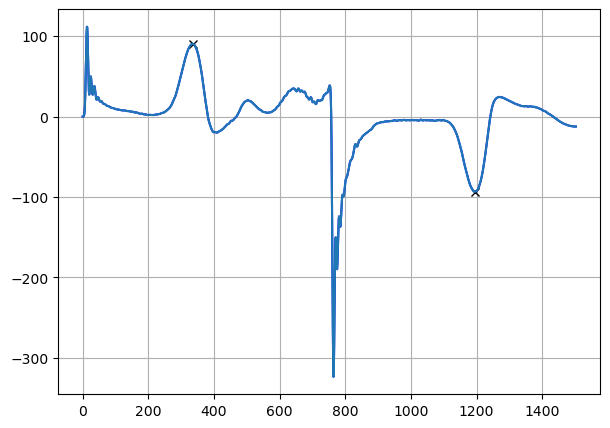

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


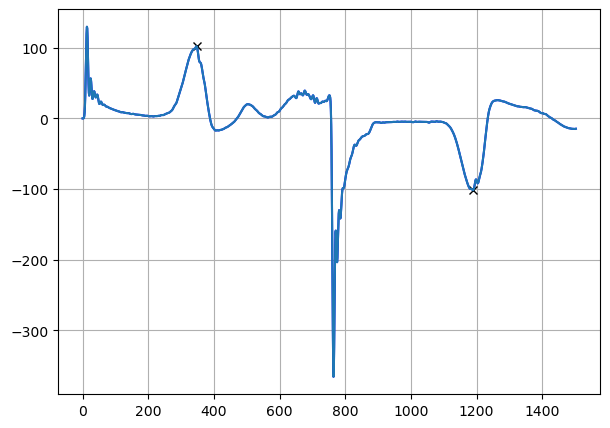

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


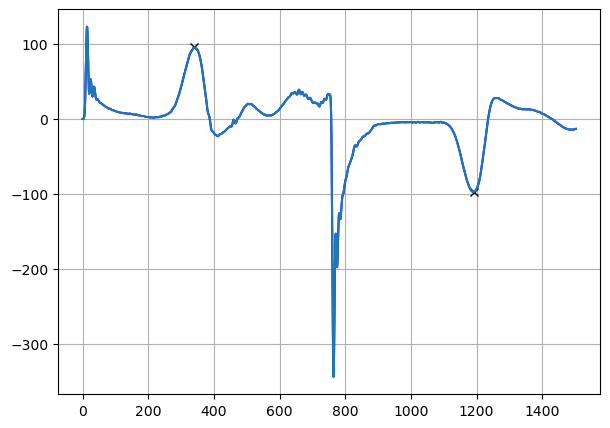

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


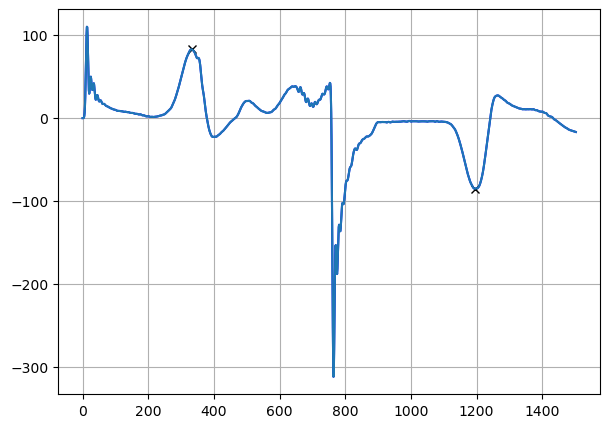

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


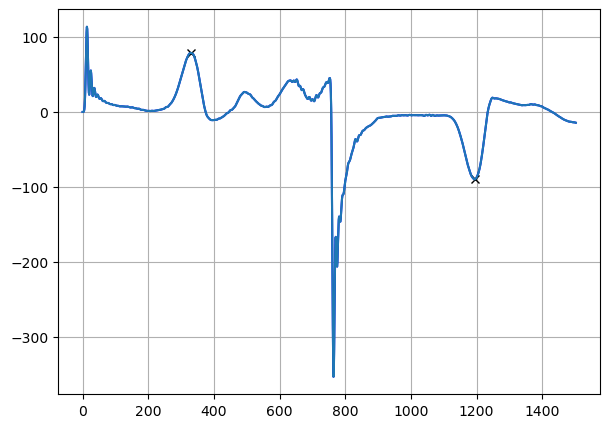

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


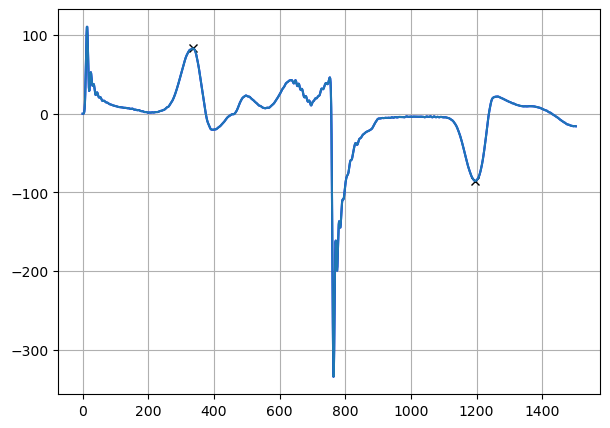

In [59]:
# Plotando o sinal da derivada dos negativos
negative_derivate_anodic_peak = []
negative_derivate_cathodic_peak = []
positive_derivate_anodic_peak = []
positive_derivate_cathodic_peak = []

for derivate in negative_derivate_list:
    fig, ax = plt.subplots(figsize=(7,5))
    (anodic, cathodic) = getAnodicAndCathodicArguments(derivate, fp, red_inf=1100, red_sup=1300)
    negative_derivate_anodic_peak.append(derivate[anodic])
    negative_derivate_cathodic_peak.append(derivate[cathodic])
    ax.plot(derivate, color='r')
    ax.plot(anodic, derivate[anodic], marker='x', color='black')
    ax.plot(cathodic, derivate[cathodic], marker='x', color='black')
    plt.grid()
    plt.show()

# Plotando o sinal da derivada negativa
for derivate in positive_derived_list:
    fig, ax = plt.subplots(figsize=(7,5))
    (anodic, cathodic) = getAnodicAndCathodicArguments(derivate, fp, red_inf=1100, red_sup=1300)
    positive_derivate_anodic_peak.append(derivate[anodic])
    positive_derivate_cathodic_peak.append(derivate[cathodic])
    ax.plot(derivate, color='b')
    ax.plot(anodic, derivate[anodic], marker='x', color='black')
    ax.plot(cathodic, derivate[cathodic], marker='x', color='black')
    ax.plot(derivate)
    plt.grid()
    plt.show()

Pico da derivada da corrente anódica - Positiva


Mean: 84.18259361478128
Median: 84.61967838739191
Std: 8.11960910151904
Maximum: 102.23293000549663
Minumum: 65.56774287732131


Pico da derivada da corrente anódica - Negativa


Mean: 73.08231840818445
Median: 74.18829167343135
Std: 6.057604587673455
Maximum: 84.52594486750432
Minumum: 62.17627670947495


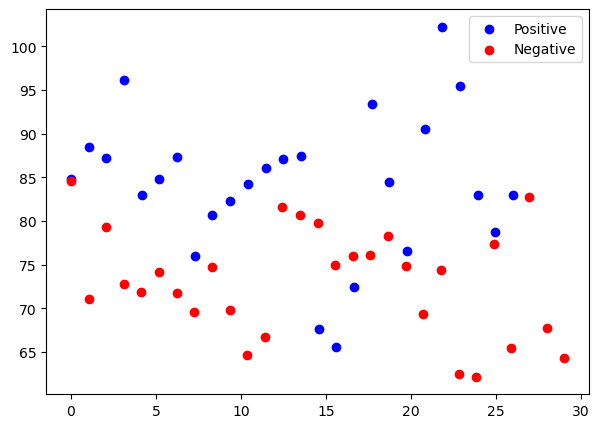

MannwhitneyuResult(statistic=658.0, pvalue=2.2593725669620864e-06)

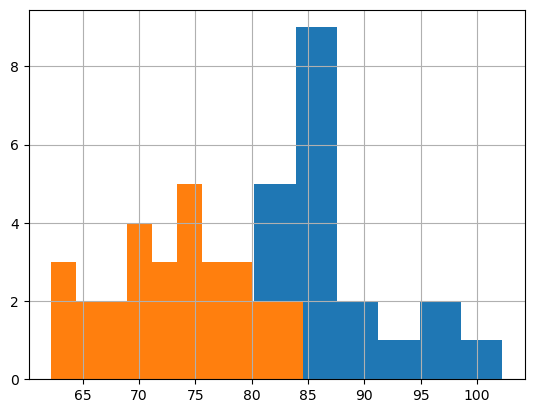

In [60]:
print("Pico da derivada da corrente anódica - Positiva\n\n")
showStatistics(positive_derivate_anodic_peak)
print("\n\nPico da derivada da corrente anódica - Negativa\n\n")
showStatistics(negative_derivate_anodic_peak)
plot_classes(positive_derivate_anodic_peak, negative_derivate_anodic_peak)
# Análise dos histogramas da derivada anódica
pd.Series(positive_derivate_anodic_peak).hist()
pd.Series(negative_derivate_anodic_peak).hist()
# Aplicando o teste de Mann-Whitney
stats.mannwhitneyu(positive_derivate_anodic_peak, negative_derivate_anodic_peak, alternative='two-sided')

Pico da derivada da corrente Catódica - Positiva


Mean: -88.51359590865026
Median: -89.87118177840183
Std: 8.491615763885838
Maximum: -71.38180784848193
Minumum: -108.13041500056754


Pico da derivada da corrente Catódica - Negativa


Mean: -83.99999216054675
Median: -83.27355509742826
Std: 7.532355078786618
Maximum: -69.09553658245795
Minumum: -99.57614167949077


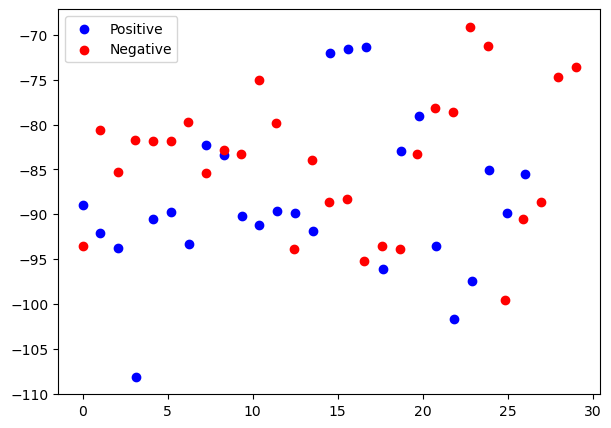

MannwhitneyuResult(statistic=253.0, pvalue=0.037343709393861446)

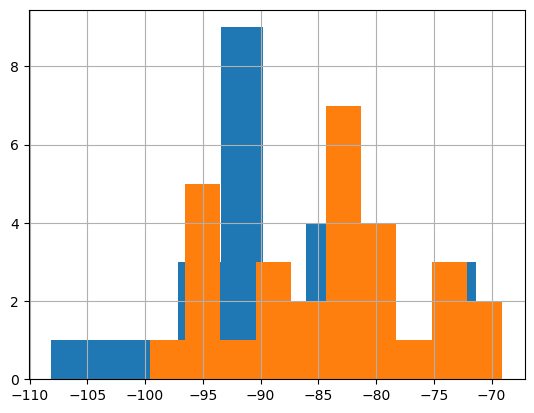

In [61]:
print("Pico da derivada da corrente Catódica - Positiva\n\n")
showStatistics(positive_derivate_cathodic_peak)
print("\n\nPico da derivada da corrente Catódica - Negativa\n\n")
showStatistics(negative_derivate_cathodic_peak)
plot_classes(positive_derivate_cathodic_peak, negative_derivate_cathodic_peak)
# Análise dos histogramas da derivada anódica
pd.Series(positive_derivate_cathodic_peak).hist()
pd.Series(negative_derivate_cathodic_peak).hist()
stats.mannwhitneyu(positive_derivate_cathodic_peak, negative_derivate_cathodic_peak, alternative='two-sided')

# Montagem do dataset
## Features
['corrente_anodica', 'corrente_catodica', 'carga','diff_corrente_anodica_catodica', 'diff_pot_anodico_catodico', 'pico_derivada_anodica', 'pico_derivada_catodica', 'target']

In [62]:
print(len(positive_anodic_current))
print(len(positive_cathodic_current))
print(len(charge_pos))
print(len(positive_diff_ano_cat_current))
print(len(positive_diff_ano_cat_potential))
print(len(positive_derivate_anodic_peak))
print(len(positive_derivate_cathodic_peak))

26
26
26
26
26
26
26


In [63]:
print(len(negative_anodic_current))
print(len(negative_cathodic_current))
print(len(charge_neg))
print(len(negative_diff_ano_cat_current))
print(len(negative_diff_ano_cat_potential))
print(len(negative_derivate_anodic_peak))
print(len(negative_derivate_cathodic_peak))

29
29
29
29
29
29
29


In [64]:
columns = ['corrente_anodica', 'corrente_catodica', 'carga','diff_corrente_anodica_catodica', 'diff_pot_anodico_catodico', 'pico_derivada_anodica', 'pico_derivada_catodica', 'target']
positive_df = pd.DataFrame(columns=columns)
negative_df = pd.DataFrame(columns=columns)
positive_df['corrente_anodica'] = np.array(positive_anodic_current)
positive_df['corrente_catodica'] = np.array(positive_cathodic_current)
positive_df['carga'] = np.array(charge_pos)
positive_df['diff_corrente_anodica_catodica'] = np.array(positive_diff_ano_cat_current)
positive_df['diff_pot_anodico_catodico'] = np.array(positive_diff_ano_cat_potential)
positive_df['pico_derivada_anodica'] = np.array(positive_derivate_anodic_peak)
positive_df['pico_derivada_catodica'] = np.array(positive_derivate_cathodic_peak)
positive_df['target'] = np.ones(shape=(len(charge_pos), 1), dtype=np.int8)

negative_df['corrente_anodica'] = np.array(negative_anodic_current)
negative_df['corrente_catodica'] = np.array(negative_cathodic_current)
negative_df['carga'] = np.array(charge_neg)
negative_df['diff_corrente_anodica_catodica'] = np.array(negative_diff_ano_cat_current)
negative_df['diff_pot_anodico_catodico'] = np.array(negative_diff_ano_cat_potential)
negative_df['pico_derivada_anodica'] = np.array(negative_derivate_anodic_peak)
negative_df['pico_derivada_catodica'] = np.array(negative_derivate_cathodic_peak)
negative_df['target'] = np.zeros(shape=(len(charge_neg), 1), dtype=np.int8)


In [65]:
positive_df.isna().sum()

corrente_anodica                  0
corrente_catodica                 0
carga                             0
diff_corrente_anodica_catodica    0
diff_pot_anodico_catodico         0
pico_derivada_anodica             0
pico_derivada_catodica            0
target                            0
dtype: int64

In [66]:
negative_df.isna().sum()

corrente_anodica                  2
corrente_catodica                 0
carga                             0
diff_corrente_anodica_catodica    2
diff_pot_anodico_catodico         2
pico_derivada_anodica             0
pico_derivada_catodica            0
target                            0
dtype: int64

In [67]:
dataset_complete = pd.concat([positive_df, negative_df], axis=0, ignore_index=True, verify_integrity=True)

In [69]:
dataset_complete[dataset_complete['target']==1.0].describe()

,corrente_anodica,corrente_catodica,carga,diff_corrente_anodica_catodica,diff_pot_anodico_catodico,pico_derivada_anodica,pico_derivada_catodica,target
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.0
mean,109.112384,-125.777769,589.391949,234.890152,0.193349,84.182594,-88.513596,1.0
std,11.356381,13.481927,53.240799,24.200376,0.011868,8.280409,8.659783,0.0
min,85.110664,-151.755452,497.062683,183.615303,0.173691,65.567743,-108.130415,1.0
25%,100.935494,-133.795065,548.938845,218.051300,0.182176,81.135140,-92.979743,1.0
50%,110.868300,-127.247249,587.301110,240.049589,0.196651,84.619678,-89.871182,1.0
75%,117.869126,-119.420500,618.818614,252.417179,0.201642,87.434724,-83.786498,1.0
max,128.505087,-98.504639,693.525736,280.260539,0.213620,102.232930,-71.381808,1.0


In [70]:
dataset_complete.loc[dataset_complete.isna().any(axis=1)]
dataset_complete.fillna(0, inplace=True)
dataset_complete.to_csv("complete_dataset.csv")

# Analizando utilizando a transformada discreta de Fourier

### FFT dos dados Negativos

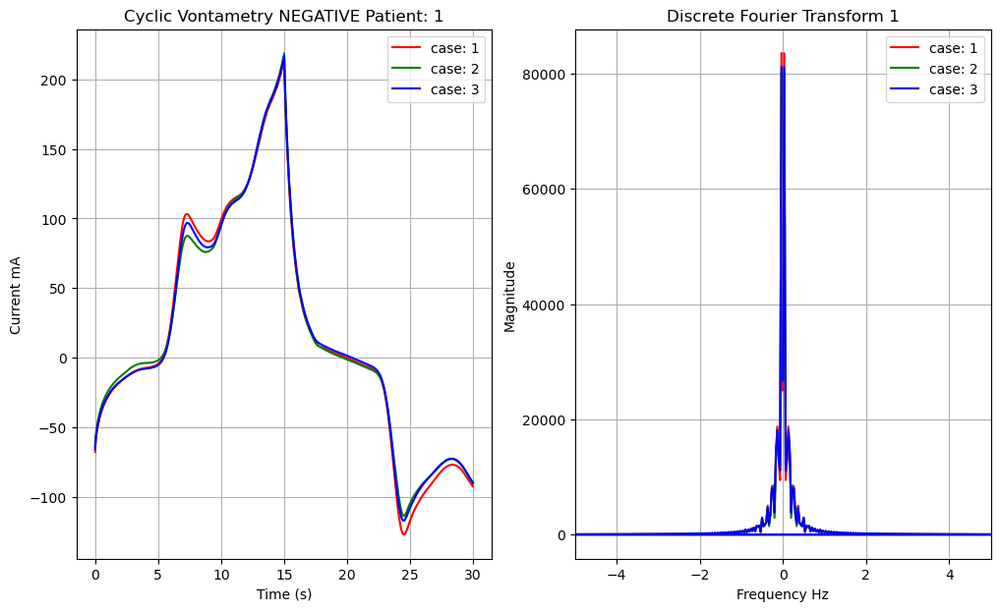

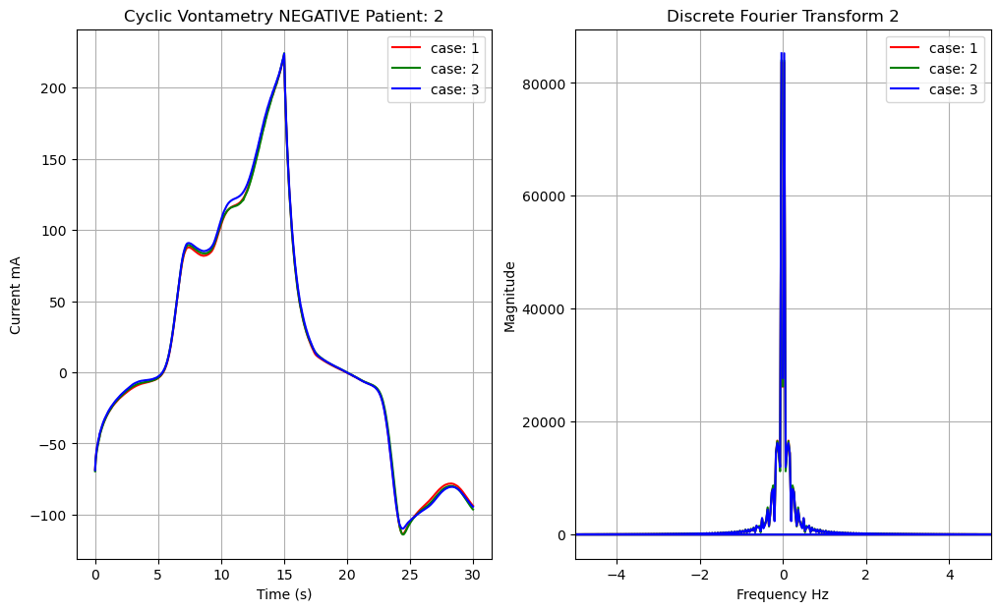

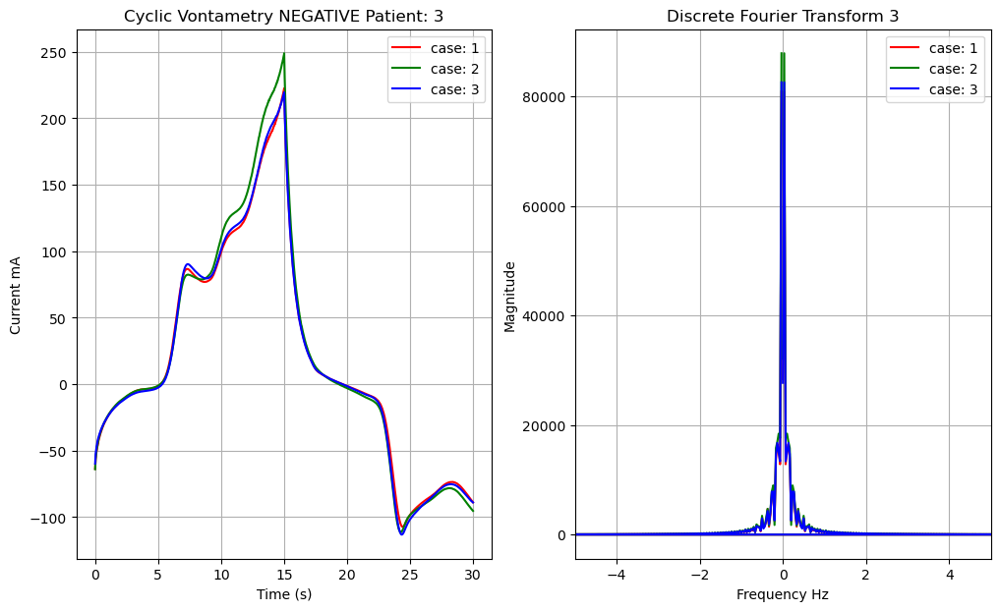

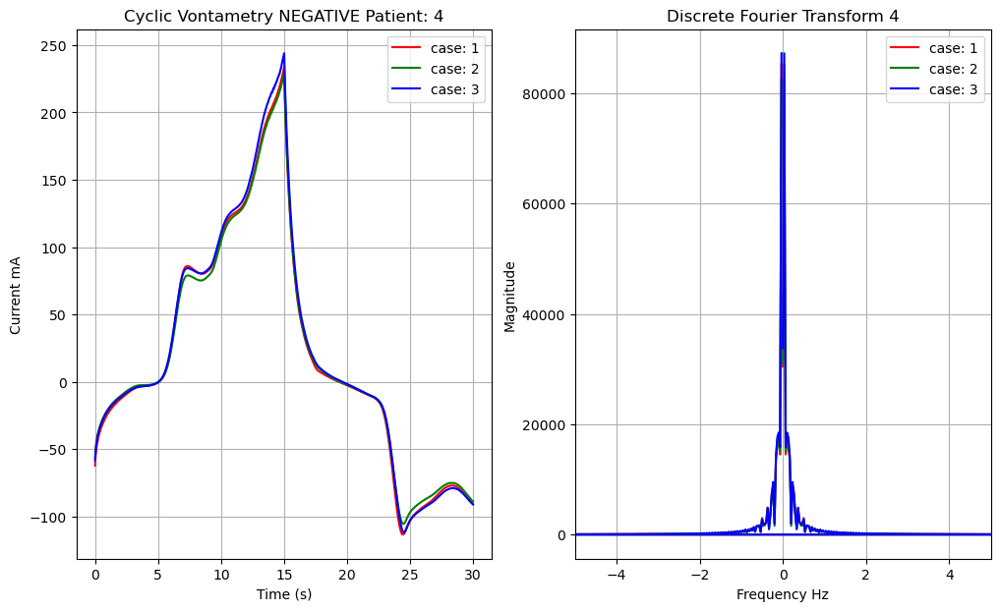

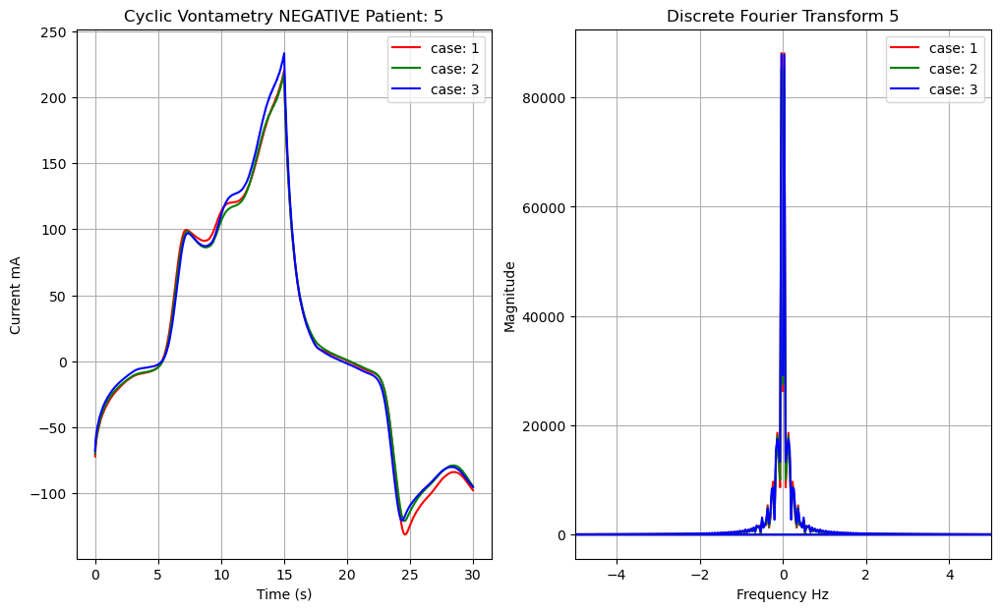

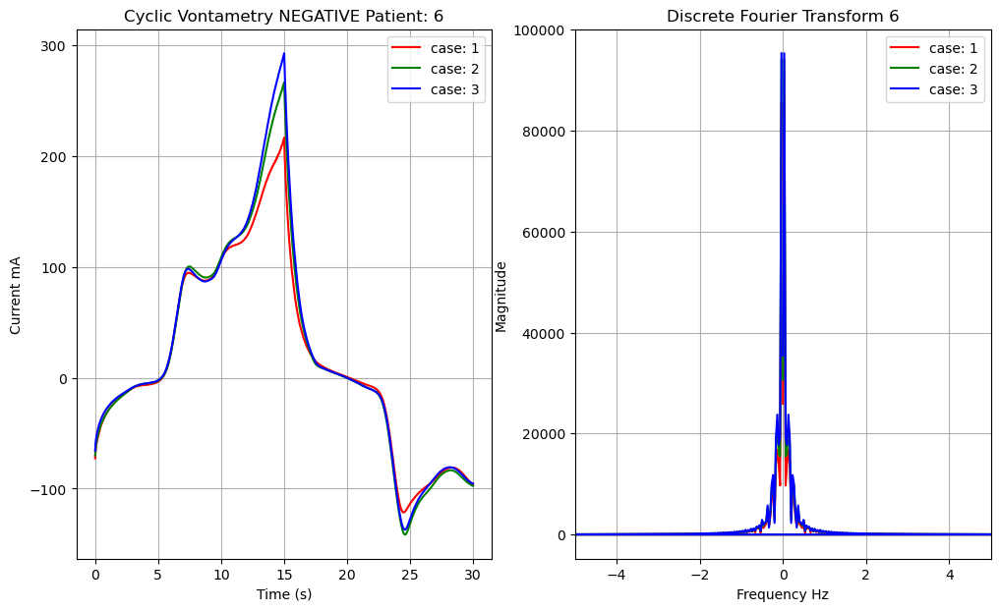

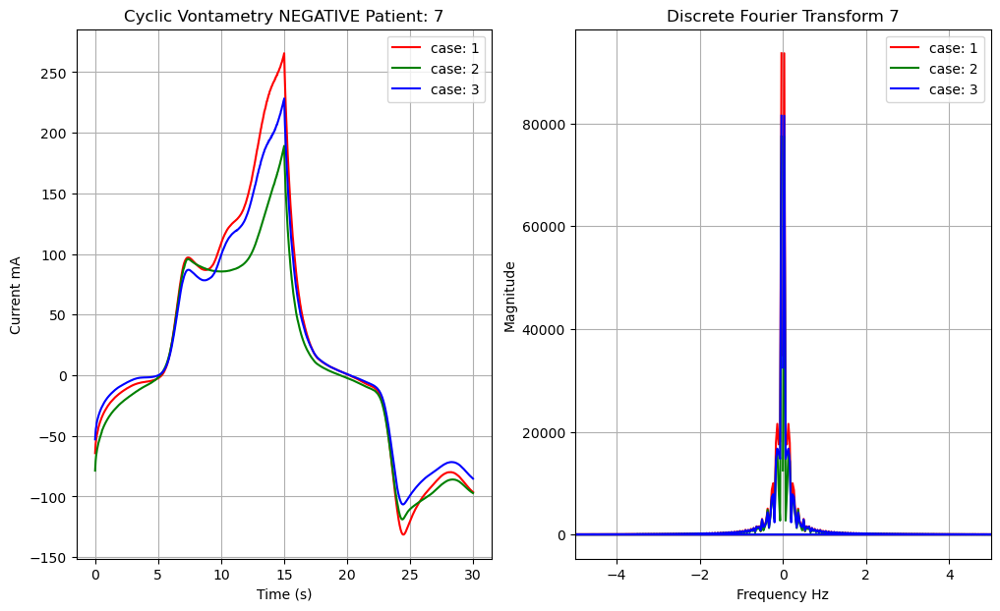

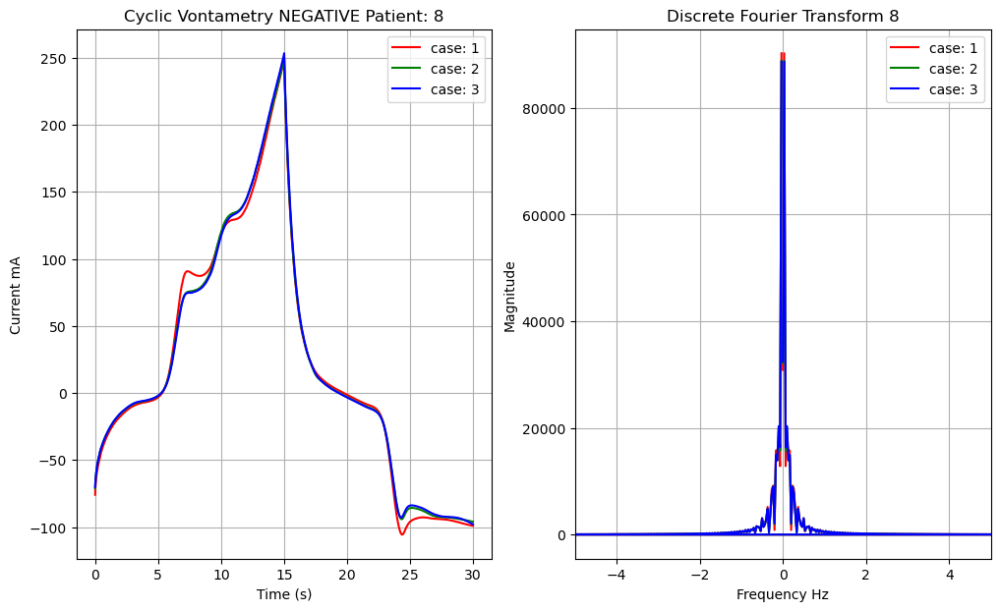

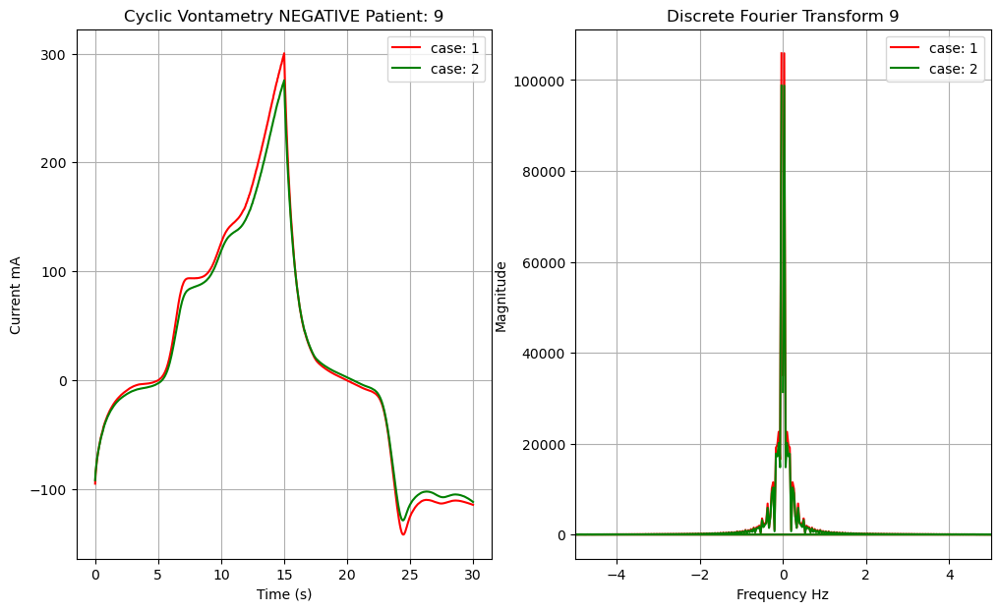

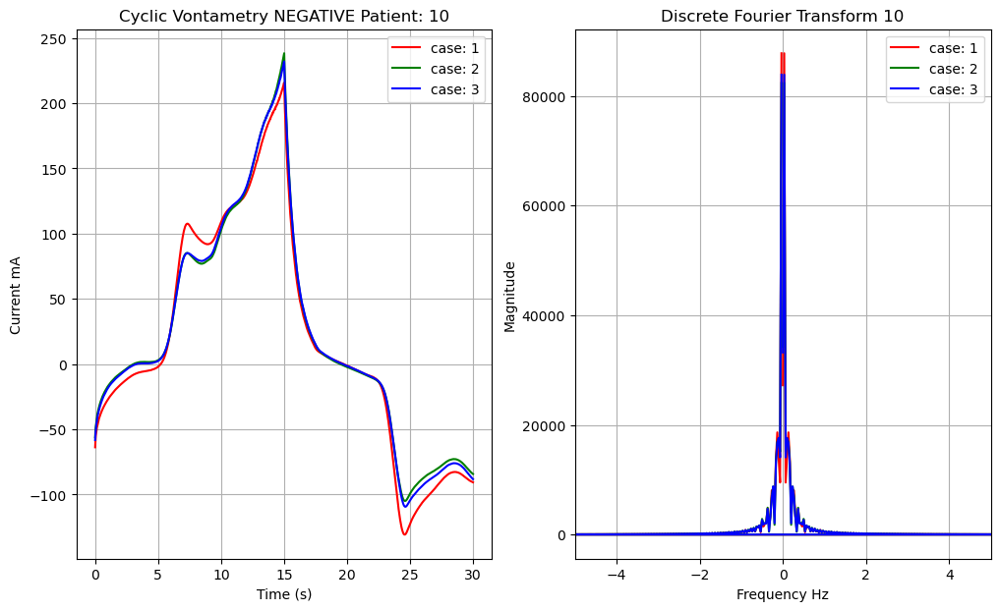

In [71]:
#Plotagem dos coeficientes dos casos negativos
patient_count = 1
patients = final_neg_df.columns
patient_anterior = ''
plots = 0
time_neg = getTime(0.1, potential_neg)
negative_fft_df = pd.DataFrame()

for i in range (1, final_neg_df.shape[1]):
    
    current = final_neg_df.iloc[:, i].values
    sample_period = time_neg[1] - time_neg[0]
    (fft, freqs) = getFFTAndFrequencies(current, sample_period)
    negative_fft_df[patients[i] + " freq"] = freqs
    negative_fft_df[patients[i] + " fft"] = fft
    
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2,figsize=(12,7))
        patient_anterior = patients[i][9]
        ax1.set_title("Cyclic Vontametry NEGATIVE Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Time (s)")
        ax1.grid(True)
        
        ax2.set_title("Discrete Fourier Transform " + str(patient_count))
        ax2.set_ylabel("Magnitude")
        ax2.set_xlabel("Frequency Hz")
        ax2.set_xlim((-5, 5))
        
        ax2.grid(True)
        
        patient_count += 1
        
          
    ax1.plot(time_neg, current, color=colors[plots], label="case: " + str(plots + 1))
    ax1.legend() 
    ax2.plot(freqs, fft, color=colors[plots], label="case: " + str(plots + 1))
    ax2.legend()
    plots += 1
    
plt.show()

In [72]:
negative_fft_df.head()

,Paciente J (1) freq,Paciente J (1) fft,Paciente J (2) freq,Paciente J (2) fft,Paciente J (3) freq,Paciente J (3) fft,Paciente K (1) freq,Paciente K (1) fft,Paciente K (2) freq,Paciente K (2) fft,...,Paciente R (1) freq,Paciente R (1) fft,Paciente R (2) freq,Paciente R (2) fft,Paciente S (1) freq,Paciente S (1) fft,Paciente S (2) freq,Paciente S (2) fft,Paciente S (3) freq,Paciente S (3) fft
0,0.000000,25035.202372,0.000000,26604.932146,0.000000,26759.704639,0.000000,26216.454794,0.000000,26291.125171,...,0.000000,35089.807212,0.000000,31368.761763,0.000000,27244.062716,0.000000,34257.958232,0.000000,33214.372880
1,0.033332,83527.617751,0.033332,80071.505943,0.033332,81109.426234,0.033332,83597.445934,0.033332,83950.311228,...,0.033332,105882.003598,0.033332,98749.341341,0.033332,87786.742859,0.033332,82380.279467,0.033332,83880.048046
2,0.066664,9464.062109,0.066664,11992.333297,0.066664,11115.459370,0.066664,12137.032428,0.066664,11219.935147,...,0.066664,16516.759041,0.066664,14814.815350,0.066664,9506.248856,0.066664,15106.813775,0.066664,14086.956002
3,0.099995,12674.244473,0.099995,14745.337583,0.099995,12965.795806,0.099995,14454.997463,0.099995,14593.560245,...,0.099995,22615.728816,0.099995,20163.831105,0.099995,13879.854209,0.099995,17577.104032,0.099995,17625.427440
4,0.133327,18749.177981,0.133327,17028.911277,0.133327,18171.915296,0.133327,16649.526320,0.133327,16539.188759,...,0.133327,19695.016157,0.133327,17213.817254,0.133327,18648.586864,0.133327,16912.237252,0.133327,16771.402635


### FFT dos dados positivos

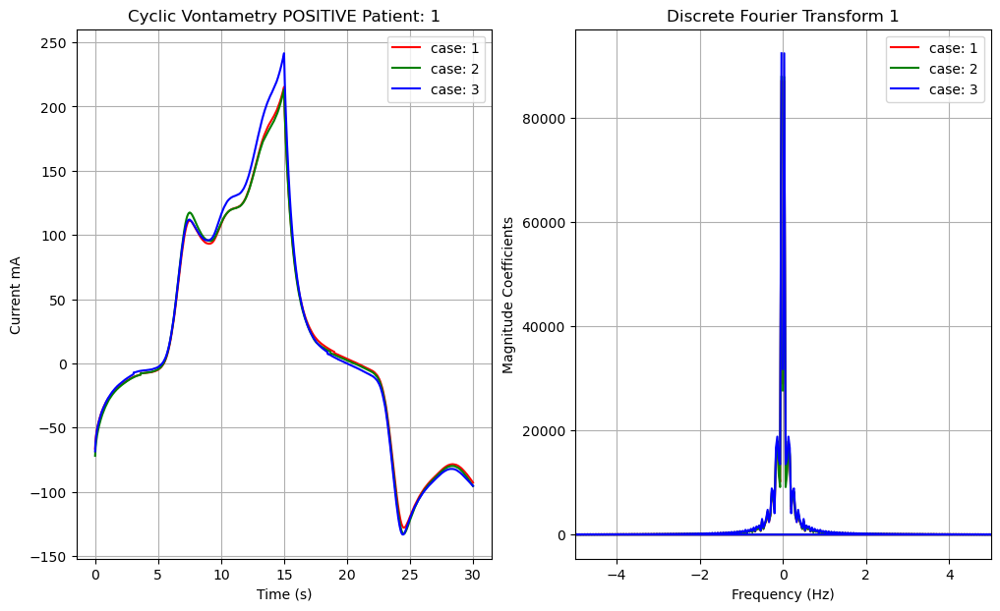

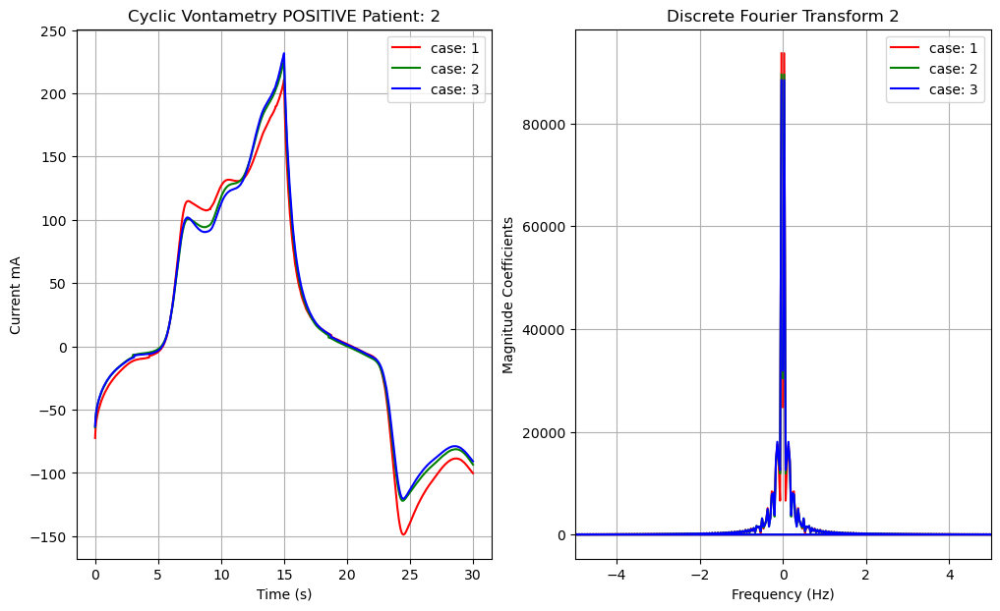

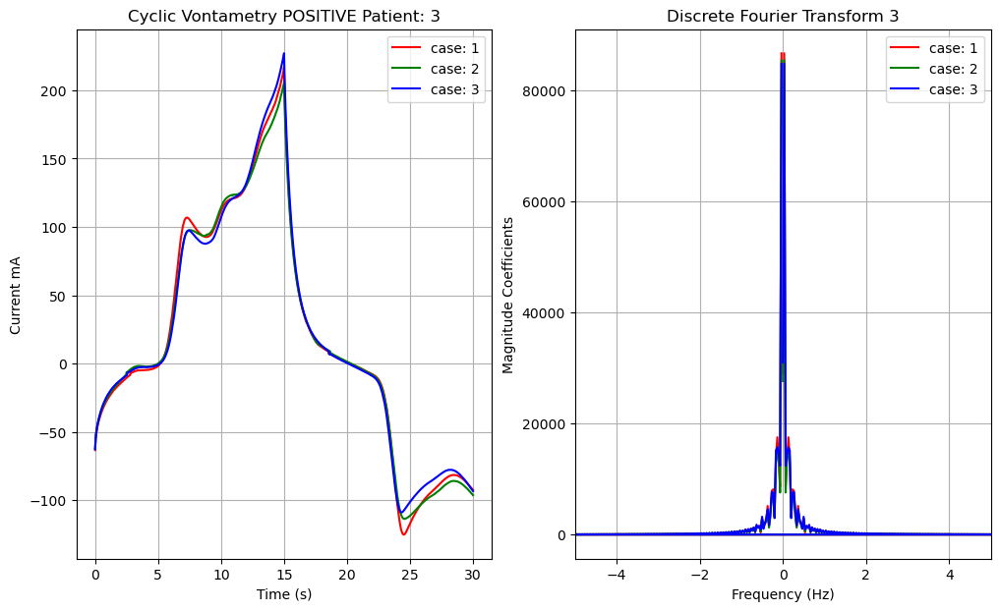

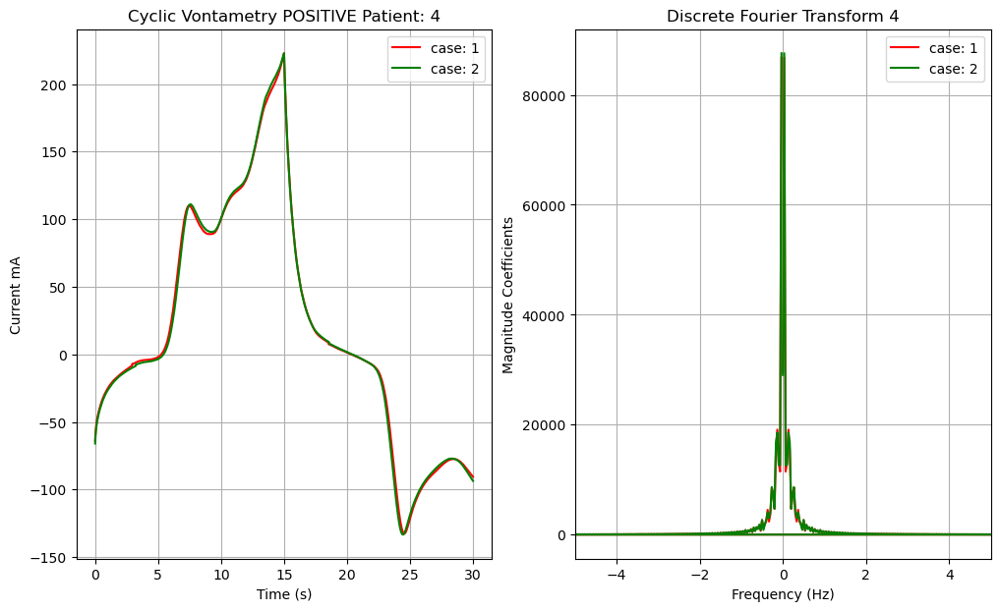

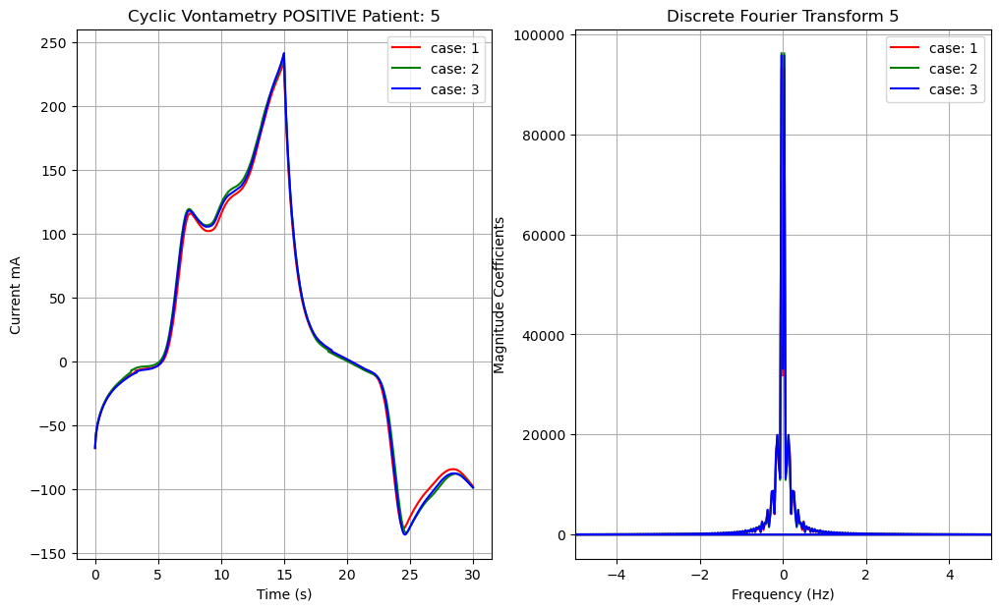

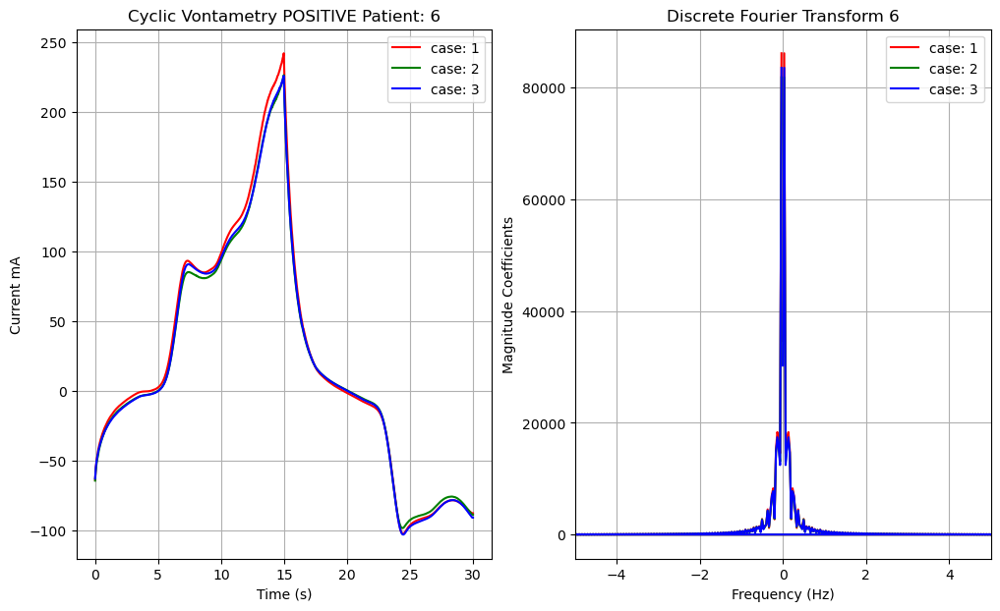

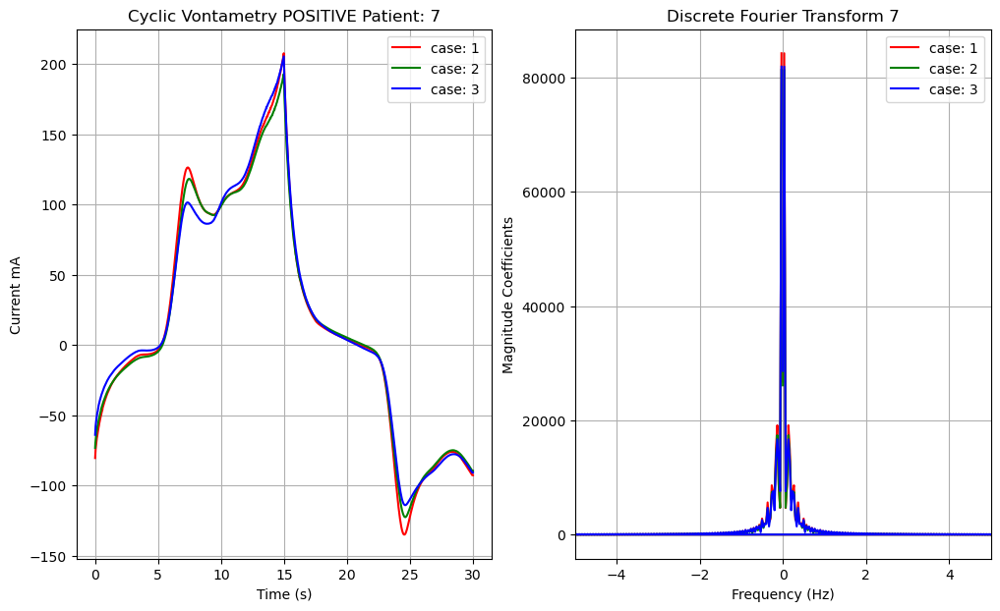

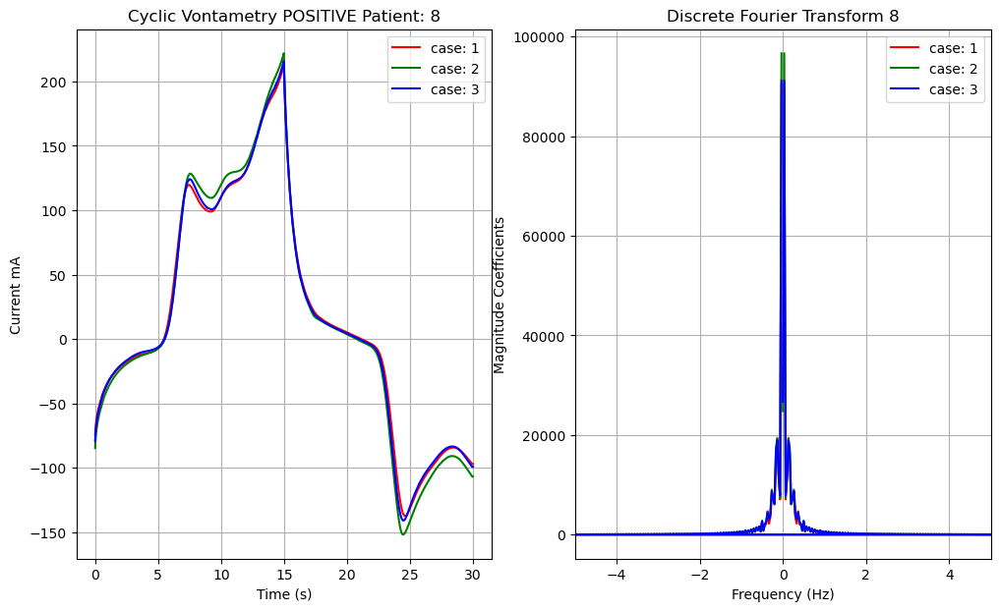

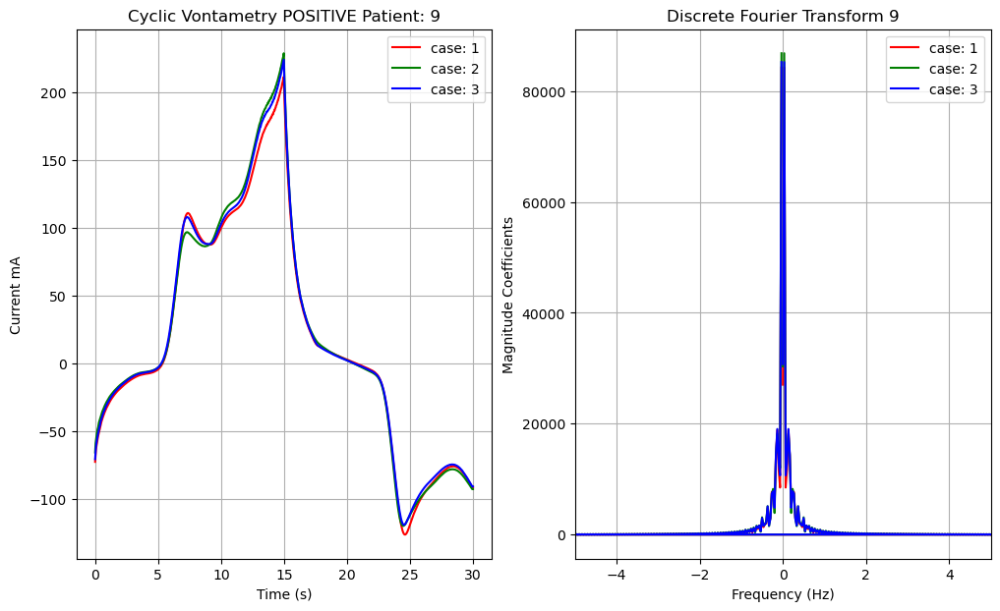

In [73]:
patient_count = 1
patients = final_pos_df.columns
patient_anterior = ''
plots = 0
time_pos = getTime(0.1, potential_pos)
sample_period = time_pos[1] - time_pos[0]
positive_fft_df = pd.DataFrame()

for i in range (1, final_pos_df.shape[1]):
    
    current = final_pos_df.iloc[:,i].values
    (fft, freqs) = getFFTAndFrequencies(current, sample_period)
    positive_fft_df[patients[i] + " freq"] = freqs
    positive_fft_df[patients[i] + " fft"] = fft
     
    if  patient_anterior != patients[i][9]:
        plots = 0
        fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2,figsize=(12,7))
        patient_anterior = patients[i][9]
        
        ax1.set_title("Cyclic Vontametry POSITIVE Patient: " + str(patient_count))
        ax1.set_ylabel("Current mA")
        ax1.set_xlabel("Time (s)")
        ax1.grid(True)
        
        ax2.set_title("Discrete Fourier Transform " + str(patient_count))
        ax2.set_ylabel("Magnitude Coefficients")
        ax2.set_xlabel("Frequency (Hz)")
        ax2.set_xlim((-5,5))
        ax2.grid(True)
        patient_count += 1
        
          
    ax1.plot(time_pos, current, color=colors[plots], label="case: " + str(plots + 1))
    ax1.legend() 
    ax2.plot(freqs, fft, color=colors[plots], label="case: " + str(plots + 1))
    ax2.legend()
    plots += 1
    
plt.show()

In [74]:
positive_fft_df.shape

(1503, 52)

In [75]:
negative_fft_df.shape

(1500, 58)

In [307]:
# Salvando os dados da fft de cada elemento
positive_fft_df.to_csv("../data/positive_fft.csv")
negative_fft_df.to_csv("../data/negative_fft.csv")

In [76]:
final_neg_df.head(10)

,Potencial (V),Paciente J (1),Paciente J (2),Paciente J (3),Paciente K (1),Paciente K (2),Paciente K (3),Paciente L (1),Paciente L (2),Paciente L (3),...,Paciente P (2),Paciente P (3),Paciente Q (1),Paciente Q (2),Paciente Q (3),Paciente R (1),Paciente R (2),Paciente S (1),Paciente S (2),Paciente S (3)
0,-0.499945,-67.782283,-64.094782,-65.782309,-68.344831,-69.532275,-68.719864,-63.657284,-63.969731,-59.782147,...,-78.594923,-52.844524,-75.907469,-71.094871,-70.157290,-95.282674,-92.095137,-63.782215,-56.094646,-58.219671
1,-0.497945,-63.657284,-60.469747,-61.719656,-64.407229,-65.407276,-64.157248,-59.719682,-59.219718,-55.844665,...,-74.157357,-48.719525,-71.157336,-66.844821,-66.094756,-89.782596,-87.657571,-59.782147,-52.032113,-54.469585
2,-0.495945,-61.219692,-57.594657,-59.282184,-62.032223,-62.657237,-61.157227,-56.594610,-56.344628,-52.657127,...,-70.719838,-46.344519,-68.594813,-63.969731,-63.344717,-86.157560,-84.095001,-56.657076,-48.969507,-51.782012
3,-0.493945,-58.532119,-55.094600,-57.344675,-59.657216,-60.407162,-59.219718,-54.844618,-54.157138,-50.969601,...,-68.344831,-44.219494,-66.032290,-61.532259,-61.469674,-83.532572,-81.595063,-54.282069,-47.344446,-49.719572
4,-0.491945,-56.782126,-53.782105,-55.907130,-57.844639,-59.219718,-57.532191,-53.094625,-51.969528,-49.532056,...,-66.282272,-43.094397,-64.094782,-59.532166,-59.469700,-80.782533,-79.720020,-53.032041,-45.156956,-48.032045
5,-0.489945,-55.594563,-51.969528,-54.219604,-56.344628,-57.657123,-55.719614,-51.719546,-50.344586,-48.032045,...,-65.094709,-41.719437,-62.157273,-58.094621,-57.719707,-78.282475,-77.594995,-51.282048,-43.781996,-46.031952
6,-0.487945,-54.469585,-50.844550,-52.907109,-55.032134,-55.969596,-54.469585,-50.157070,-49.282074,-46.406984,...,-63.782215,-39.591229,-60.657144,-56.532145,-56.532145,-76.032400,-75.469971,-50.344586,-42.469501,-44.656992
7,-0.485945,-53.407073,-49.532056,-51.844597,-53.907037,-54.844618,-53.469539,-49.469471,-47.969580,-45.907021,...,-62.032223,-38.541222,-59.657216,-55.532098,-55.532098,-74.032426,-73.844910,-48.719525,-40.434992,-43.906927
8,-0.483945,-52.157044,-48.406959,-50.719500,-52.844524,-54.032087,-52.219510,-48.094511,-47.219515,-44.656992,...,-60.907245,-37.622452,-58.219671,-53.969622,-53.969622,-72.282314,-71.907401,-47.844410,-39.353728,-41.803765
9,-0.481945,-50.844550,-47.344446,-49.782038,-51.844597,-52.844524,-51.469564,-46.782017,-46.156883,-43.197536,...,-60.032129,-36.691189,-57.094693,-52.844524,-52.844524,-70.469856,-70.407391,-47.344446,-38.266218,-40.728748


In [77]:
final_pos_df.head(10)

,Potencial (V),Paciente A (1),Paciente A (2),Paciente A (3),Paciente B (1),Paciente B (2),Paciente B (3),Paciente C (1),Paciente C (2),Paciente C (3),...,Paciente F (3),Paciente G (1),Paciente G (2),Paciente G (3),Paciente H (1),Paciente H (2),Paciente H (3),Paciente I (1),Paciente I (2),Paciente I (3)
0,-0.499957,-66.344690,-72.021055,-68.542004,-72.4697,-64.0833,-63.2685,-63.259315,-62.142372,-62.618446,...,-62.907219,-80.407500,-73.157430,-63.907266,-74.094892,-84.595084,-79.032421,-72.7824,-65.8448,-70.7823
1,-0.497961,-62.417030,-68.029308,-64.165711,-67.5532,-59.4507,-58.8464,-58.709097,-57.793546,-58.013272,...,-59.657216,-76.844931,-69.657326,-60.719728,-70.344806,-79.970002,-74.907422,-69.5323,-61.6572,-67.5948
2,-0.495964,-59.615469,-65.181971,-61.062026,-64.2847,-56.3470,-55.8618,-55.706120,-54.753947,-54.982829,...,-56.719661,-74.094892,-67.719817,-57.657123,-68.032265,-77.407479,-72.032332,-66.9073,-58.9072,-64.8447
3,-0.493968,-57.546353,-63.021278,-58.773184,-61.9867,-54.1955,-53.7835,-53.609514,-52.574968,-52.849627,...,-54.532051,-72.407365,-65.657258,-55.782080,-65.844774,-74.782372,-69.907308,-64.2823,-57.3447,-62.4073
4,-0.491971,-55.825138,-61.226821,-56.905460,-60.1831,-52.4834,-52.1355,-51.952386,-50.826287,-51.119256,...,-52.907109,-70.532322,-64.032197,-53.907037,-64.157248,-72.532415,-68.094850,-62.6572,-55.2821,-60.7822
5,-0.489975,-54.433513,-59.752798,-55.385661,-58.7732,-51.1650,-50.8171,-50.661469,-49.452972,-49.727631,...,-51.719546,-69.469810,-62.532187,-52.594543,-62.344670,-70.907354,-66.032290,-61.5947,-53.7821,-59.7197
6,-0.487979,-53.142595,-58.370328,-53.994060,-57.4914,-49.9474,-49.6178,-49.471283,-48.189521,-48.427558,...,-50.157070,-67.782283,-61.594725,-51.344514,-61.032176,-69.782376,-65.094709,-60.4072,-52.7196,-57.9071
7,-0.485982,-51.952386,-57.079434,-52.703142,-56.2829,-48.8304,-48.4825,-48.345160,-47.017622,-47.219038,...,-49.282074,-66.094756,-60.657144,-50.219536,-59.907198,-68.219781,-63.219786,-58.7822,-51.5946,-56.8446
8,-0.483985,-50.853753,-55.889225,-51.531243,-55.2117,-47.8142,-47.4479,-47.319746,-45.946431,-46.102095,...,-47.969580,-65.282226,-59.282184,-49.344540,-58.907151,-67.344785,-61.969757,-57.7822,-50.5320,-55.9696
9,-0.481989,-49.874115,-54.808879,-50.496674,-54.2596,-46.9078,-46.5415,-46.422529,-44.994283,-45.113301,...,-47.406912,-64.032197,-57.969689,-47.907114,-58.032155,-65.719724,-61.094761,-56.9072,-49.4695,-54.4071


In [78]:
final_neg_df.tail(10)

,Potencial (V),Paciente J (1),Paciente J (2),Paciente J (3),Paciente K (1),Paciente K (2),Paciente K (3),Paciente L (1),Paciente L (2),Paciente L (3),...,Paciente P (2),Paciente P (3),Paciente Q (1),Paciente Q (2),Paciente Q (3),Paciente R (1),Paciente R (2),Paciente S (1),Paciente S (2),Paciente S (3)
1490,-0.479945,-90.367007,-87.816966,-87.541962,-91.760778,-94.317067,-92.742050,-86.623204,-93.254554,-87.460721,...,-95.910847,-83.479404,-98.710883,-95.567083,-97.004616,-114.029872,-110.548568,-89.804506,-82.773137,-86.298192
1491,-0.481945,-90.604508,-88.079476,-87.791967,-91.973281,-94.567072,-92.904544,-86.854458,-93.479562,-87.598217,...,-96.010840,-83.666909,-98.729634,-95.592093,-97.092116,-114.054871,-110.661077,-89.841998,-82.916892,-86.479449
1492,-0.483945,-90.885770,-88.366973,-88.135719,-92.217040,-94.798326,-93.135798,-87.135708,-93.723309,-87.804472,...,-96.185851,-83.904409,-98.779643,-95.660841,-97.223365,-114.173627,-110.879827,-89.985752,-83.098149,-86.716950
1493,-0.485945,-91.167021,-88.635731,-88.423228,-92.423296,-95.023334,-93.304551,-87.423217,-93.935812,-87.985718,...,-96.304595,-84.066916,-98.798382,-95.679593,-97.292113,-114.236116,-111.017323,-90.067005,-83.248150,-86.941957
1494,-0.487945,-91.392028,-88.923240,-88.673234,-92.629540,-95.260835,-93.542063,-87.666965,-94.192064,-88.185728,...,-96.498358,-84.291911,-98.860884,-95.754588,-97.398365,-114.317369,-111.204827,-90.185761,-83.460653,-87.160707
1495,-0.489945,-91.629529,-89.173245,-88.973236,-92.873299,-95.479584,-93.698311,-87.916970,-94.385827,-88.335729,...,-96.617103,-84.454417,-98.885894,-95.779598,-97.460866,-114.367378,-111.361074,-90.260756,-83.623159,-87.366962
1496,-0.491945,-91.942036,-89.473248,-89.248240,-93.104553,-95.723343,-93.910813,-88.173223,-94.642079,-88.535726,...,-96.748352,-84.679425,-98.948395,-95.810843,-97.579622,-114.504886,-111.573577,-90.410757,-83.766913,-87.579465
1497,-0.493945,-92.154539,-89.716995,-89.535749,-93.323302,-95.910847,-94.048321,-88.410735,-94.860828,-88.673234,...,-96.879613,-84.873176,-98.948395,-95.823348,-97.692120,-114.561129,-111.729836,-90.473258,-83.935666,-87.785721
1498,-0.495945,-92.429543,-89.991999,-89.810753,-93.535805,-96.148348,-94.242072,-88.679481,-95.110834,-88.854492,...,-97.017109,-85.079432,-99.017143,-95.885849,-97.767127,-114.673638,-111.917341,-90.560758,-84.091914,-87.979472
1499,-0.497945,-92.667043,-90.235758,-90.054500,-93.717062,-96.304595,-94.392073,-88.885736,-95.292079,-88.960743,...,-97.123361,-85.223186,-99.029636,-95.917094,-97.842121,-114.717388,-112.079835,-90.617013,-84.229410,-88.173223


In [79]:
final_pos_df.tail(10)

,Potencial (V),Paciente A (1),Paciente A (2),Paciente A (3),Paciente B (1),Paciente B (2),Paciente B (3),Paciente C (1),Paciente C (2),Paciente C (3),...,Paciente F (3),Paciente G (1),Paciente G (2),Paciente G (3),Paciente H (1),Paciente H (2),Paciente H (3),Paciente I (1),Paciente I (2),Paciente I (3)
1493,-0.481989,-90.386820,-93.014431,-93.582058,-98.0316,-90.8812,-88.5924,-90.450907,-94.268703,-91.009378,...,-89.560747,-90.898263,-87.741971,-89.066994,-95.529592,-105.035984,-97.648370,-89.6295,-91.1358,-89.0545
1494,-0.483985,-90.661478,-93.316555,-93.783474,-98.2696,-91.1467,-88.8212,-90.652323,-94.479275,-91.256571,...,-89.810753,-91.217017,-88.073230,-89.366996,-95.779598,-105.354738,-97.898376,-89.9983,-91.4545,-89.4045
1495,-0.485982,-90.972757,-93.627834,-94.030666,-98.5626,-91.4855,-89.1051,-90.936136,-94.744802,-91.558719,...,-90.017009,-91.485775,-88.323224,-89.598250,-96.023345,-105.623484,-98.173380,-90.2920,-91.7170,-89.7170
1496,-0.487979,-91.265726,-93.939114,-94.268703,-98.8464,-91.7876,-89.3797,-91.183329,-94.991994,-91.842532,...,-90.304506,-91.773283,-88.635731,-89.929497,-96.310854,-105.904746,-98.429632,-90.6608,-92.0545,-90.0608
1497,-0.489975,-91.512942,-94.213772,-94.470119,-99.0661,-92.0531,-89.6086,-91.375589,-95.184255,-92.071414,...,-90.523267,-92.029536,-88.929486,-90.179503,-96.523356,-106.198502,-98.692131,-90.9420,-92.3358,-90.3545
1498,-0.491971,-91.732669,-94.442654,-94.607472,-99.2584,-92.2820,-89.8009,-91.540408,-95.358205,-92.245364,...,-90.760767,-92.329538,-89.241993,-90.492010,-96.773362,-106.479764,-98.954642,-91.2795,-92.6108,-90.6795
1499,-0.493968,-92.053103,-94.772267,-94.854665,-99.5422,-92.6116,-90.0939,-91.815066,-95.614553,-92.538333,...,-90.954518,-92.604542,-89.504492,-90.729511,-97.004616,-106.761003,-99.173391,-91.6295,-92.9045,-90.9545
1500,-0.495964,-92.318606,-95.046926,-95.046926,-99.7803,-92.8954,-90.3410,-92.025638,-95.834279,-92.785525,...,-90.954518,-92.604542,-89.504492,-90.729511,-97.004616,-106.761003,-99.173391,-91.6295,-92.9045,-90.9545
1501,-0.497961,-92.639041,-95.367360,-95.294118,-100.0730,-93.2067,-90.6249,-92.291141,-96.108961,-93.060207,...,-90.954518,-92.604542,-89.504492,-90.729511,-97.004616,-106.761003,-99.173391,-91.6295,-92.9045,-90.9545
1502,-0.499957,-92.867923,-95.614553,-95.458913,-100.2660,-93.4447,-90.8080,-92.483401,-96.282911,-93.243313,...,-90.954518,-92.604542,-89.504492,-90.729511,-97.004616,-106.761003,-99.173391,-91.6295,-92.9045,-90.9545


In [77]:
final_neg_df.to_csv("../data/neg_final.csv")

In [78]:
final_pos_df.to_csv("../data/pos_final.csv")

# Observando os dados positivos e negativos em função do tempo
## Positivos = Vermelho
## Negativos = Azul

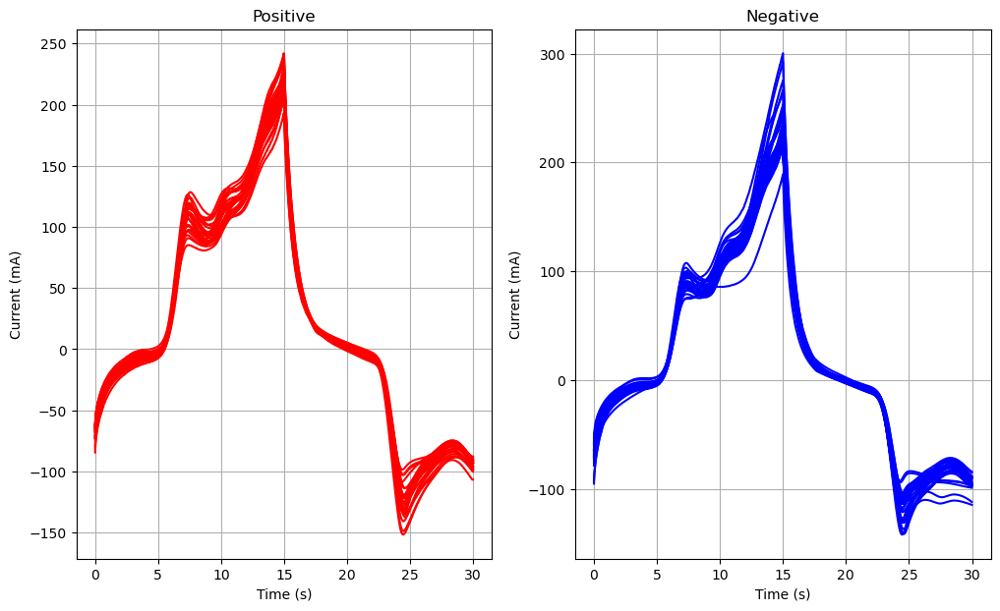

In [80]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,7))

for i in range(1, final_pos_df.shape[1]):
    current = final_pos_df.iloc[:,i]
    ax1.plot(time_pos, current, color='r')
    
for i in range(1, final_neg_df.shape[1]):
    current = final_neg_df.iloc[:,i]
    ax2.plot(time_neg, current, color='b')
   
ax1.set_ylabel("Current (mA)")
ax1.set_xlabel("Time (s)")
ax1.set_title("Positive")
ax1.grid()
ax2.set_ylabel("Current (mA)")
ax2.set_xlabel("Time (s)")
ax2.set_title("Negative")
ax2.grid()
plt.show()
    

# Plotando a transformada de Fourier dos casos positivo e negativo
## Positivo: azul
## Negativo: vermelho

Além disso, aqui será montado o dataset no domínio da frequência com a extração de features
Caso Positivo: 1
Caso Negativo: 0

In [81]:
freq = positive_fft_df.iloc[:,0]
fft = positive_fft_df.iloc[:,1]
print(getFreqDomainFeatures(fft, freq, 1))

[11.529513009624972, 87108.41762612374, 313.53233170809426, 86794.88529441565, 18.243009384870284, 11.529513009625049, 11.529513009625276, 3450.7754615979775, 29073.790663973992, 471239.0945572656, -25.028066727308104, 25.028066727308104, -6.927813833801189e-16, 25.028066727308104, 0.0, -25.01974622640142, -24.994784723681367, 14.459578341949184, 1]


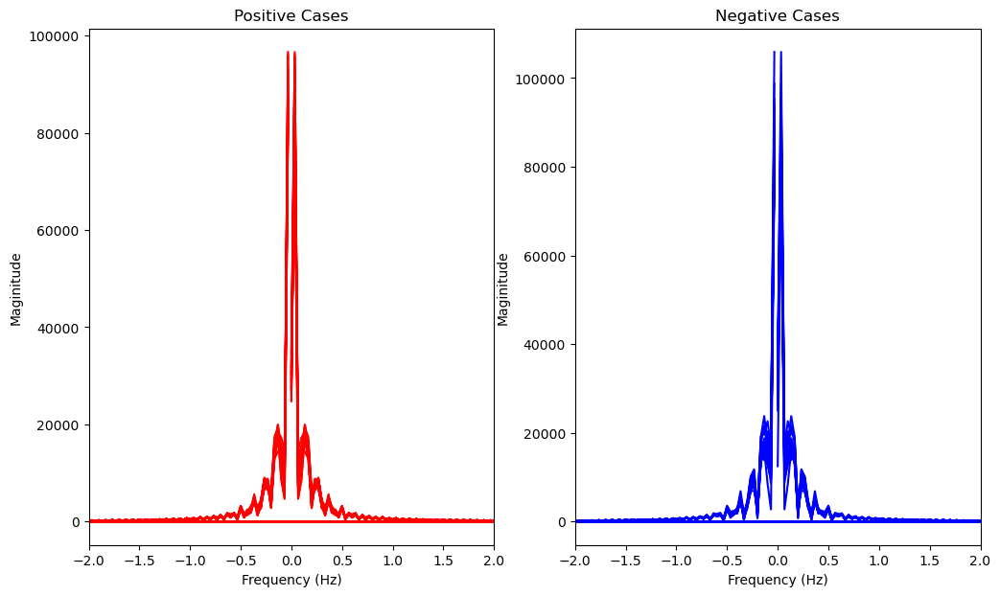

In [82]:
freq = 0
fft = 0
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols= 2, figsize=(12,7))
label = 1
frequency_dataFrame = pd.DataFrame(columns=frequency_domain_columns)

for i in range (positive_fft_df.shape[1]):
    if i % 2 == 0:
        freq = positive_fft_df.iloc[:,i]
    else:
        fft = positive_fft_df.iloc[:,i]
        ax1.plot(freq, fft, color='r')
        frequency_dataFrame.loc[len(frequency_dataFrame.index)] = getFreqDomainFeatures(fft, freq, 1)

label = 0  
for i in range (negative_fft_df.shape[1]):
    if i % 2 == 0:
        freq = negative_fft_df.iloc[:,i]
    else:
        fft = negative_fft_df.iloc[:,i]
        ax2.plot(freq, fft, color='b')
        frequency_dataFrame.loc[len(frequency_dataFrame.index)] = getFreqDomainFeatures(fft, freq, 0)

ax1.set_ylabel("Maginitude")
ax1.set_xlabel("Frequency (Hz)")
ax1.set_xlim((-2,2))
ax1.set_title("Positive Cases") 
ax2.set_ylabel("Maginitude")
ax2.set_xlabel("Frequency (Hz)")
ax2.set_xlim((-2,2))
ax2.set_title("Negative Cases")         
plt.show()
        

In [95]:
frequency_dataFrame.to_csv("../data/frequency_dataset.csv")

In [83]:
frequency_dataFrame['label'].value_counts()

0.0    29
1.0    26
Name: label, dtype: int64

# Plotando a derivada em função do tempo
### Positivo azul
### Negativo vermelho

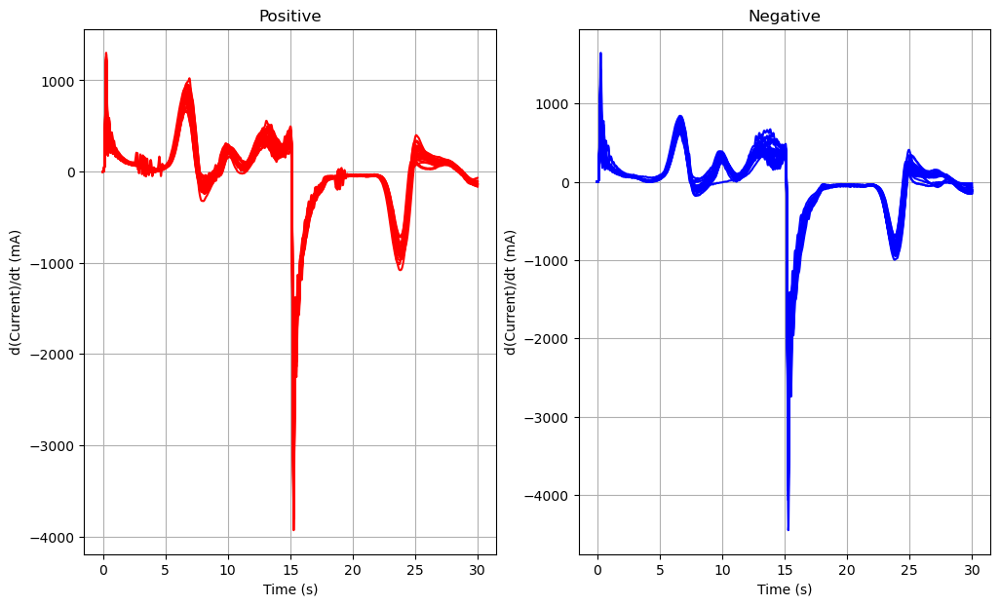

In [84]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,7))

for i in range(1, pos_derivate_df.shape[1]):
    current = pos_derivate_df.iloc[:,i]
    ax[0].plot(time_pos, current, color='r')
    
for i in range(1, neg_derivate_df.shape[1]):
    current = neg_derivate_df.iloc[:,i]
    ax[1].plot(time_neg, current, color='b')
     
ax[0].set_ylabel("d(Current)/dt (mA)")
ax[0].set_xlabel("Time (s)")
ax[0].set_title("Positive")
ax[0].grid()
ax[1].set_ylabel("d(Current)/dt (mA)")
ax[1].set_xlabel("Time (s)")
ax[1].set_title("Negative")
ax[1].grid()
plt.show()

## Features Extraction
    1 - Corrente de pico anódica
    2 - Corrente de pico catódica
    3 - Diferença entre os potenciais de corrente de pico anódica e catódica
    4 - Diferença entre as áreas sob a curva
    5 - Coeficiente angular das retas de oxidação e redução


Utilizando primeiro uma unica curva para calcular as features

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


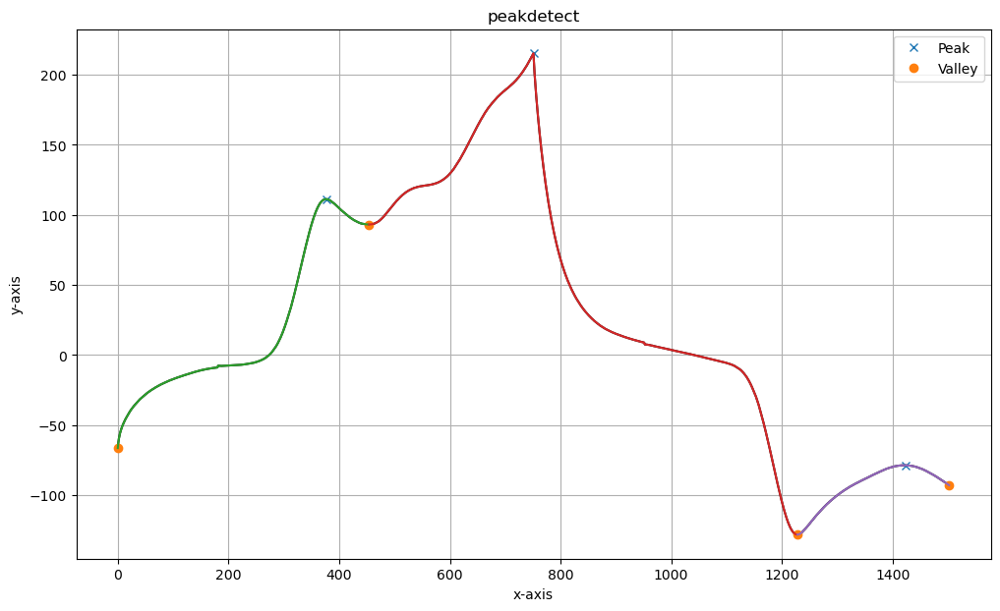

(None,
 <AxesSubplot:title={'center':'peakdetect'}, xlabel='x-axis', ylabel='y-axis'>)

In [55]:
# Encontrando os picos das duas funções
fp = findpeaks(method='peakdetect', lookahead=50)
current_cyclic = final_pos_df.iloc[:,1]
results = fp.fit(current_cyclic)
fp.plot(figsize=(12,7))

In [57]:
results_df = results['df']

In [58]:
# Separando os picos relacionados à oxidação
results_oxidation = results_df.iloc[100:500, :]
results_reduction = results_df.iloc[900:1300, :]

In [74]:
arg_anodic = results_oxidation[results_oxidation['peak'] == True]['x'].values[0]
print(f"Anodic Potential: {potential_pos[arg_anodic]} V")
print(f"Anodic Current: {current_cyclic[arg_anodic]} mA")

Anodic Potential: 0.25270465 V
Anodic Current: 111.2062454 mA


In [73]:
arg_cathodic = results_reduction[results_reduction['valley'] == True]['x'].values[0]
print(f"Cathodic Potential: {potential_pos[arg_cathodic]} V")
print(f"Cathodic Current: {current_cyclic[arg_cathodic]} mA")

Cathodic Potential: 0.047070231 V
Cathodic Current: -128.0704975 mA


In [123]:
# retornando os picos e os vales da função
peaks = results['df']['peak']
valleys = results['df']['valley']
all_peaks = []                          # The position of all peaks in a curve
all_valleys = []                        # The position of all valleys in a curve

for i, peak in enumerate(peaks.values):
    if peak == True:
        all_peaks.append(i)
        
for i, valley in enumerate(valleys.values):
    if valley == True:
        all_valleys.append(i)
        
print(f"Number of peaks: {len(all_peaks)}")
print(f"Number of valleys: {len(all_valleys)}")

Number of peaks: 3
Number of valleys: 4
